## 1. Импорт библиотек

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.feature_selection import SelectFromModel, mutual_info_regression
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l1_l2
import warnings
warnings.filterwarnings('ignore')

# Настройка стиля визуализации
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
sns.set(font_scale=1.2)
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14

# Функция для улучшения внешнего вида графиков
def setup_plot_aesthetics(ax, title, xlabel, ylabel):
    ax.set_title(title, fontweight='bold', pad=20)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.tight_layout()

## 2. Загрузка и первичный анализ данных

In [3]:
# Загружаем данные
print("Загрузка и первичный анализ датасета Spotify...")
df = pd.read_csv('dataset.csv')

# Вывод базовой информации о датасете
print("\n--- Базовая информация о датасете ---")
print(f"Размер датасета: {df.shape[0]} строк, {df.shape[1]} колонок")
print("\nПервые 5 строк датасета:")
display(df.head())

print("\nОписательная статистика:")
display(df.describe())

print("\nИнформация о колонках:")
df.info()

print("\nПроверка на пропущенные значения:")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({'Missing Values': missing_values, 
                          'Percentage': missing_percentage})
display(missing_df[missing_df['Missing Values'] > 0])

# Если есть пропущенные значения, выполним их обработку
if missing_df[missing_df['Missing Values'] > 0].shape[0] > 0:
    print("\nОбработка пропущенных значений...")
    # Для числовых колонок заполним медианой
    num_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in num_cols:
        if df[col].isnull().sum() > 0:
            df[col] = df[col].fillna(df[col].median())
            
    # Для категориальных колонок заполним наиболее частым значением
    cat_cols = df.select_dtypes(include=['object']).columns
    for col in cat_cols:
        if df[col].isnull().sum() > 0:
            df[col] = df[col].fillna(df[col].mode()[0])
    
    print("Проверка после обработки пропущенных значений:")
    display(df.isnull().sum())

Загрузка и первичный анализ датасета Spotify...

--- Базовая информация о датасете ---
Размер датасета: 114000 строк, 21 колонок

Первые 5 строк датасета:


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic



Описательная статистика:


,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000



Информация о колонках:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 

,Missing Values,Percentage
artists,1,0.000877
album_name,1,0.000877
track_name,1,0.000877



Обработка пропущенных значений...
Проверка после обработки пропущенных значений:


Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

## 3. Анализ целевой переменной


--- Анализ целевой переменной popularity ---


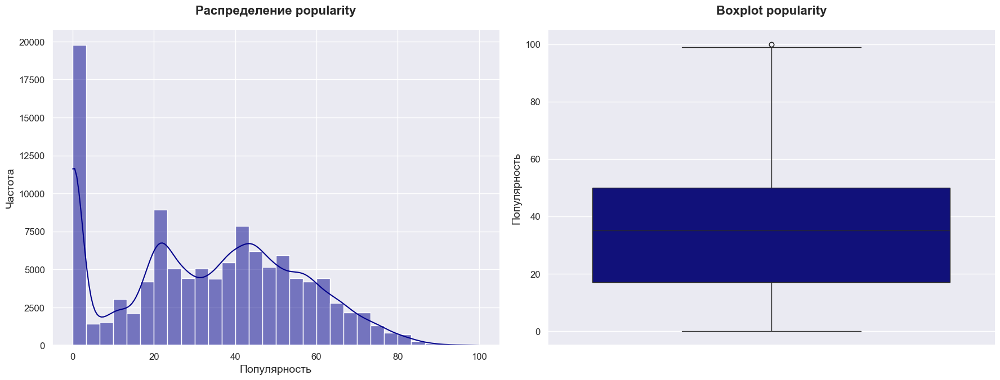

Минимальное значение popularity: 0
Максимальное значение popularity: 100
Среднее значение popularity: 33.24
Медианное значение popularity: 35.0
Стандартное отклонение popularity: 22.31
Skewness (асимметрия): 0.05
Kurtosis (эксцесс): -0.93

Комментарий: Анализ распределения целевой переменной 'popularity' показывает её характер распределения, наличие выбросов и диапазон значений. Информация поможет в дальнейшем моделировании.


In [4]:
print("\n--- Анализ целевой переменной popularity ---")
fig, ax = plt.subplots(1, 2, figsize=(18, 7))

# Гистограмма распределения popularity
sns.histplot(df['popularity'], kde=True, ax=ax[0], bins=30, color='darkblue')
setup_plot_aesthetics(ax[0], 'Распределение popularity', 'Популярность', 'Частота')

# Boxplot для popularity
sns.boxplot(y=df['popularity'], ax=ax[1], color='darkblue')
setup_plot_aesthetics(ax[1], 'Boxplot popularity', '', 'Популярность')

plt.tight_layout()
plt.show()

print(f"Минимальное значение popularity: {df['popularity'].min()}")
print(f"Максимальное значение popularity: {df['popularity'].max()}")
print(f"Среднее значение popularity: {df['popularity'].mean():.2f}")
print(f"Медианное значение popularity: {df['popularity'].median()}")
print(f"Стандартное отклонение popularity: {df['popularity'].std():.2f}")
print(f"Skewness (асимметрия): {df['popularity'].skew():.2f}")
print(f"Kurtosis (эксцесс): {df['popularity'].kurtosis():.2f}")

# Комментарий к анализу распределения
print("\nКомментарий: Анализ распределения целевой переменной 'popularity' показывает её характер распределения, " +
     "наличие выбросов и диапазон значений. Информация поможет в дальнейшем моделировании.")

## 4. Анализ числовых признаков и корреляций


Корреляционная матрица числовых признаков с popularity:


popularity          1.000000
loudness            0.050423
danceability        0.035448
Unnamed: 0          0.032142
time_signature      0.031073
tempo               0.013205
energy              0.001056
key                -0.003853
liveness           -0.005387
duration_ms        -0.007101
mode               -0.013931
acousticness       -0.025472
valence            -0.040534
speechiness        -0.044927
instrumentalness   -0.095139
Name: popularity, dtype: float64

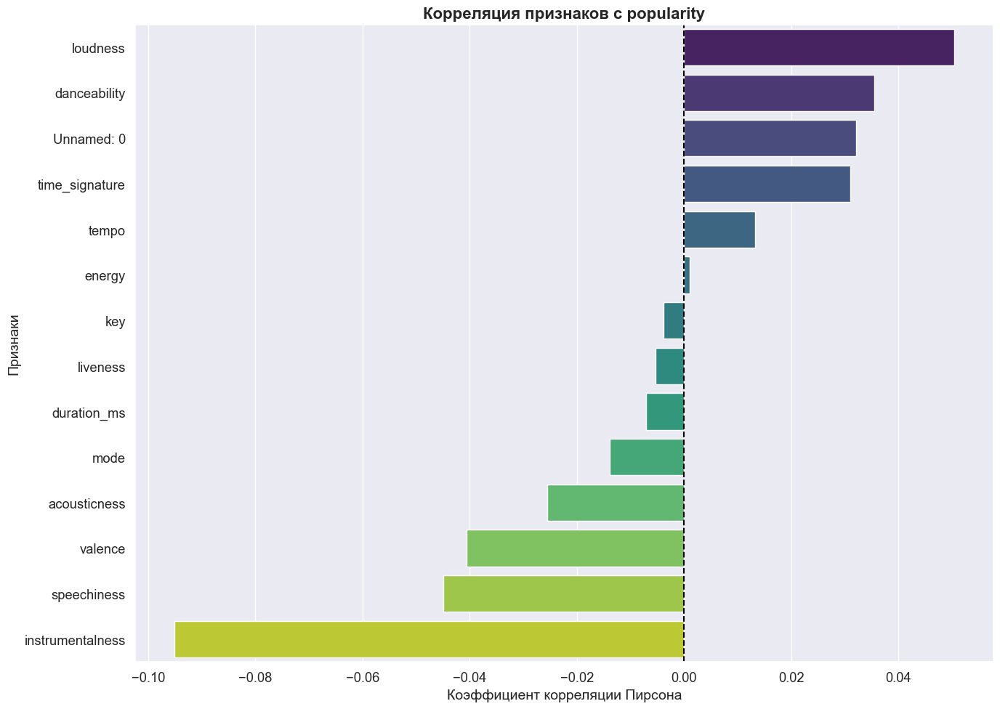


Комментарий: Корреляционный анализ показывает силу и направление линейной связи между признаками и целевой переменной. Положительная корреляция означает, что с ростом значения признака растет и популярность, отрицательная - обратную зависимость.


In [5]:
# Определяем числовые колонки, исключая id и целевую переменную
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'id' in numerical_columns:
    numerical_columns.remove('id')
if 'popularity' in numerical_columns:
    numerical_columns.remove('popularity')

# Корреляционная матрица
print("\nКорреляционная матрица числовых признаков с popularity:")
correlation_with_target = df[numerical_columns + ['popularity']].corr()['popularity'].sort_values(ascending=False)
display(correlation_with_target)

# Визуализация корреляции с целевой переменной
plt.figure(figsize=(14, 10))
correlation_data = correlation_with_target[correlation_with_target.index != 'popularity']
sns.barplot(x=correlation_data.values, y=correlation_data.index, palette='viridis')
plt.title('Корреляция признаков с popularity', fontweight='bold', fontsize=16)
plt.xlabel('Коэффициент корреляции Пирсона')
plt.ylabel('Признаки')
plt.axvline(x=0, color='black', linestyle='--')
plt.tight_layout()
plt.show()

print("\nКомментарий: Корреляционный анализ показывает силу и направление линейной связи между признаками и целевой переменной. " +
     "Положительная корреляция означает, что с ростом значения признака растет и популярность, отрицательная - обратную зависимость.")

## 5. Тепловая карта корреляций

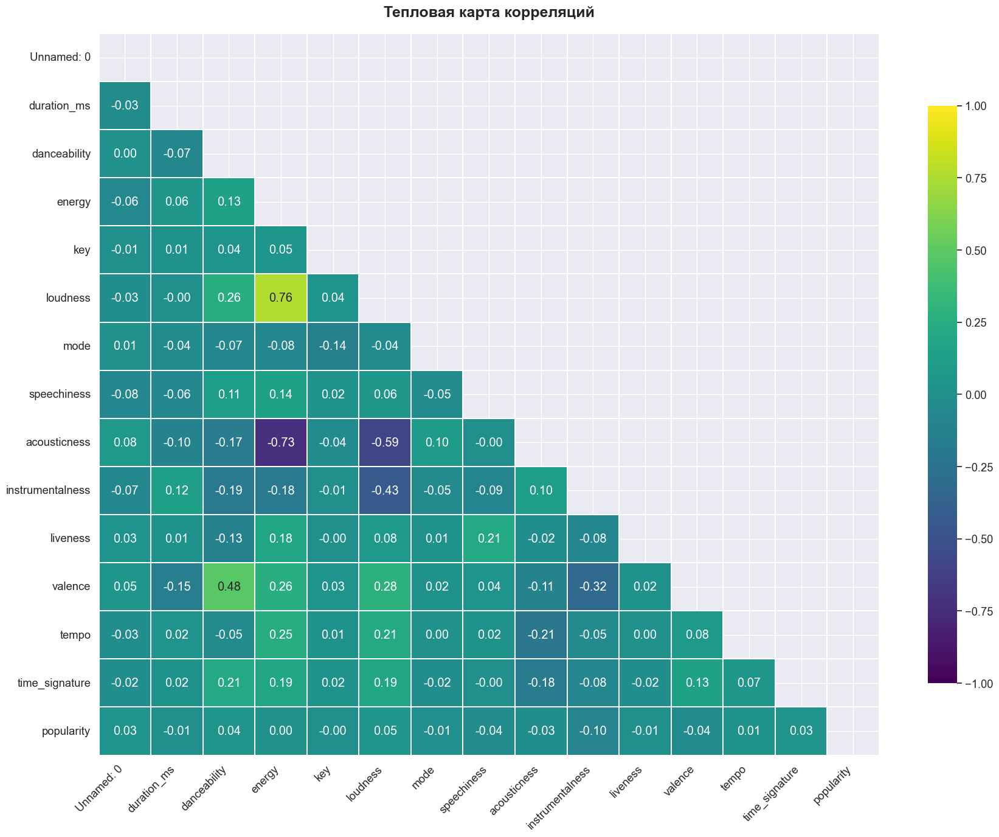


Комментарий: Тепловая карта визуализирует взаимосвязи между всеми признаками. Сильно коррелирующие признаки могут вызвать мультиколлинеарность в моделях, что может негативно сказаться на качестве предсказаний.

Пары признаков с высокой корреляцией (> 0.7):
energy - loudness: 0.762
energy - acousticness: 0.734


In [6]:
# Построение тепловой карты корреляций
plt.figure(figsize=(18, 14))
corr_matrix = df[numerical_columns + ['popularity']].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='viridis', 
            cbar_kws={"shrink": .8}, linewidths=0.1, vmin=-1, vmax=1)
plt.title('Тепловая карта корреляций', fontweight='bold', fontsize=18, pad=20)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("\nКомментарий: Тепловая карта визуализирует взаимосвязи между всеми признаками. " +
     "Сильно коррелирующие признаки могут вызвать мультиколлинеарность в моделях, " +
     "что может негативно сказаться на качестве предсказаний.")

# Определяем пары признаков с высокой корреляцией
high_corr_pairs = []
for i in range(len(numerical_columns)):
    for j in range(i+1, len(numerical_columns)):
        corr_value = abs(corr_matrix.iloc[i, j])
        if corr_value > 0.7:
            high_corr_pairs.append((numerical_columns[i], numerical_columns[j], corr_value))

if high_corr_pairs:
    print("\nПары признаков с высокой корреляцией (> 0.7):")
    for feat1, feat2, corr in sorted(high_corr_pairs, key=lambda x: x[2], reverse=True):
        print(f"{feat1} - {feat2}: {corr:.3f}")

## 6. Анализ зависимостей между признаками и целевой переменной

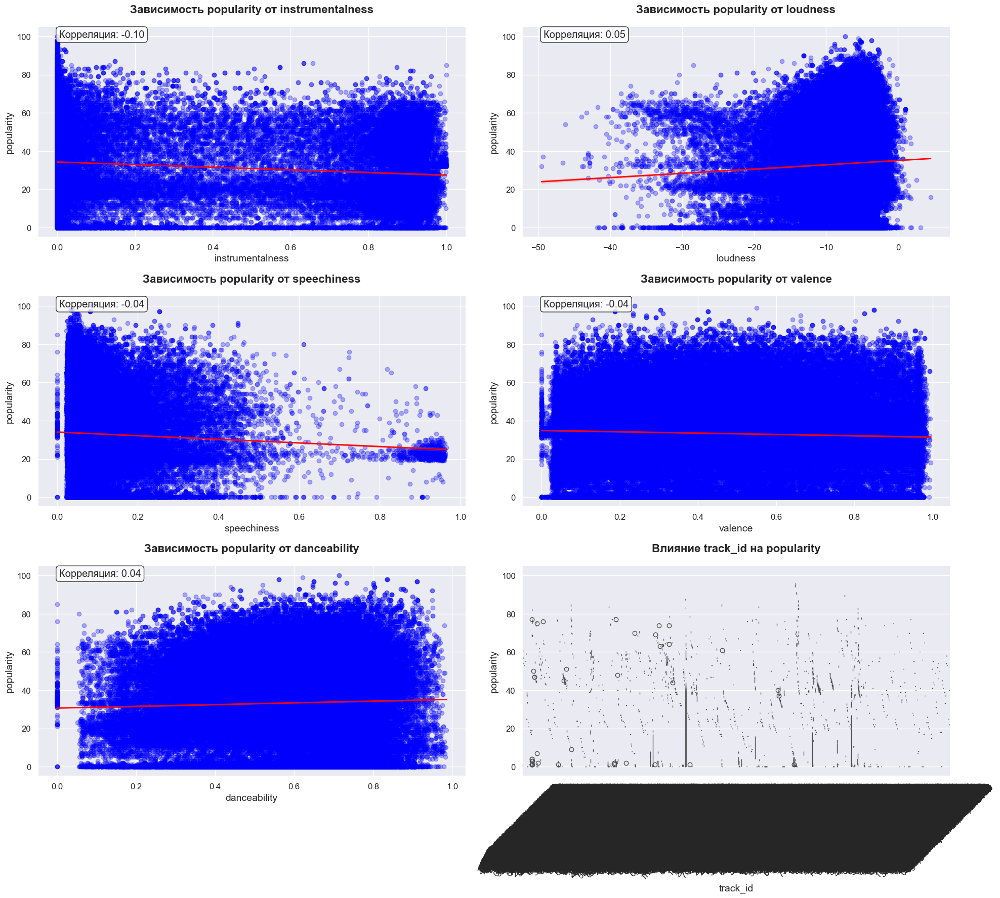


Комментарий: Анализ зависимостей позволяет визуально оценить характер связи между наиболее важными признаками и целевой переменной. Регрессионная линия показывает тренд зависимости.


In [7]:
# Выбираем топ-5 признаков с наибольшей корреляцией (по модулю)
top_features = correlation_data.abs().sort_values(ascending=False).head(5).index

fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    if i < len(axes):
        # Scatter plot с регрессионной линией
        sns.regplot(x=df[feature], y=df['popularity'], ax=axes[i], 
                   scatter_kws={'alpha':0.3, 'color':'blue'}, 
                   line_kws={'color':'red', 'linewidth':2})
        setup_plot_aesthetics(axes[i], f'Зависимость popularity от {feature}', feature, 'popularity')
        
        # Добавляем коэффициент корреляции
        corr_coef = df[[feature, 'popularity']].corr().iloc[0, 1]
        axes[i].annotate(f'Корреляция: {corr_coef:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', 
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.8))

# Если есть категориальные признаки, добавим их анализ
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()
if categorical_columns and len(axes) > len(top_features):
    for i, cat_col in enumerate(categorical_columns[:len(axes)-len(top_features)]):
        idx = len(top_features) + i
        if idx < len(axes):
            # Boxplot для категориальных признаков
            sns.boxplot(x=df[cat_col], y=df['popularity'], ax=axes[idx])
            setup_plot_aesthetics(axes[idx], f'Влияние {cat_col} на popularity', cat_col, 'popularity')
            axes[idx].tick_params(axis='x', rotation=45)

# Скрываем пустые подграфики, если такие есть
for i in range(len(top_features) + min(len(categorical_columns), len(axes)-len(top_features)), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

print("\nКомментарий: Анализ зависимостей позволяет визуально оценить характер связи между наиболее важными признаками " +
     "и целевой переменной. Регрессионная линия показывает тренд зависимости.")

## 7. Анализ аудио-признаков


--- Анализ аудио-характеристик треков ---


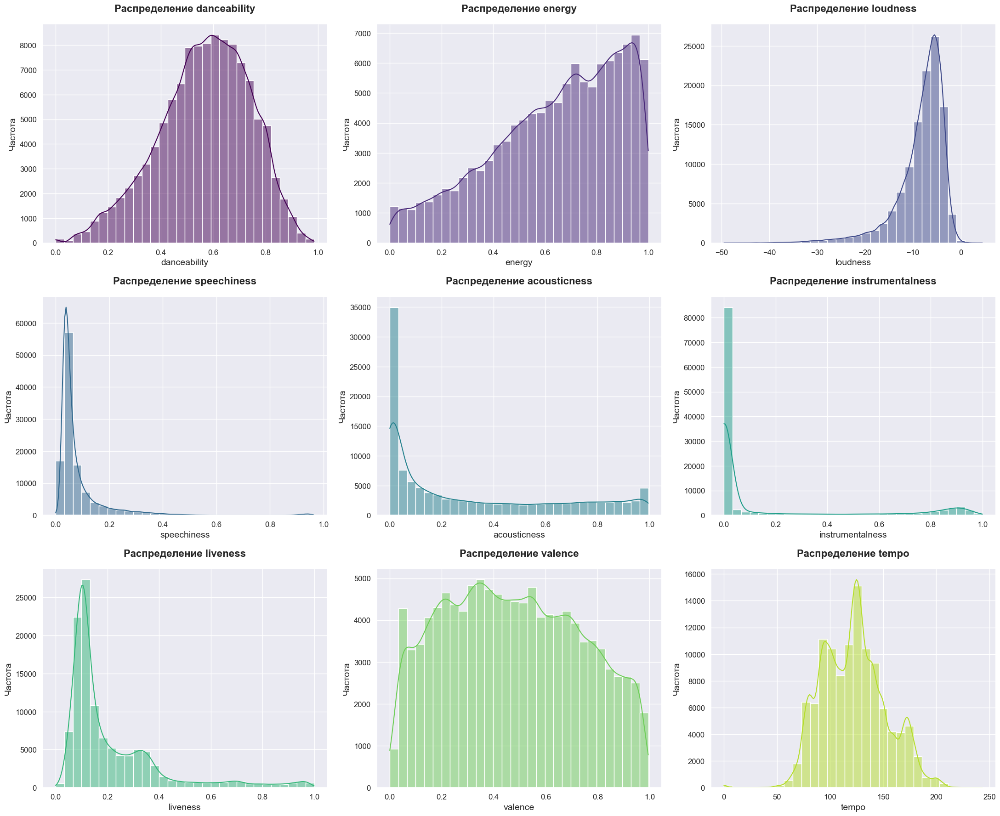


Комментарий: Анализ аудио-характеристик показывает различные паттерны распределения, что помогает понять особенности набора данных и возможные трансформации для улучшения модели.

--- Матрица рассеяния для аудио-признаков ---


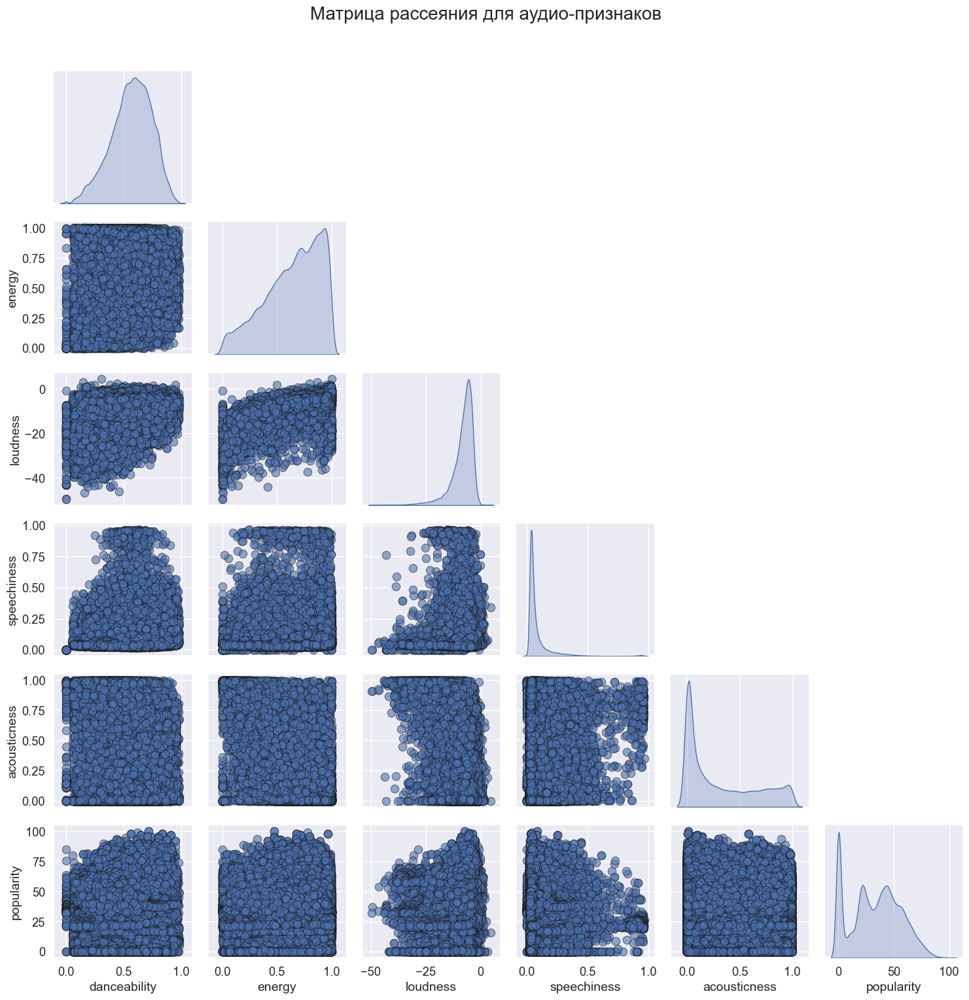


Комментарий: Матрица рассеяния позволяет увидеть взаимосвязи между аудио-признаками и их совместное влияние на популярность.


In [7]:
# Анализ аудио-признаков (характеристик треков)
audio_features = [col for col in numerical_columns if col in ['acousticness', 'danceability', 'energy', 
                                                            'instrumentalness', 'liveness', 'loudness', 
                                                            'speechiness', 'valence', 'tempo']]

if audio_features:
    print("\n--- Анализ аудио-характеристик треков ---")
    
    # Распределение аудио-характеристик
    fig, axes = plt.subplots(3, 3, figsize=(22, 18))
    axes = axes.flatten()
    
    for i, feature in enumerate(audio_features):
        if i < len(axes):
            sns.histplot(df[feature], kde=True, ax=axes[i], bins=30, 
                       color=plt.cm.viridis(i/len(audio_features)))
            setup_plot_aesthetics(axes[i], f'Распределение {feature}', feature, 'Частота')
    
    # Скрываем пустые подграфики, если такие есть
    for i in range(len(audio_features), len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    print("\nКомментарий: Анализ аудио-характеристик показывает различные паттерны распределения, " +
         "что помогает понять особенности набора данных и возможные трансформации для улучшения модели.")

    # Матрица рассеяния для аудио-признаков
    print("\n--- Матрица рассеяния для аудио-признаков ---")
    audio_subset = audio_features[:5]  # Возьмем только часть признаков для ясности
    audio_df = df[audio_subset + ['popularity']]
    
    sns.pairplot(audio_df, diag_kind='kde', corner=True, plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
    plt.suptitle('Матрица рассеяния для аудио-признаков', fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()
    
    print("\nКомментарий: Матрица рассеяния позволяет увидеть взаимосвязи между аудио-признаками " +
         "и их совместное влияние на популярность.")

## 8. Анализ популярности по годам (если есть)

In [8]:
# Анализ популярности по годам (если есть данные о годе релиза)
if 'release_date' in df.columns or 'year' in df.columns:
    print("\n--- Анализ популярности по годам ---")
    
    # Создаем колонку с годом, если ее нет
    if 'year' not in df.columns and 'release_date' in df.columns:
        try:
            df['year'] = pd.to_datetime(df['release_date']).dt.year
        except:
            # Если формат даты нестандартный, попробуем другие варианты
            try:
                # Если это строка вида '1990-01-01'
                df['year'] = df['release_date'].str[:4].astype(int)
            except:
                print("Не удалось извлечь год из release_date")
    
    if 'year' in df.columns:
        # Группируем по годам и вычисляем среднюю популярность
        yearly_popularity = df.groupby('year')['popularity'].agg(['mean', 'median', 'count']).reset_index()
        
        # Визуализация в виде двух графиков
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
        
        # График средней популярности по годам
        sns.lineplot(x='year', y='mean', data=yearly_popularity, marker='o', linewidth=2.5, ax=ax1)
        ax1.set_title('Средняя популярность треков по годам', fontweight='bold', fontsize=16)
        ax1.set_xlabel('Год')
        ax1.set_ylabel('Средняя популярность')
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='x', rotation=45)
        
        # График количества треков по годам
        sns.barplot(x='year', y='count', data=yearly_popularity, ax=ax2, alpha=0.7)
        ax2.set_title('Количество треков по годам', fontweight='bold', fontsize=16)
        ax2.set_xlabel('Год')
        ax2.set_ylabel('Количество треков')
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        print("\nКомментарий: Анализ популярности треков по годам показывает, как менялась средняя популярность " +
             "с течением времени, а также распределение количества треков в датасете по годам.")

## 9. Анализ выбросов


--- Анализ выбросов ---


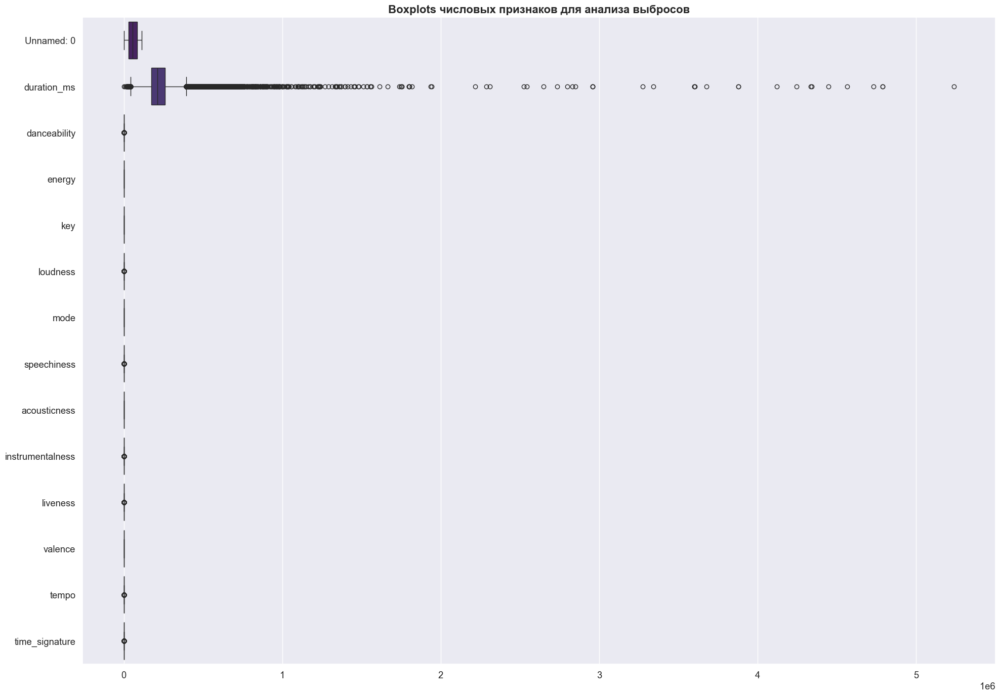

,Feature,Outliers Count,Outliers Percent
4,instrumentalness,25246,22.145614
3,speechiness,13211,11.588596
7,time_signature,12157,10.664035
5,liveness,8642,7.580702
2,loudness,6173,5.414912
0,duration_ms,5617,4.927193
1,danceability,620,0.543860
6,tempo,617,0.541228



Комментарий: Анализ выбросов показывает наличие экстремальных значений в ряде признаков. Большой процент выбросов может указывать на необходимость трансформации данных или использование робастных методов масштабирования.


In [9]:
print("\n--- Анализ выбросов ---")

# Определяем числовые признаки (исключаем целевую переменную, если нужно)
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_columns = [col for col in numerical_columns if col != 'popularity']

plt.figure(figsize=(20, 14))
df_numerical = df[numerical_columns]
sns.boxplot(data=df_numerical, orient='h', palette='viridis')
plt.title('Boxplots числовых признаков для анализа выбросов', fontweight='bold', fontsize=16)
plt.tight_layout()
plt.show()

# Метод IQR для определения выбросов
def get_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
    return outliers.count(), outliers.count() / len(df) * 100

# Статистика выбросов
outliers_stats = []
for col in numerical_columns:
    count, percent = get_outliers(df, col)
    if count > 0:
        outliers_stats.append({'Feature': col, 'Outliers Count': count, 'Outliers Percent': percent})

if outliers_stats:
    outliers_df = pd.DataFrame(outliers_stats).sort_values('Outliers Percent', ascending=False)
    display(outliers_df)
    
    print("\nКомментарий: Анализ выбросов показывает наличие экстремальных значений в ряде признаков. " +
         "Большой процент выбросов может указывать на необходимость трансформации данных " +
         "или использование робастных методов масштабирования.")


## 10. Feature Engineering - Создание новых признаков

In [10]:
print("\n\n========== FEATURE ENGINEERING ==========")
print("\nСоздание новых признаков на основе существующих...")
# Объявляем список аудио-признаков (если ещё не было)
audio_features = [
    'danceability', 'energy', 'valence', 'acousticness',
    'instrumentalness', 'speechiness', 'liveness', 'loudness', 'tempo'
]

# Объявляем числовые признаки
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
numerical_columns = [col for col in numerical_columns if col != 'popularity']

# Вычисляем корреляции и топ-признаки
correlation_df = df[numerical_columns + ['popularity']].corr()['popularity'].drop('popularity')
correlation_df = correlation_df.reset_index().rename(columns={'index': 'feature', 'popularity': 'pearson_corr'})
correlation_df['abs_corr'] = correlation_df['pearson_corr'].abs()
top_features = correlation_df.sort_values('abs_corr', ascending=False).head(5)['feature'].tolist()

# Копируем датафрейм для feature engineering
df_fe = df.copy()

# 1. Нормализация числовых признаков (масштабирование в диапазон [0, 1])
for col in numerical_columns:
    df_fe[f'{col}_normalized'] = (df_fe[col] - df_fe[col].min()) / (df_fe[col].max() - df_fe[col].min())

# 2. Создание признаков на основе аудио-характеристик
if len(audio_features) >= 2:
    # Энергетический индекс (комбинация energy и loudness)
    if 'energy' in audio_features and 'loudness' in audio_features:
        df_fe['energy_loudness_index'] = df_fe['energy'] * (1 + (df_fe['loudness'] - df_fe['loudness'].min()) / 
                                                          (df_fe['loudness'].max() - df_fe['loudness'].min()))
    
    # Индекс танцевальности (комбинация danceability и energy)
    if 'danceability' in audio_features and 'energy' in audio_features:
        df_fe['dance_energy_index'] = df_fe['danceability'] * df_fe['energy']
    
    # Индекс акустического эмоционального восприятия
    if 'acousticness' in audio_features and 'valence' in audio_features:
        df_fe['acoustic_mood_index'] = df_fe['acousticness'] * df_fe['valence']
    
    # Индекс живого исполнения
    if 'liveness' in audio_features and 'instrumentalness' in audio_features:
        df_fe['performance_index'] = df_fe['liveness'] / (1 + df_fe['instrumentalness'])
    
    # Индекс вокального присутствия
    if 'speechiness' in audio_features and 'instrumentalness' in audio_features:
        df_fe['vocal_presence'] = df_fe['speechiness'] / (1 + df_fe['instrumentalness'])
    
    # Суммарный аудио-индекс
    if all(feat in audio_features for feat in ['danceability', 'energy', 'valence']):
        df_fe['audio_appeal_index'] = (df_fe['danceability'] + df_fe['energy'] + df_fe['valence']) / 3
    
    # Комплексный индекс популярности (вдохновленный эвристикой)
    if all(feat in audio_features for feat in ['danceability', 'energy', 'valence', 'loudness']):
        # Нормализуем loudness для объединения с другими метриками
        loudness_norm = (df_fe['loudness'] - df_fe['loudness'].min()) / (df_fe['loudness'].max() - df_fe['loudness'].min())
        df_fe['appeal_score'] = (0.4 * df_fe['danceability'] + 
                                0.3 * df_fe['energy'] + 
                                0.2 * df_fe['valence'] + 
                                0.1 * loudness_norm)

# 3. Полиномиальные признаки для top-5 признаков с наибольшей корреляцией
for feature in top_features:
    df_fe[f'{feature}_squared'] = df_fe[feature] ** 2
    df_fe[f'{feature}_cubed'] = df_fe[feature] ** 3
    df_fe[f'{feature}_sqrt'] = np.sqrt(np.abs(df_fe[feature]))  # Используем abs для отрицательных значений

# 4. Логарифмические и экспоненциальные преобразования
for feature in numerical_columns:
    # Log трансформация для положительных значений с правосторонним распределением
    if df_fe[feature].min() > 0:
        df_fe[f'{feature}_log'] = np.log1p(df_fe[feature])
    
    # Exp трансформация (безопасная, с нормализацией)
    feature_scaled = (df_fe[feature] - df_fe[feature].min()) / (df_fe[feature].max() - df_fe[feature].min())
    df_fe[f'{feature}_exp'] = np.exp(feature_scaled) - 1

# 5. Взаимодействия между признаками (для топ-5 признаков)
if len(top_features) >= 2:
    for i in range(len(top_features)):
        for j in range(i+1, len(top_features)):
            df_fe[f'{top_features[i]}_times_{top_features[j]}'] = df_fe[top_features[i]] * df_fe[top_features[j]]
            ratio_name = f'{top_features[i]}_div_{top_features[j]}'
            df_fe[ratio_name] = df_fe[top_features[i]] / (df_fe[top_features[j]] + 1e-5)  # Избегаем деления на ноль

# 6. Бинаризация некоторых признаков
for feature in audio_features:
    if feature in df.columns:
        df_fe[f'{feature}_high'] = (df_fe[feature] > df_fe[feature].median()).astype(int)
        df_fe[f'{feature}_low'] = (df_fe[feature] < df_fe[feature].quantile(0.25)).astype(int)
        df_fe[f'{feature}_very_high'] = (df_fe[feature] > df_fe[feature].quantile(0.75)).astype(int)

# 7. Создание категориальных признаков
# Классификация темпа
if 'tempo' in df.columns:
    df_fe['tempo_category'] = pd.cut(df_fe['tempo'], 
                                   bins=[0, 80, 120, 180, float('inf')], 
                                   labels=['slow', 'medium', 'fast', 'very_fast'])
    # One-hot encoding для категориальных признаков
    tempo_dummies = pd.get_dummies(df_fe['tempo_category'], prefix='tempo')
    df_fe = pd.concat([df_fe, tempo_dummies], axis=1)

# Классификация энергии
if 'energy' in df.columns:
    df_fe['energy_category'] = pd.cut(df_fe['energy'], 
                                    bins=[0, 0.33, 0.66, 1.0], 
                                    labels=['low', 'medium', 'high'])
    energy_dummies = pd.get_dummies(df_fe['energy_category'], prefix='energy')
    df_fe = pd.concat([df_fe, energy_dummies], axis=1)

# 8. Удаляем признаки с большим числом NaN значений, если такие есть
before_cols = df_fe.shape[1]
df_fe = df_fe.dropna(axis=1, thresh=len(df_fe)*0.95)  # Удаляем колонки с >5% NaN значений
after_cols = df_fe.shape[1]
if before_cols > after_cols:
    print(f"Удалено {before_cols - after_cols} колонок из-за большого количества пропущенных значений")

# 9. Заполняем оставшиеся NaN значения
# Заполняем только числовые колонки их медианами
numeric_cols = df_fe.select_dtypes(include=['number']).columns
for col in df_fe.select_dtypes(include=['number']).columns:
    df_fe[col].fillna(df_fe[col].median(), inplace=True)



# Получаем список новых инженерных признаков
new_features = [col for col in df_fe.columns if col not in df.columns and col != 'popularity']
print(f"Создано {len(new_features)} новых признаков")
print("Примеры новых признаков:", new_features[:5], "...")



========== FEATURE ENGINEERING ==========

Создание новых признаков на основе существующих...
Создано 106 новых признаков
Примеры новых признаков: ['Unnamed: 0_normalized', 'duration_ms_normalized', 'danceability_normalized', 'energy_normalized', 'key_normalized'] ...


## 11. Анализ корреляции новых признаков с целевой переменной


--- Корреляция новых признаков с целевой переменной popularity ---


popularity                         1.000000
instrumentalness_times_loudness    0.064372
loudness_times_valence             0.064209
speechiness_low                    0.060942
loudness_times_speechiness         0.051717
loudness_exp                       0.051103
loudness_normalized                0.050423
danceability_sqrt                  0.043839
danceability_normalized            0.035448
Unnamed: 0_exp                     0.033517
Unnamed: 0_normalized              0.032142
time_signature_normalized          0.031073
time_signature_exp                 0.030083
danceability_exp                   0.026506
loudness_cubed                     0.026143
Name: popularity, dtype: float64

instrumentalness_times_speechiness   -0.094479
instrumentalness_normalized          -0.095139
instrumentalness_sqrt                -0.096264
instrumentalness_times_valence       -0.096679
instrumentalness_low                       NaN
Name: popularity, dtype: float64

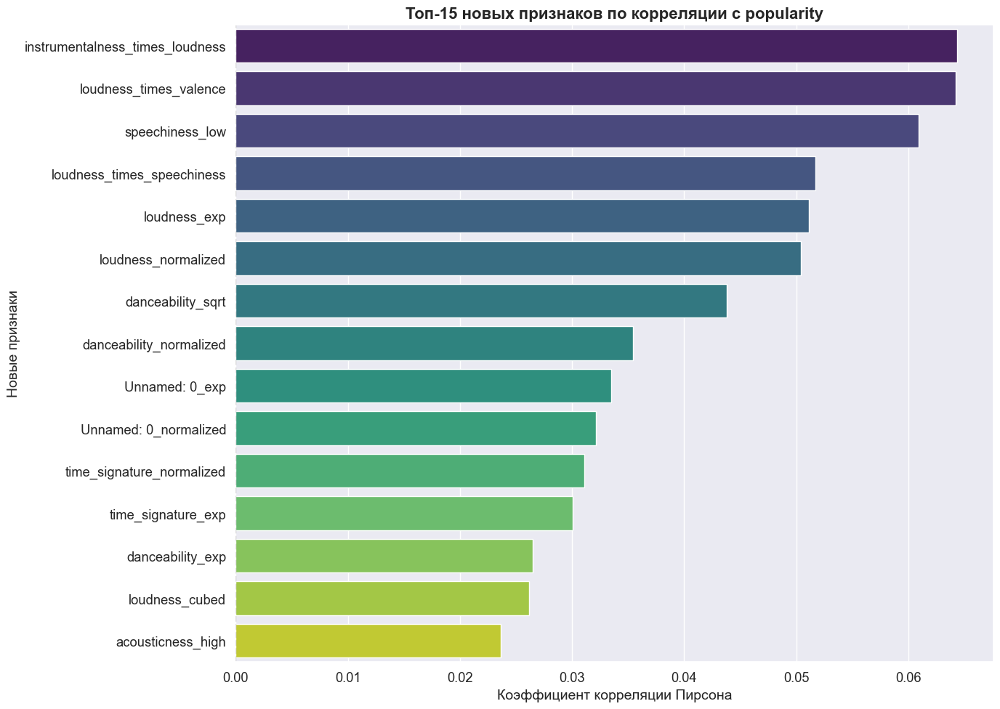


Комментарий: Среди новых признаков наиболее высокую корреляцию с целевой переменной имеют признаки, связанные с аудио-характеристиками треков и их трансформациями.


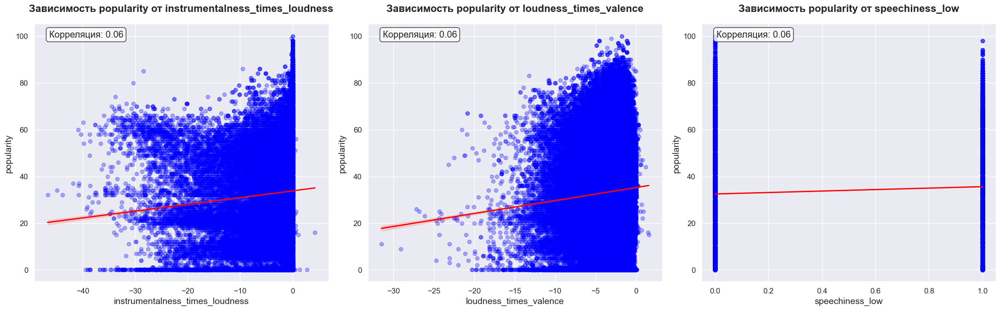


Комментарий: Графики показывают, что новые инженерные признаки демонстрируют более выраженную зависимость с целевой переменной, что должно повысить качество прогнозирования моделей.


In [11]:
# Корреляция новых признаков с целевой переменной
# Получим все числовые признаки из новых
numeric_cols = df_fe.select_dtypes(include='number').columns
new_numerical_features = [f for f in new_features if f in numeric_cols]


if new_numerical_features:
    print("\n--- Корреляция новых признаков с целевой переменной popularity ---")
    
    new_correlation = df_fe[new_numerical_features + ['popularity']].corr()['popularity'].sort_values(ascending=False)
    display(new_correlation.head(15))
    display(new_correlation.tail(5))
    
    # Визуализация топ-15 новых признаков по корреляции
    plt.figure(figsize=(14, 10))
    top_new_corr = new_correlation[new_correlation.index != 'popularity'].head(15)
    sns.barplot(x=top_new_corr.values, y=top_new_corr.index, palette='viridis')
    plt.title('Топ-15 новых признаков по корреляции с popularity', fontweight='bold', fontsize=16)
    plt.xlabel('Коэффициент корреляции Пирсона')
    plt.ylabel('Новые признаки')
    plt.axvline(x=0, color='black', linestyle='--')
    plt.tight_layout()
    plt.show()
    
    print("\nКомментарий: Среди новых признаков наиболее высокую корреляцию с целевой переменной имеют " +
         "признаки, связанные с аудио-характеристиками треков и их трансформациями.")

    # Анализ лучших инженерных признаков с точки зрения целевой переменной
    top_new_features = top_new_corr.head(3).index
    
    fig, axes = plt.subplots(1, 3, figsize=(22, 7))
    
    for i, feature in enumerate(top_new_features):
        sns.regplot(x=df_fe[feature], y=df_fe['popularity'], ax=axes[i], 
                   scatter_kws={'alpha':0.3, 'color':'blue'}, 
                   line_kws={'color':'red', 'linewidth':2})
        setup_plot_aesthetics(axes[i], f'Зависимость popularity от {feature}', feature, 'popularity')
        
        # Добавляем коэффициент корреляции
        corr_coef = df_fe[[feature, 'popularity']].corr().iloc[0, 1]
        axes[i].annotate(f'Корреляция: {corr_coef:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', 
                       bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    print("\nКомментарий: Графики показывают, что новые инженерные признаки демонстрируют более выраженную " +
         "зависимость с целевой переменной, что должно повысить качество прогнозирования моделей.")

## 12. Оценка важности признаков с использованием множества методов



========== FEATURE IMPORTANCE ==========
Количество признаков для моделирования: 119
Размер обучающей выборки: (91200, 123)
Размер тестовой выборки: (22800, 123)

--- Важность признаков на основе RandomForest ---


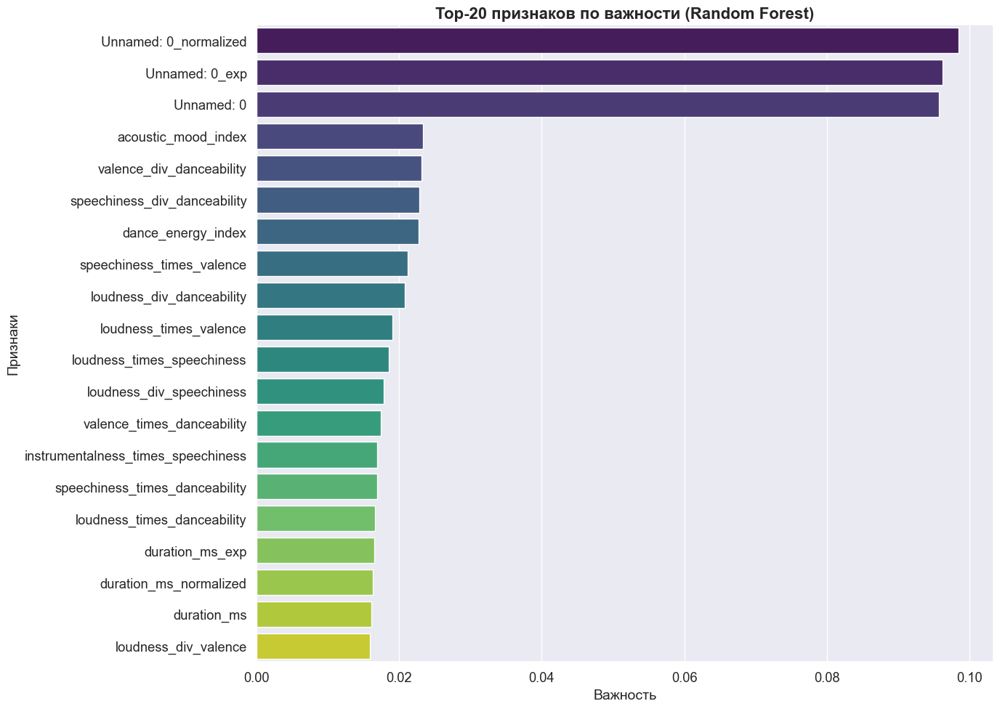

Топ-10 признаков по важности (Random Forest):


,feature,importance
15,Unnamed: 0_normalized,0.098412
51,Unnamed: 0_exp,0.096256
0,Unnamed: 0,0.095737
31,acoustic_mood_index,0.023402
84,valence_div_danceability,0.023140
82,speechiness_div_danceability,0.022833
30,dance_energy_index,0.022745
79,speechiness_times_valence,0.021248
78,loudness_div_danceability,0.020838
75,loudness_times_valence,0.019111



--- Permutation Importance ---


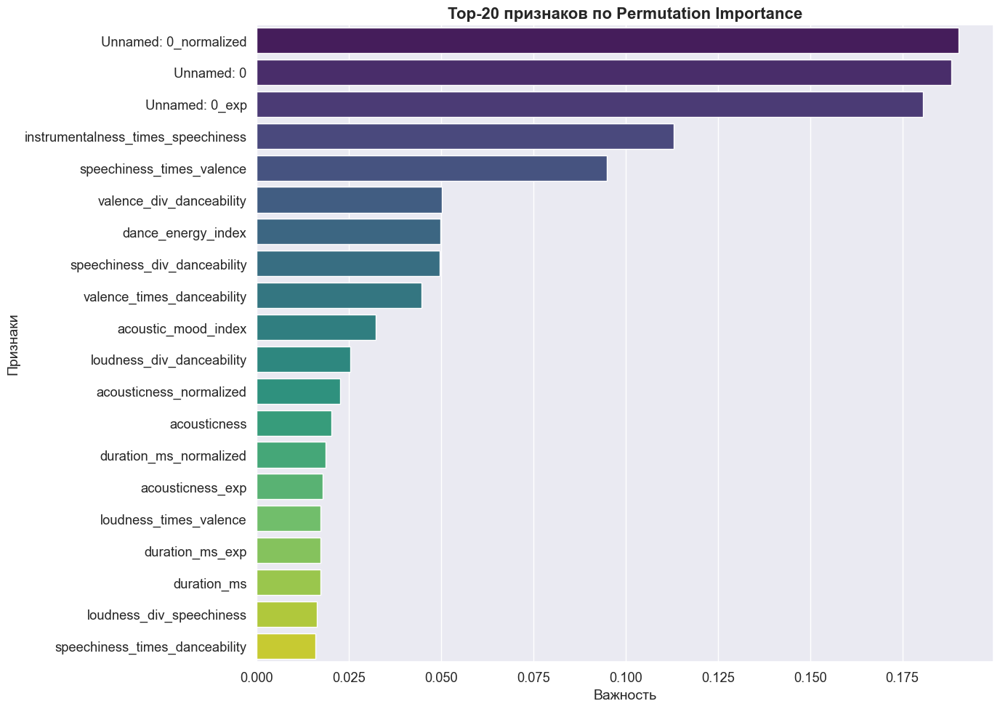

Топ-10 признаков по Permutation Importance:


,feature,importance
15,Unnamed: 0_normalized,0.190129
0,Unnamed: 0,0.188257
51,Unnamed: 0_exp,0.180502
67,instrumentalness_times_speechiness,0.113020
79,speechiness_times_valence,0.094880
84,valence_div_danceability,0.050157
30,dance_energy_index,0.049815
82,speechiness_div_danceability,0.049548
83,valence_times_danceability,0.044718
31,acoustic_mood_index,0.032396



--- Взаимная информация (Mutual Information) ---


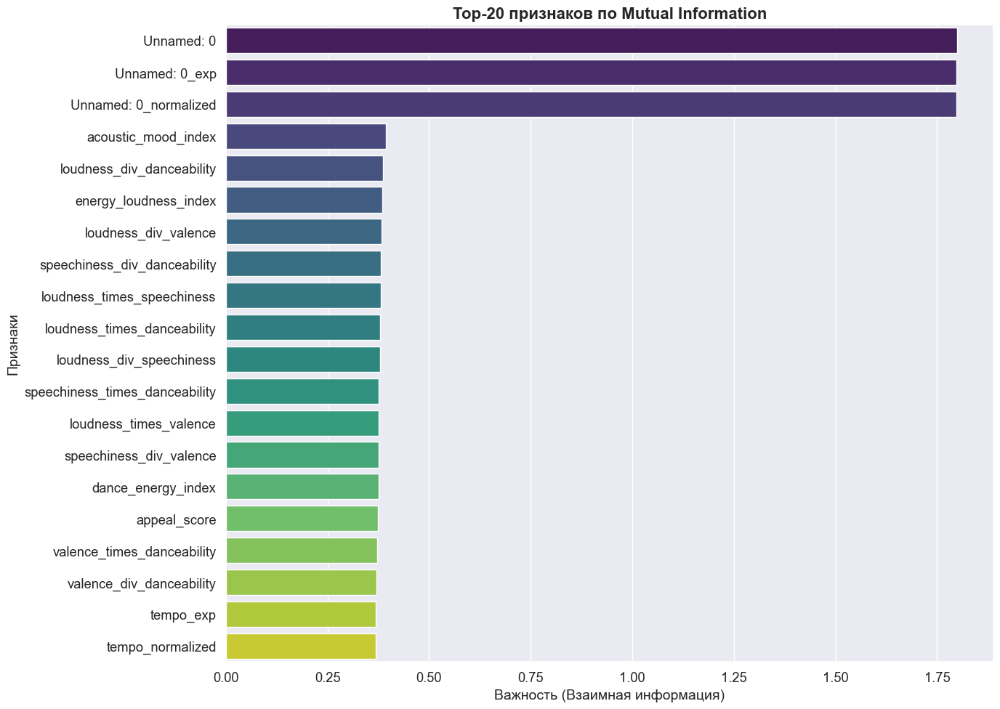

Топ-10 признаков по Mutual Information:


,feature,importance
0,Unnamed: 0,1.798517
51,Unnamed: 0_exp,1.798426
15,Unnamed: 0_normalized,1.798423
31,acoustic_mood_index,0.394500
78,loudness_div_danceability,0.386539
29,energy_loudness_index,0.384411
76,loudness_div_valence,0.383220
82,speechiness_div_danceability,0.381812
73,loudness_times_speechiness,0.380609
77,loudness_times_danceability,0.380171



--- Сводная таблица важности признаков ---
Признаки с наилучшим средним рангом важности:


,feature,Avg_Rank,RF_Importance_Rank,Permutation_Importance_Rank,Mutual_Information_Rank
15,Unnamed: 0_normalized,1.666667,1.0,1.0,3.0
0,Unnamed: 0,2.000000,3.0,2.0,1.0
51,Unnamed: 0_exp,2.333333,2.0,3.0,2.0
31,acoustic_mood_index,6.000000,4.0,10.0,4.0
82,speechiness_div_danceability,7.333333,6.0,8.0,8.0
78,loudness_div_danceability,8.333333,9.0,11.0,5.0
30,dance_energy_index,9.666667,7.0,7.0,15.0
84,valence_div_danceability,9.666667,5.0,6.0,18.0
79,speechiness_times_valence,12.666667,8.0,5.0,25.0
75,loudness_times_valence,13.000000,10.0,16.0,13.0



Выбрано 50 лучших признаков для дальнейшего моделирования


In [12]:
print("\n\n========== FEATURE IMPORTANCE ==========")
# Подготовка данных для анализа важности признаков
# Получаем все object и category колонки
object_cols = df_fe.select_dtypes(include=['object', 'category']).columns.tolist()

# Добавляем в список на удаление
cols_to_drop = ['id'] if 'id' in df_fe.columns else []
cols_to_drop.extend(object_cols)
cols_to_drop.extend([col for col in ['tempo_category', 'energy_category'] if col in df_fe.columns])

model_df = df_fe.drop(columns=cols_to_drop, errors='ignore')

# Список всех признаков для моделирования
features = [col for col in model_df.columns if col != 'popularity']
target = 'popularity'

print(f"Количество признаков для моделирования: {len(features)}")

# Разделение на обучающую и тестовую выборки
X = model_df[features]
y = model_df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Размер обучающей выборки: {X_train.shape}")
print(f"Размер тестовой выборки: {X_test.shape}")

# 1. Важность признаков на основе RandomForest
print("\n--- Важность признаков на основе RandomForest ---")
rf_importance = RandomForestRegressor(n_estimators=100, random_state=42)
rf_importance.fit(X_train, y_train)

feature_importances = pd.DataFrame({
    'feature': X_train.columns,
    'importance': rf_importance.feature_importances_
}).sort_values('importance', ascending=False)


# Визуализация топ-20 важных признаков
plt.figure(figsize=(14, 10))
sns.barplot(x='importance', y='feature', data=feature_importances.head(20), palette='viridis')
plt.title('Top-20 признаков по важности (Random Forest)', fontweight='bold', fontsize=16)
plt.xlabel('Важность')
plt.ylabel('Признаки')
plt.tight_layout()
plt.show()

print("Топ-10 признаков по важности (Random Forest):")
display(feature_importances.head(10))

# 2. Permutation Importance
print("\n--- Permutation Importance ---")
perm_importance = permutation_importance(rf_importance, X_test, y_test, n_repeats=10, random_state=42)
perm_importance_df = pd.DataFrame({
    'feature': X_test.columns,
    'importance': perm_importance.importances_mean
}).sort_values('importance', ascending=False)

plt.figure(figsize=(14, 10))
sns.barplot(x='importance', y='feature', data=perm_importance_df.head(20), palette='viridis')
plt.title('Top-20 признаков по Permutation Importance', fontweight='bold', fontsize=16)
plt.xlabel('Важность')
plt.ylabel('Признаки')
plt.tight_layout()
plt.show()

print("Топ-10 признаков по Permutation Importance:")
display(perm_importance_df.head(10))

# 3. Взаимная информация (Mutual Information) - нелинейная мера зависимости
print("\n--- Взаимная информация (Mutual Information) ---")
mi_scores = mutual_info_regression(X_train, y_train)
mi_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': mi_scores
}).sort_values('importance', ascending=False)

plt.figure(figsize=(14, 10))
sns.barplot(x='importance', y='feature', data=mi_importance.head(20), palette='viridis')
plt.title('Top-20 признаков по Mutual Information', fontweight='bold', fontsize=16)
plt.xlabel('Важность (Взаимная информация)')
plt.ylabel('Признаки')
plt.tight_layout()
plt.show()

print("Топ-10 признаков по Mutual Information:")
display(mi_importance.head(10))

current_features = X_train.columns.tolist()
# Сводная таблица важности признаков по разным метрикам
print("\n--- Сводная таблица важности признаков ---")
importance_summary = pd.DataFrame({
    'feature': current_features,
    'RF_Importance': rf_importance.feature_importances_,
    'Permutation_Importance': perm_importance.importances_mean,
    'Mutual_Information': mi_scores
})

# Ранжирование по каждой метрике
for col in ['RF_Importance', 'Permutation_Importance', 'Mutual_Information']:
    importance_summary[f'{col}_Rank'] = importance_summary[col].rank(ascending=False)

# Средний ранг по всем метрикам
importance_summary['Avg_Rank'] = importance_summary[[
    'RF_Importance_Rank', 'Permutation_Importance_Rank', 'Mutual_Information_Rank'
]].mean(axis=1)

# Сортировка по среднему рангу
importance_summary = importance_summary.sort_values('Avg_Rank')

print("Признаки с наилучшим средним рангом важности:")
display(importance_summary[['feature', 'Avg_Rank', 'RF_Importance_Rank', 
                         'Permutation_Importance_Rank', 'Mutual_Information_Rank']].head(20))

# Выбор топ-N признаков для моделирования на основе среднего ранга
top_n = 50  # Количество топ признаков для использования
top_features = importance_summary['feature'].head(top_n).tolist()

print(f"\nВыбрано {len(top_features)} лучших признаков для дальнейшего моделирования")

# Подготовка данных с отобранными признаками
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

## 13. Подготовка данных для моделирования

In [13]:
print("\n\n========== ПОДГОТОВКА ДАННЫХ ДЛЯ МОДЕЛИРОВАНИЯ ==========")

# Создаем различные версии масштабированных данных для разных типов моделей
# 1. StandardScaler - для линейных моделей и нейронных сетей
scaler_standard = StandardScaler()
X_train_scaled = scaler_standard.fit_transform(X_train_top)
X_test_scaled = scaler_standard.transform(X_test_top)

# 2. RobustScaler - более устойчив к выбросам
scaler_robust = RobustScaler()
X_train_robust = scaler_robust.fit_transform(X_train_top)
X_test_robust = scaler_robust.transform(X_test_top)

# 3. MinMaxScaler - для некоторых алгоритмов, чувствительных к диапазону значений
scaler_minmax = MinMaxScaler()
X_train_minmax = scaler_minmax.fit_transform(X_train_top)
X_test_minmax = scaler_minmax.transform(X_test_top)

# Создаем DataFrame из масштабированных данных для удобства
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=top_features, index=X_train_top.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=top_features, index=X_test_top.index)

print("Данные подготовлены и масштабированы разными способами для оптимальной работы с разными типами моделей.")



========== ПОДГОТОВКА ДАННЫХ ДЛЯ МОДЕЛИРОВАНИЯ ==========
Данные подготовлены и масштабированы разными способами для оптимальной работы с разными типами моделей.


## 14. Моделирование - функция оценки и базовые модели



========== МОДЕЛИРОВАНИЕ ==========

=== ЛИНЕЙНЫЕ МОДЕЛИ ===

--- Результаты для модели Linear Regression ---
MSE: 470.7058
RMSE: 21.6958
MAE: 17.8988
R²: 0.0462
Время обучения: 0.07 сек.


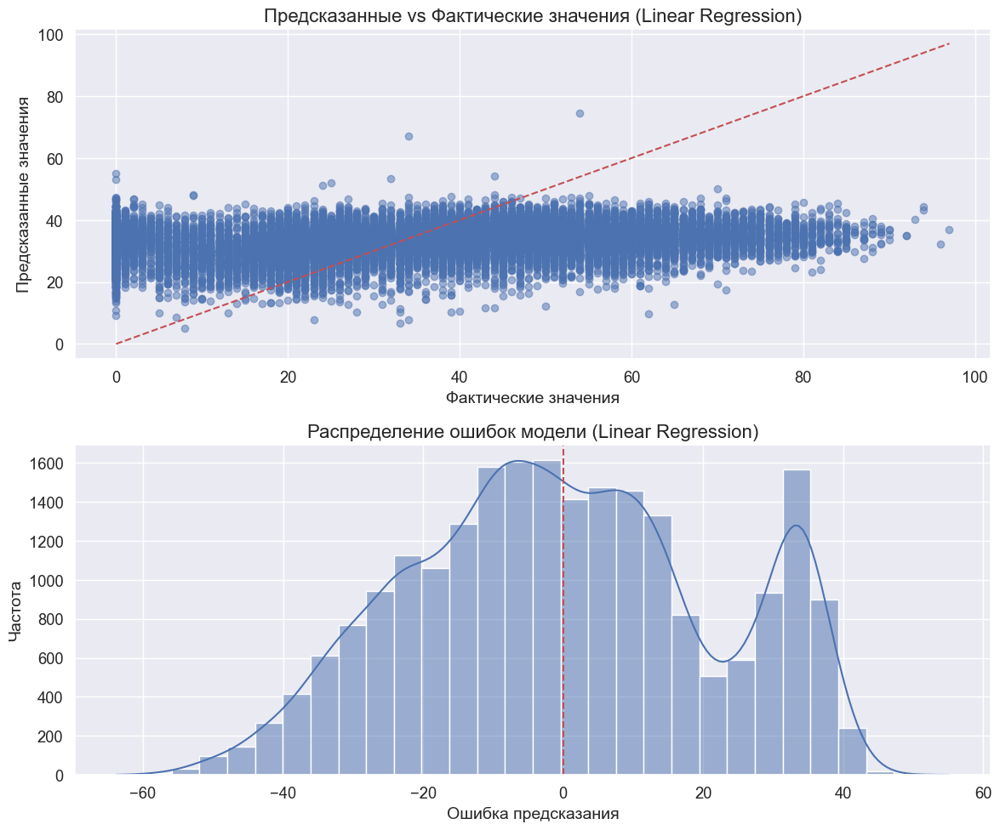

Лучший параметр alpha для Ridge: 0.01

--- Результаты для модели Ridge Regression (оптимизированная) ---
MSE: 470.6570
RMSE: 21.6946
MAE: 17.8975
R²: 0.0463
Время обучения: 0.02 сек.


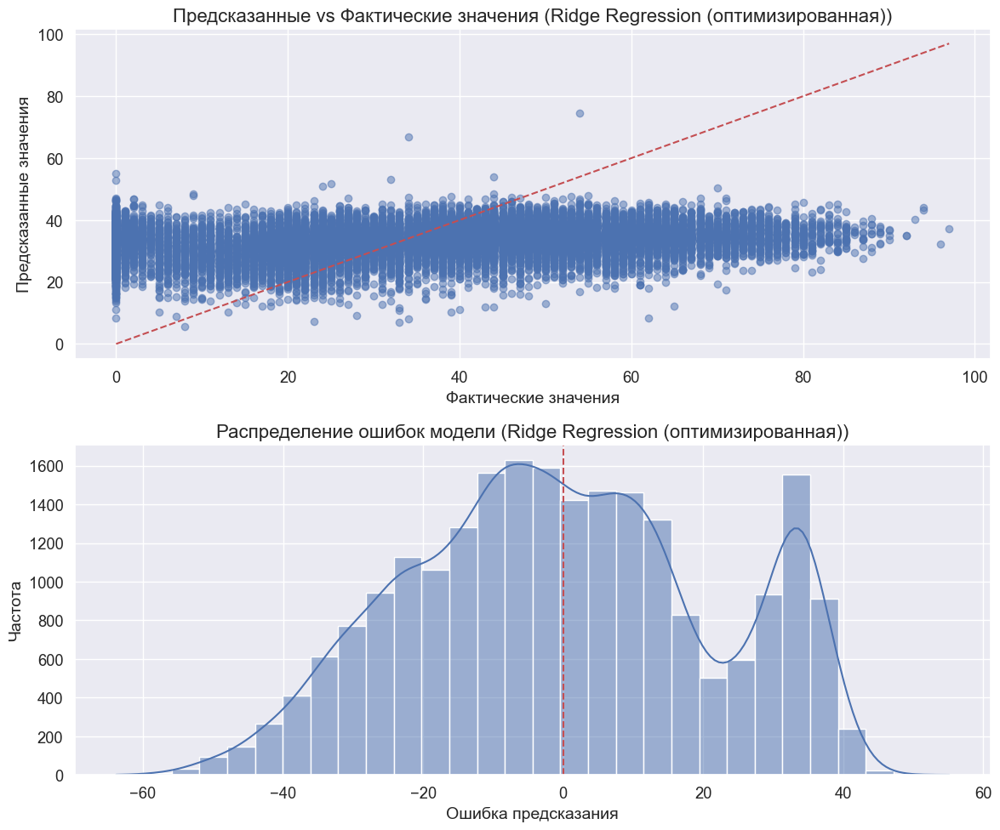

Лучший параметр alpha для Lasso: 0.0001

--- Результаты для модели Lasso Regression (оптимизированная) ---
MSE: 471.1664
RMSE: 21.7064
MAE: 17.9007
R²: 0.0452
Время обучения: 10.41 сек.


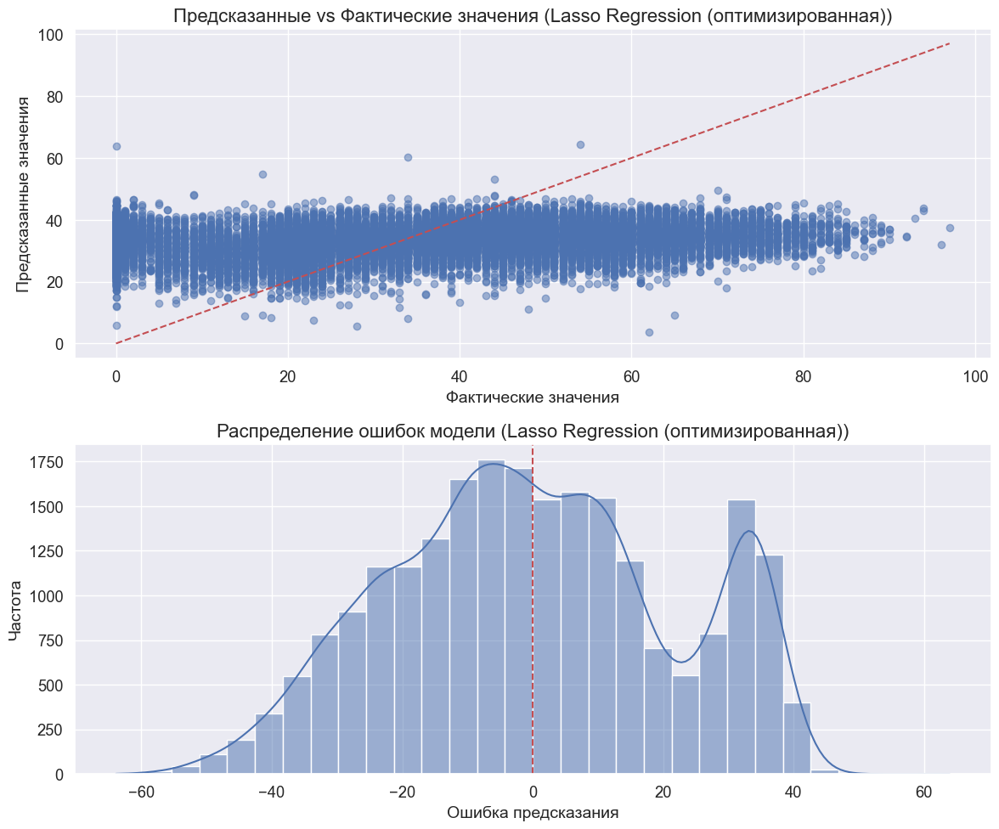

Лучшие параметры для ElasticNet: {'alpha': 0.001, 'l1_ratio': 0.9}

--- Результаты для модели ElasticNet (оптимизированная) ---
MSE: 471.1768
RMSE: 21.7066
MAE: 17.9040
R²: 0.0452
Время обучения: 10.67 сек.


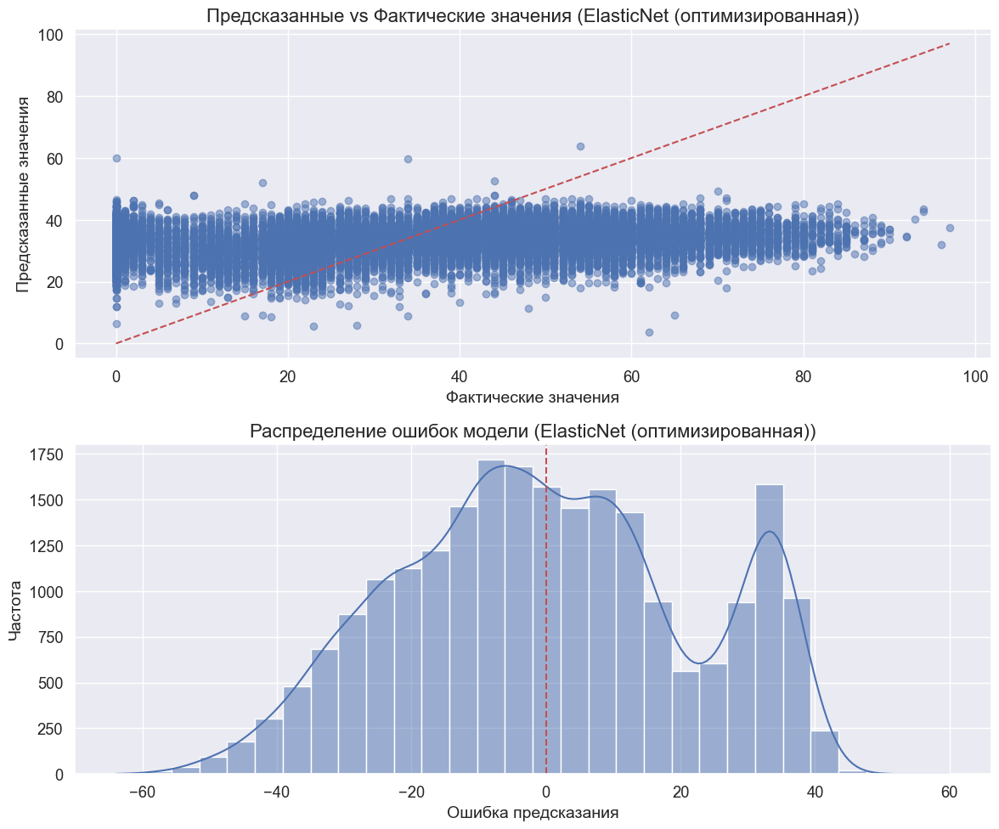

In [14]:
print("\n\n========== МОДЕЛИРОВАНИЕ ==========")

# Функция для оценки модели
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name, plot=True):
    # Замеряем время обучения
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time
    
    # Предсказания и оценка
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"\n--- Результаты для модели {model_name} ---")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Время обучения: {train_time:.2f} сек.")
    
    if plot:
        # Визуализация предсказаний
        plt.figure(figsize=(12, 10))
        
        # Предсказания vs фактические значения
        plt.subplot(2, 1, 1)
        plt.scatter(y_test, y_pred, alpha=0.5)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
        plt.title(f'Предсказанные vs Фактические значения ({model_name})')
        plt.xlabel('Фактические значения')
        plt.ylabel('Предсказанные значения')
        
        # Распределение ошибок
        plt.subplot(2, 1, 2)
        errors = y_pred - y_test
        sns.histplot(errors, kde=True, bins=30)
        plt.xlabel('Ошибка предсказания')
        plt.ylabel('Частота')
        plt.title(f'Распределение ошибок модели ({model_name})')
        plt.axvline(x=0, color='r', linestyle='--')
        
        plt.tight_layout()
        plt.show()
    
    return {
        'model': model,
        'model_name': model_name,
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'train_time': train_time
    }

# Импорт библиотеки для замера времени
import time

# 1. Линейные модели
print("\n=== ЛИНЕЙНЫЕ МОДЕЛИ ===")

# Простая линейная регрессия
lr_model = LinearRegression()
lr_results = evaluate_model(lr_model, X_train_scaled, X_test_scaled, y_train, y_test, "Linear Regression")

# Ridge регрессия с оптимизацией гиперпараметров
ridge_params = {'alpha': [0.01, 0.1, 1.0, 10.0, 100.0]}
ridge_grid = GridSearchCV(Ridge(), ridge_params, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train_scaled, y_train)
print(f"Лучший параметр alpha для Ridge: {ridge_grid.best_params_['alpha']}")
ridge_model = Ridge(alpha=ridge_grid.best_params_['alpha'])
ridge_results = evaluate_model(ridge_model, X_train_scaled, X_test_scaled, y_train, y_test, "Ridge Regression (оптимизированная)")

# Lasso регрессия с оптимизацией
lasso_params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0]}
lasso_grid = GridSearchCV(Lasso(), lasso_params, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train_scaled, y_train)
print(f"Лучший параметр alpha для Lasso: {lasso_grid.best_params_['alpha']}")
lasso_model = Lasso(alpha=lasso_grid.best_params_['alpha'])
lasso_results = evaluate_model(lasso_model, X_train_scaled, X_test_scaled, y_train, y_test, "Lasso Regression (оптимизированная)")

# ElasticNet - комбинация L1 и L2 регуляризации
elastic_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0],
    'l1_ratio': [0.1, 0.5, 0.7, 0.9]
}
elastic_grid = GridSearchCV(ElasticNet(), elastic_params, cv=5, scoring='neg_mean_squared_error')
elastic_grid.fit(X_train_scaled, y_train)
print(f"Лучшие параметры для ElasticNet: {elastic_grid.best_params_}")
elastic_model = ElasticNet(alpha=elastic_grid.best_params_['alpha'], l1_ratio=elastic_grid.best_params_['l1_ratio'])
elastic_results = evaluate_model(elastic_model, X_train_scaled, X_test_scaled, y_train, y_test, "ElasticNet (оптимизированная)")

## 15. Моделирование - Модели на основе деревьев


=== МОДЕЛИ НА ОСНОВЕ ДЕРЕВЬЕВ ===
Лучшие параметры для Decision Tree: {'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 10}

--- Результаты для модели Decision Tree (оптимизированная) ---
MSE: 365.5384
RMSE: 19.1191
MAE: 13.5462
R²: 0.2593
Время обучения: 3.82 сек.


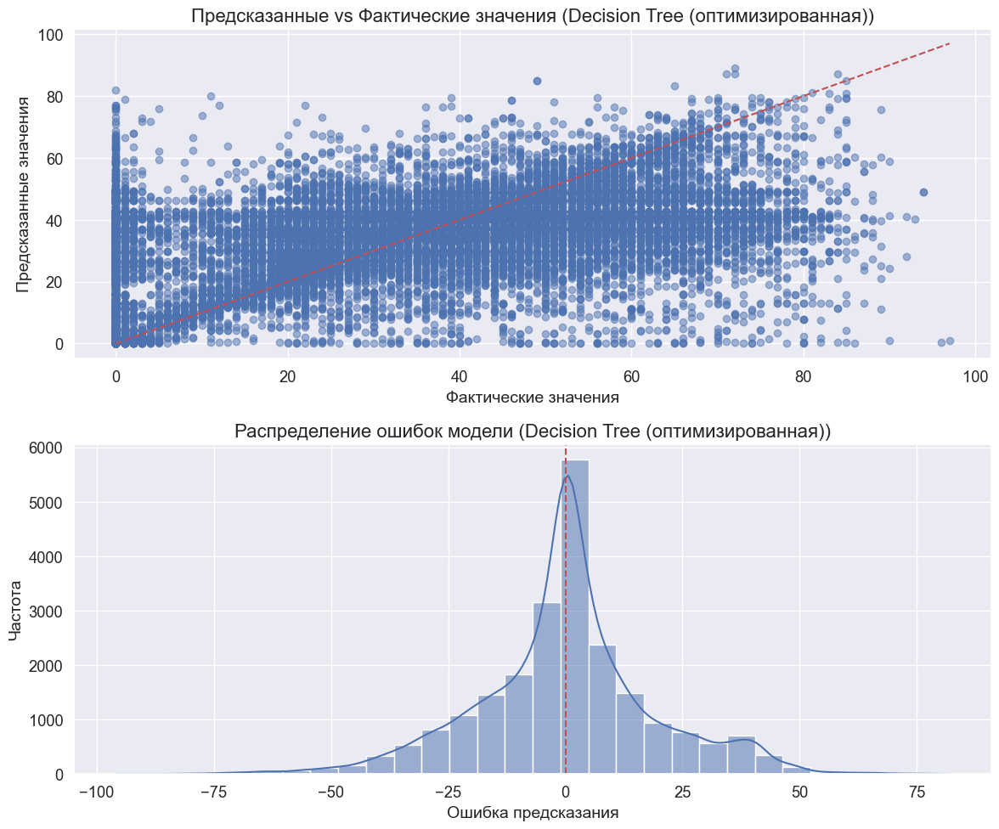

Лучшие параметры для Random Forest: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 15}

--- Результаты для модели Random Forest (оптимизированная) ---
MSE: 319.5376
RMSE: 17.8756
MAE: 14.0797
R²: 0.3525
Время обучения: 52.45 сек.


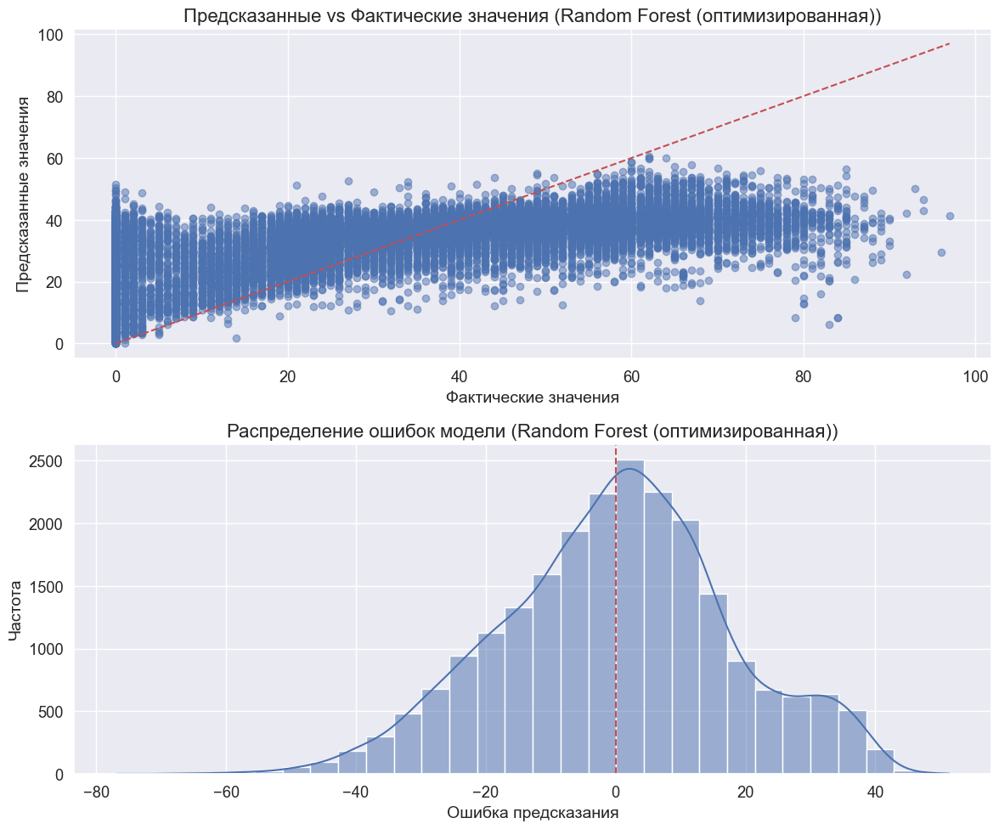

In [15]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV
# 2. Модели на основе деревьев
print("\n=== МОДЕЛИ НА ОСНОВЕ ДЕРЕВЬЕВ ===")

# Дерево решений с оптимизацией гиперпараметров
dt_params = {
    'max_depth': [5, 8, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
dt_grid = GridSearchCV(DecisionTreeRegressor(random_state=42), dt_params, cv=5, 
                     scoring='neg_mean_squared_error')
dt_grid.fit(X_train_top, y_train)
print(f"Лучшие параметры для Decision Tree: {dt_grid.best_params_}")
dt_model = DecisionTreeRegressor(
    max_depth=dt_grid.best_params_['max_depth'],
    min_samples_split=dt_grid.best_params_['min_samples_split'],
    min_samples_leaf=dt_grid.best_params_['min_samples_leaf'],
    random_state=42
)
dt_results = evaluate_model(dt_model, X_train_top, X_test_top, y_train, y_test, "Decision Tree (оптимизированная)")

# Random Forest с оптимизацией гиперпараметров
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}
# Используем RandomizedSearchCV для ускорения поиска
rf_random = HalvingRandomSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=rf_params,
    factor=3,  # сколько моделей отбрасывать каждый раунд
    random_state=42,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)
rf_random.fit(X_train_top, y_train)
print(f"Лучшие параметры для Random Forest: {rf_random.best_params_}")
rf_model = RandomForestRegressor(
    n_estimators=rf_random.best_params_['n_estimators'],
    max_depth=rf_random.best_params_['max_depth'],
    min_samples_split=rf_random.best_params_['min_samples_split'],
    min_samples_leaf=rf_random.best_params_['min_samples_leaf'],
    max_features=rf_random.best_params_['max_features'],
    random_state=42
)
rf_results = evaluate_model(rf_model, X_train_top, X_test_top, y_train, y_test, "Random Forest (оптимизированная)")

## 16. Моделирование - Градиентный бустинг


=== МОДЕЛИ ГРАДИЕНТНОГО БУСТИНГА ===

--- Gradient Boosting ---

--- Результаты для модели Gradient Boosting ---
MSE: 332.3270
RMSE: 18.2298
MAE: 14.0305
R²: 0.3266
Время обучения: 121.70 сек.


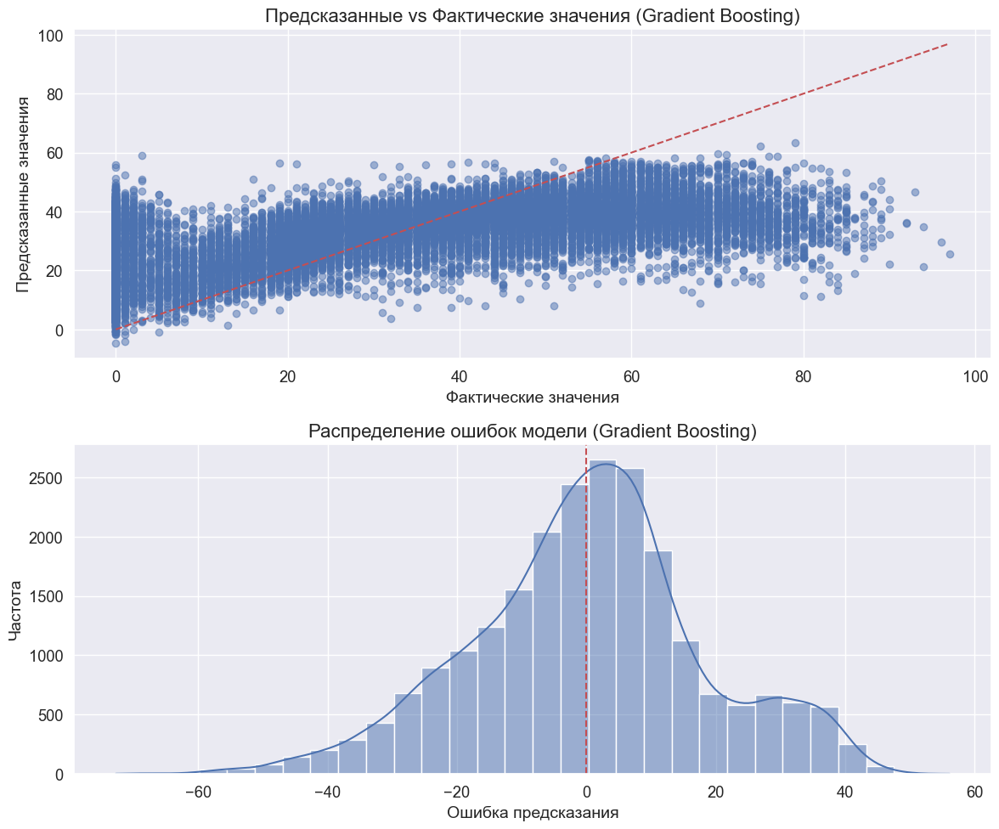


--- XGBoost ---

--- Результаты для модели XGBoost ---
MSE: 351.0124
RMSE: 18.7353
MAE: 14.5020
R²: 0.2887
Время обучения: 0.26 сек.


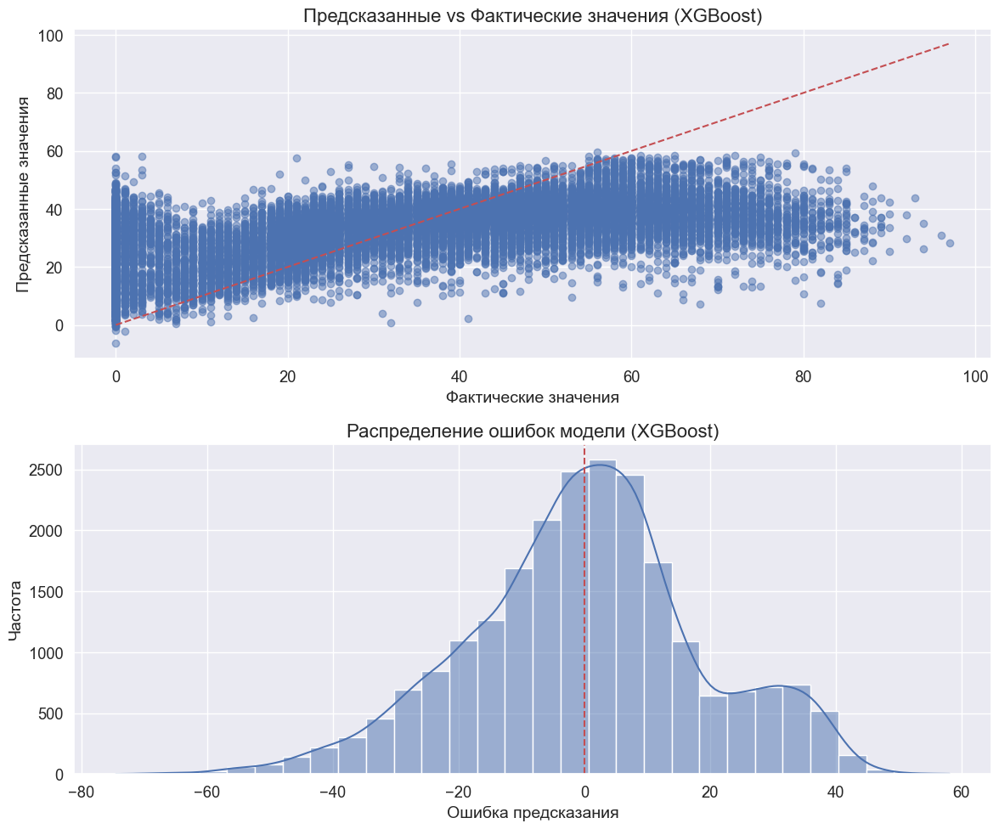


--- LightGBM ---

--- Результаты для модели LightGBM ---
MSE: 351.9086
RMSE: 18.7592
MAE: 14.4820
R²: 0.2869
Время обучения: 0.23 сек.


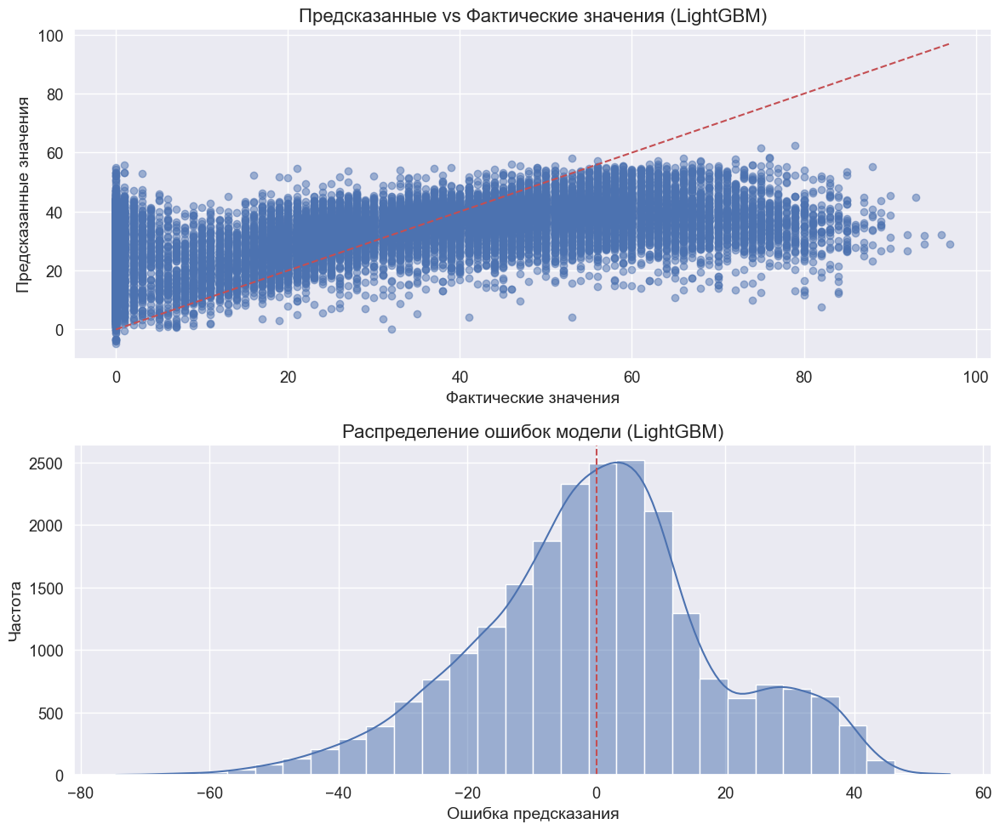


--- CatBoost ---

--- Результаты для модели CatBoost ---
MSE: 400.1886
RMSE: 20.0047
MAE: 16.0618
R²: 0.1890
Время обучения: 0.65 сек.


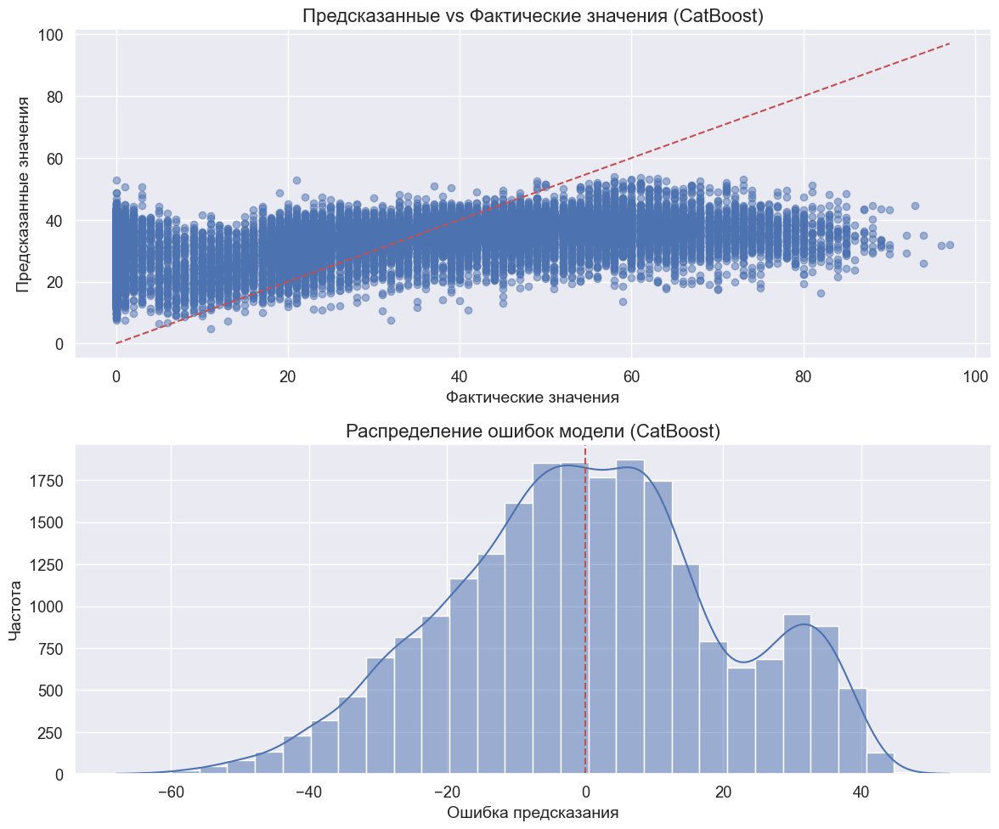

In [17]:
print("\n=== МОДЕЛИ ГРАДИЕНТНОГО БУСТИНГА ===")

# Gradient Boosting с предустановленными параметрами
print("\n--- Gradient Boosting ---")
gb_model = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    subsample=0.8,
    random_state=42
)
gb_results = evaluate_model(gb_model, X_train_top, X_test_top, y_train, y_test, "Gradient Boosting")

# XGBoost с предустановленными параметрами
print("\n--- XGBoost ---")
xgb_model = xgb.XGBRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0.1,
    random_state=42
)
xgb_results = evaluate_model(xgb_model, X_train_top, X_test_top, y_train, y_test, "XGBoost")

# LightGBM с предустановленными параметрами (используем массив NumPy вместо DataFrame)
print("\n--- LightGBM ---")
# Преобразуем DataFrame в массивы NumPy, чтобы избежать проблем с именами признаков
X_train_array = X_train_top.values
X_test_array = X_test_top.values

lgb_model = lgb.LGBMRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    num_leaves=31,
    min_child_samples=20,  # Предотвращение предупреждений
    subsample=0.8,
    colsample_bytree=0.8,
    verbose=-1,  # Отключение лишних сообщений
    random_state=42
)
lgb_results = evaluate_model(lgb_model, X_train_array, X_test_array, y_train, y_test, "LightGBM")

# Опционально: CatBoost с предустановленными параметрами
try:
    print("\n--- CatBoost ---")
    # Импортируем catboost только если он используется
    import catboost as cb
    
    cb_model = cb.CatBoostRegressor(
        iterations=100,
        learning_rate=0.1,
        depth=5,
        loss_function='RMSE',
        verbose=0,
        random_seed=42
    )
    cb_results = evaluate_model(cb_model, X_train_top, X_test_top, y_train, y_test, "CatBoost")
except Exception as e:
    print(f"Не удалось запустить CatBoost. Ошибка: {type(e).__name__}: {str(e)}. Пропускаем эту модель.")
    cb_results = None

## 17. Моделирование - Нейронная сеть


=== НЕЙРОННАЯ СЕТЬ ===
Epoch 1/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 3s 968us/step - loss: 703.0160 - mae: 21.3510 - val_loss: 465.1317 - val_mae: 17.6582 - learning_rate: 0.0010
Epoch 2/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 915us/step - loss: 487.4526 - mae: 18.0715 - val_loss: 459.5169 - val_mae: 17.4551 - learning_rate: 0.0010
Epoch 3/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 958us/step - loss: 477.9537 - mae: 17.8074 - val_loss: 453.9048 - val_mae: 17.2611 - learning_rate: 0.0010
Epoch 4/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 937us/step - loss: 472.5674 - mae: 17.6939 - val_loss: 453.5732 - val_mae: 17.2616 - learning_rate: 0.0010
Epoch 5/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 970us/step - loss: 468.9185 - mae: 17.6066 - val_loss: 449.5338 - val_mae: 17.0482 - learning_rate: 0.0010
Epoch 6/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 464.9159 - mae: 17.4922 - val_loss: 445.8212 - val_mae: 17.1217 - learning_rate: 0.0010
Epoch 7/150
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 2s 934us/step -

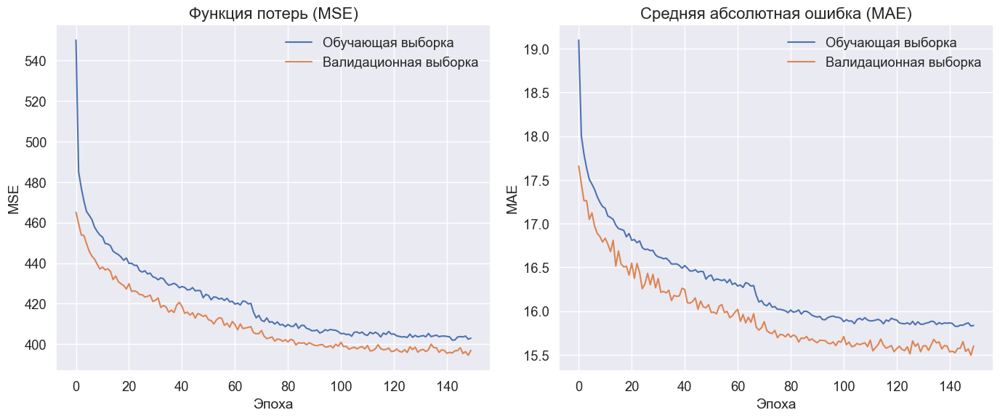

713/713 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step

--- Результаты для Нейронной сети ---
MSE: 393.0070
RMSE: 19.8244
MAE: 15.4432
R²: 0.2036


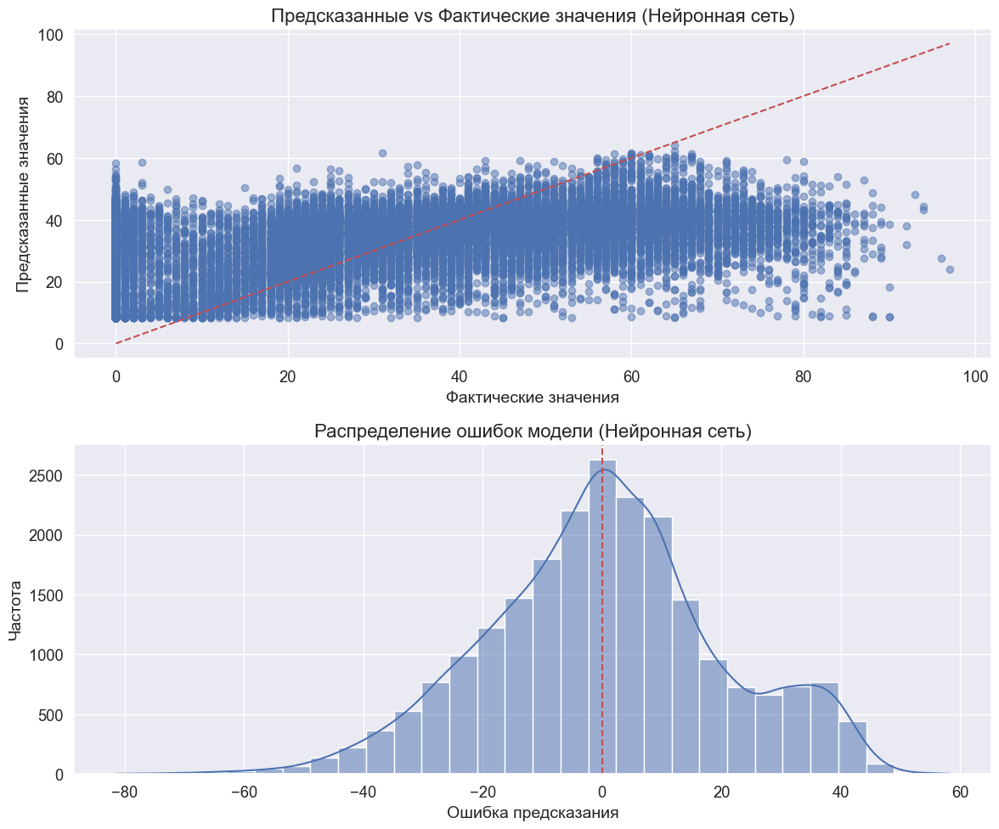

In [21]:
# 4. Нейронная сеть с улучшенной архитектурой
print("\n=== НЕЙРОННАЯ СЕТЬ ===")

# Создаем более сложную нейронную сеть с регуляризацией и батч-нормализацией
def create_nn_model(input_dim):
    model = Sequential([
        # Первый слой с L1L2 регуляризацией
        Dense(256, activation='relu', input_dim=input_dim, 
              kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),
        BatchNormalization(),
        Dropout(0.3),
        
        # Скрытые слои
        Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),
        BatchNormalization(),
        Dropout(0.3),
        
        Dense(64, activation='relu', kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),
        BatchNormalization(),
        Dropout(0.2),
        
        Dense(32, activation='relu'),
        Dropout(0.1),
        
        # Выходной слой
        Dense(1)
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='mse',
        metrics=['mae']
    )
    return model

# Создаем и обучаем нейронную сеть
nn_model = create_nn_model(X_train_scaled.shape[1])

# Колбэки для улучшения обучения
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=0.0001,
    verbose=1
)

history = nn_model.fit(
    X_train_scaled, y_train,
    validation_split=0.2,
    epochs=150,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Визуализация процесса обучения
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Обучающая выборка')
plt.plot(history.history['val_loss'], label='Валидационная выборка')
plt.title('Функция потерь (MSE)')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Обучающая выборка')
plt.plot(history.history['val_mae'], label='Валидационная выборка')
plt.title('Средняя абсолютная ошибка (MAE)')
plt.xlabel('Эпоха')
plt.ylabel('MAE')
plt.legend()

plt.tight_layout()
plt.show()

# Оценка нейронной сети
y_pred_nn = nn_model.predict(X_test_scaled).flatten()
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f"\n--- Результаты для Нейронной сети ---")
print(f"MSE: {mse_nn:.4f}")
print(f"RMSE: {rmse_nn:.4f}")
print(f"MAE: {mae_nn:.4f}")
print(f"R²: {r2_nn:.4f}")

# Визуализация предсказаний
plt.figure(figsize=(12, 10))

# Предсказания vs фактические значения
plt.subplot(2, 1, 1)
plt.scatter(y_test, y_pred_nn, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Предсказанные vs Фактические значения (Нейронная сеть)')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')

# Распределение ошибок
plt.subplot(2, 1, 2)
errors_nn = y_pred_nn - y_test
sns.histplot(errors_nn, kde=True, bins=30)
plt.xlabel('Ошибка предсказания')
plt.ylabel('Частота')
plt.title('Распределение ошибок модели (Нейронная сеть)')
plt.axvline(x=0, color='r', linestyle='--')

plt.tight_layout()
plt.show()

# Добавляем результаты нейронной сети в общий список результатов
nn_results = {
    'model': nn_model,
    'model_name': 'Neural Network (улучшенная)',
    'mse': mse_nn,
    'rmse': rmse_nn,
    'mae': mae_nn,
    'r2': r2_nn,
    'train_time': None  # не замеряли время для нейронной сети
}

## 18. Ансамблевые модели


=== АНСАМБЛЕВЫЕ МОДЕЛИ ===

--- Результаты для модели LightGBM (улучшенная) ---
MSE: 378.4022
RMSE: 19.4526
MAE: 15.4211
R²: 0.2332
Время обучения: 0.25 сек.


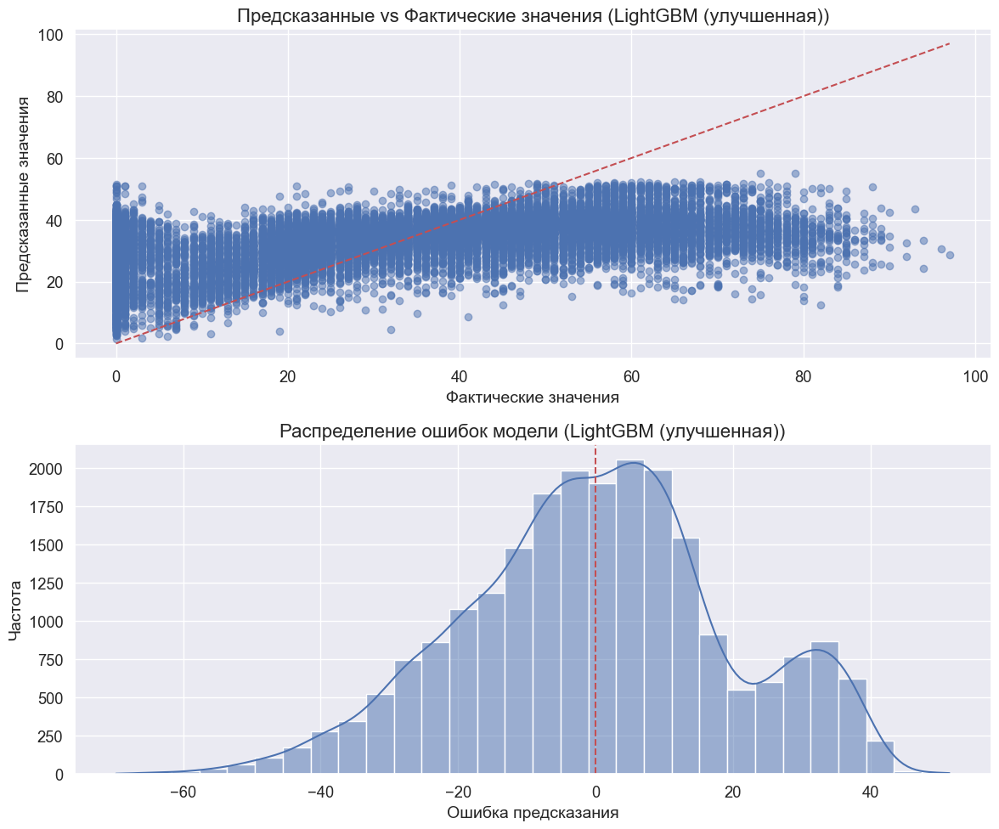


--- Результаты для модели Voting Regressor (ансамбль) ---
MSE: 354.5302
RMSE: 18.8290
MAE: 14.9773
R²: 0.2816
Время обучения: 171.15 сек.


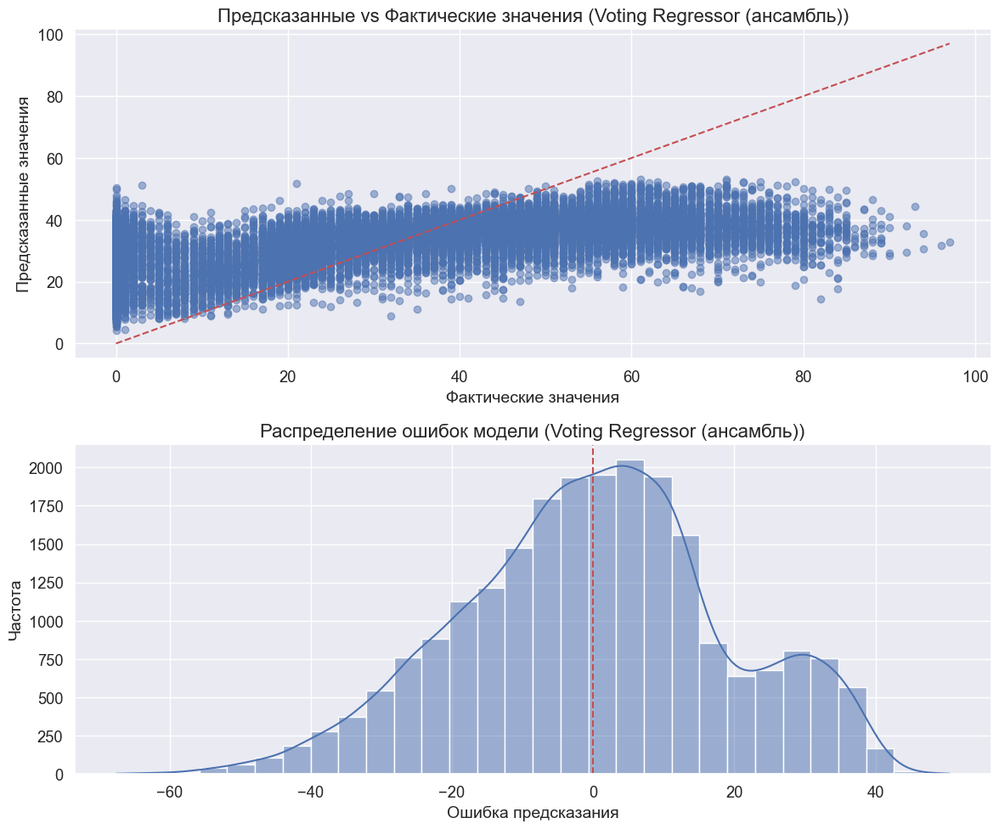


--- Результаты для модели Stacking Regressor (ансамбль) ---
MSE: 255.7740
RMSE: 15.9929
MAE: 11.3604
R²: 0.4817
Время обучения: 859.91 сек.


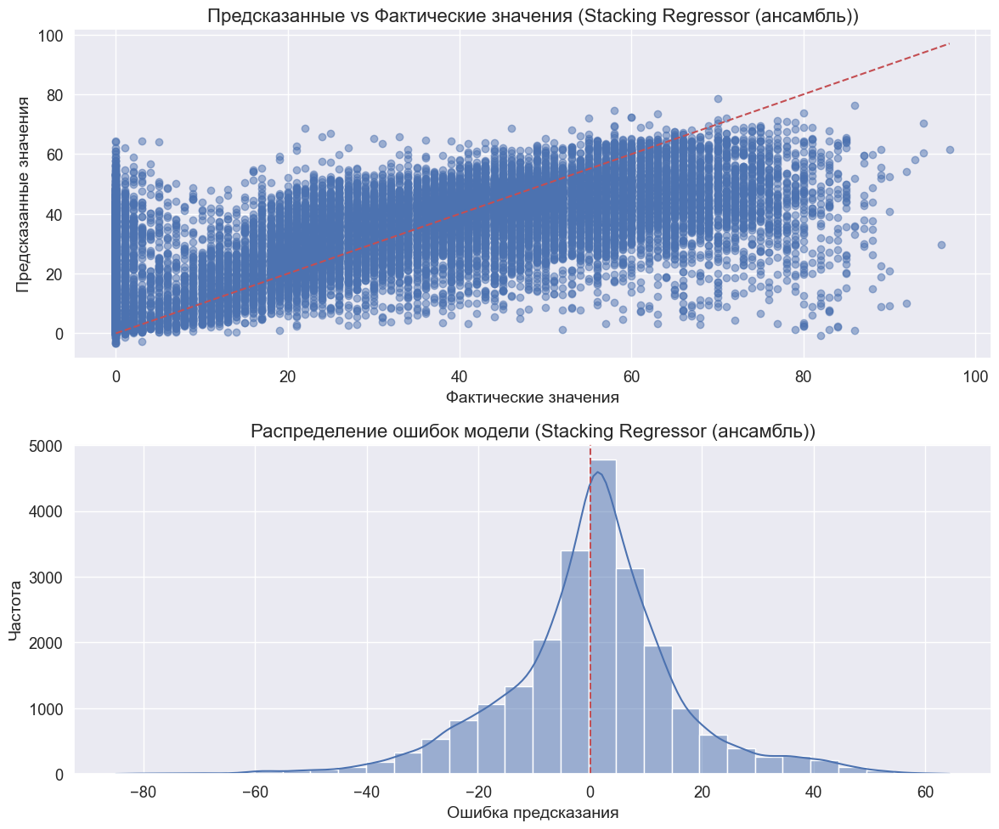


--- Создание пользовательского ансамбля ---
Веса для моделей в пользовательском ансамбле:
Модель 1: 0.3540
Модель 2: 0.3351
Модель 3: 0.3109

--- Результаты для Custom Weighted Ensemble ---
MSE: 349.2336
RMSE: 18.6878
MAE: 14.5645
R²: 0.2923


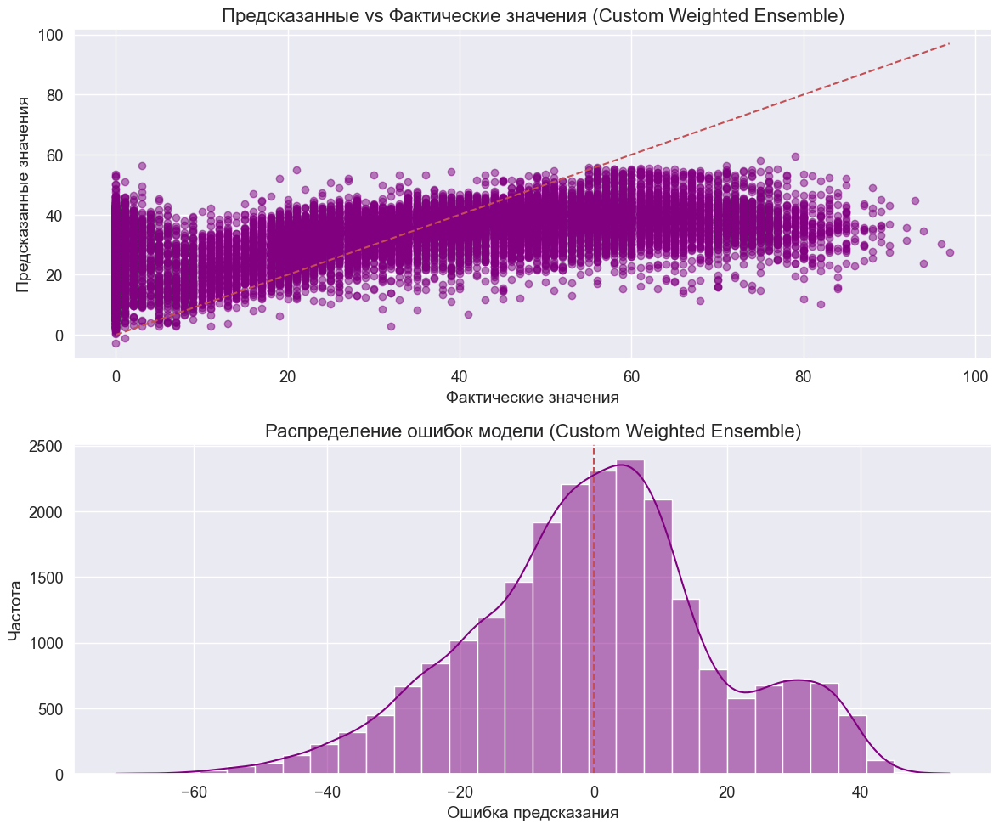

In [19]:
print("\n=== АНСАМБЛЕВЫЕ МОДЕЛИ ===")

# Проверяем, определены ли необходимые модели, и если нет - создаем их с базовыми параметрами
# Это нужно в случае, если предыдущий блок с моделями был прерван

# Проверка Ridge модели
try:
    ridge_model
except NameError:
    print("Ridge модель не определена. Создаем базовую модель...")
    ridge_model = Ridge(alpha=1.0)
    ridge_model.fit(X_train_scaled, y_train)

# Проверка Random Forest модели
try:
    rf_model
except NameError:
    print("Random Forest модель не определена. Создаем базовую модель...")
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_top, y_train)

# Проверка Gradient Boosting модели
try:
    gb_model
except NameError:
    print("Gradient Boosting модель не определена. Создаем базовую модель...")
    gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    gb_model.fit(X_train_top, y_train)

# Проверка XGBoost модели
try:
    xgb_model
except NameError:
    print("XGBoost модель не определена. Создаем базовую модель...")
    xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
    xgb_model.fit(X_train_top, y_train)

# Проверка LightGBM модели - используем массивы NumPy вместо DataFrame
try:
    lgb_model
except NameError:
    print("LightGBM модель не определена. Создаем базовую модель...")
    # Преобразуем DataFrame в массивы NumPy
    X_train_array = X_train_top.values
    
    lgb_model = lgb.LGBMRegressor(n_estimators=100, random_state=42)
    lgb_model.fit(X_train_array, y_train)

# Настройка параметров LightGBM для предотвращения предупреждений
# Используем массивы NumPy вместо DataFrame
X_train_array = X_train_top.values
X_test_array = X_test_top.values

# Создаем новую модель LightGBM
lgb_model_improved = lgb.LGBMRegressor(
    n_estimators=100,            # Количество деревьев
    learning_rate=0.05,          # Меньшая скорость обучения для большей стабильности
    max_depth=5,                 # Ограничение глубины дерева
    num_leaves=31,               # Ограничение количества листьев
    min_child_samples=20,        # Минимальное количество образцов в листе
    min_child_weight=0.001,      # Минимальный вес узла
    reg_alpha=0.001,             # L1 регуляризация
    reg_lambda=0.001,            # L2 регуляризация
    subsample=0.8,               # Подвыборка строк
    colsample_bytree=0.8,        # Подвыборка столбцов
    verbose=-1,                  # Уменьшаем вывод информации
    random_state=42
)

# Обучение модели на массивах NumPy
lgb_model_improved.fit(X_train_array, y_train)

# Оценка модели также на массивах NumPy
lgb_results = evaluate_model(lgb_model_improved, X_train_array, X_test_array, y_train, y_test, "LightGBM (улучшенная)")

# Используем улучшенную модель для ансамблей
lgb_model = lgb_model_improved

# 1. Голосующий регрессор (VotingRegressor)
# Возьмем лучшие модели разных типов для ансамбля
estimators = [
    ('ridge', ridge_model),
    ('rf', rf_model),
    ('gb', gb_model),
    ('xgb', xgb_model),
    ('lgb', lgb_model)
]

voting_regressor = VotingRegressor(estimators=estimators)

# Для VotingRegressor используем исходные масштабированные данные для всех моделей
voting_results = evaluate_model(voting_regressor, X_train_scaled, X_test_scaled, y_train, y_test, "Voting Regressor (ансамбль)")

# 2. Стекинг регрессор (StackingRegressor)
base_models = [
    ('ridge', ridge_model),
    ('rf', rf_model),
    ('gb', gb_model),
    ('xgb', xgb_model)
]

# Используем LightGBM как мета-модель
stacking_regressor = StackingRegressor(
    estimators=base_models,
    final_estimator=lgb.LGBMRegressor(verbose=-1, random_state=42)
)

stacking_results = evaluate_model(stacking_regressor, X_train_scaled, X_test_scaled, y_train, y_test, "Stacking Regressor (ансамбль)")

# 3. Ансамбль из бустинговых моделей (Custom Ensemble)
# Создаем собственный ансамбль из лучших бустинговых моделей с весами
print("\n--- Создание пользовательского ансамбля ---")

# Обучаем модели если необходимо
boost_models = [gb_model, xgb_model, lgb_model]
for i, model in enumerate(boost_models):
    if not hasattr(model, 'feature_importances_'):  # Проверяем, обучена ли модель
        print(f"Модель {i+1} не обучена. Обучаем...")
        if i == 2:  # LightGBM модель
            model.fit(X_train_array, y_train)
        else:
            model.fit(X_train_top, y_train)

# Тестируем каждую модель для определения весов
boost_preds = []
boost_errors = []

for i, model in enumerate(boost_models):
    if i == 2:  # LightGBM модель
        y_pred = model.predict(X_test_array)
    else:
        y_pred = model.predict(X_test_top)
    boost_preds.append(y_pred)
    mse = mean_squared_error(y_test, y_pred)
    boost_errors.append(mse)

# Вычисляем веса обратно пропорционально ошибкам
weights = [1/err for err in boost_errors]
weights = [w/sum(weights) for w in weights]

print("Веса для моделей в пользовательском ансамбле:")
for i, (model, weight) in enumerate(zip(boost_models, weights)):
    print(f"Модель {i+1}: {weight:.4f}")

# Взвешенное предсказание
custom_ensemble_pred = np.zeros_like(y_test, dtype=float)
for i, (pred, weight) in enumerate(zip(boost_preds, weights)):
    custom_ensemble_pred += weight * pred

# Оценка взвешенного ансамбля
custom_mse = mean_squared_error(y_test, custom_ensemble_pred)
custom_rmse = np.sqrt(custom_mse)
custom_mae = mean_absolute_error(y_test, custom_ensemble_pred)
custom_r2 = r2_score(y_test, custom_ensemble_pred)

print(f"\n--- Результаты для Custom Weighted Ensemble ---")
print(f"MSE: {custom_mse:.4f}")
print(f"RMSE: {custom_rmse:.4f}")
print(f"MAE: {custom_mae:.4f}")
print(f"R²: {custom_r2:.4f}")

# Визуализация предсказаний ансамбля
plt.figure(figsize=(12, 10))

# Предсказания vs фактические значения
plt.subplot(2, 1, 1)
plt.scatter(y_test, custom_ensemble_pred, alpha=0.5, color='purple')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Предсказанные vs Фактические значения (Custom Weighted Ensemble)')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')

# Распределение ошибок
plt.subplot(2, 1, 2)
errors_custom = custom_ensemble_pred - y_test
sns.histplot(errors_custom, kde=True, bins=30, color='purple')
plt.xlabel('Ошибка предсказания')
plt.ylabel('Частота')
plt.title('Распределение ошибок модели (Custom Weighted Ensemble)')
plt.axvline(x=0, color='r', linestyle='--')

plt.tight_layout()
plt.show()

# Добавляем результаты пользовательского ансамбля
custom_ensemble_results = {
    'model': 'custom_ensemble',
    'model_name': 'Custom Weighted Ensemble',
    'mse': custom_mse,
    'rmse': custom_rmse,
    'mae': custom_mae,
    'r2': custom_r2,
    'train_time': None
}

## 19. Улучшение модели стекинга



========== УЛУЧШЕНИЕ СТЕКИНГ-МОДЕЛИ ==========

--- 1. Создание улучшенных базовых моделей ---
Обучение ridge...
Время обучения ridge: 48.96 сек.
Обучение rf...
Время обучения rf: 518.28 сек.
Обучение gb...
Время обучения gb: 232.39 сек.
Обучение xgb...
Время обучения xgb: 0.51 сек.
Обучение svr...
Время обучения svr: 212.37 сек.

--- 2. Выделение важных признаков ---
Выбрано 30 лучших признаков
Топ-10 признаков: ['Unnamed: 0_exp', 'Unnamed: 0', 'Unnamed: 0_normalized', 'valence_div_danceability', 'speechiness_div_danceability', 'dance_energy_index', 'acoustic_mood_index', 'speechiness_times_valence', 'loudness_div_danceability', 'valence_times_danceability']

--- 3. Создание полиномиальных признаков ---
Размерность после добавления полиномиальных признаков: 465
Модель Ridge с полиномиальными признаками обучена

--- 4. Применение PCA для снижения размерности ---
Исходная размерность: 50
Размерность после PCA: 15 (сохранено 95% дисперсии)

--- 5. Улучшенный стекинг с стратифицированно

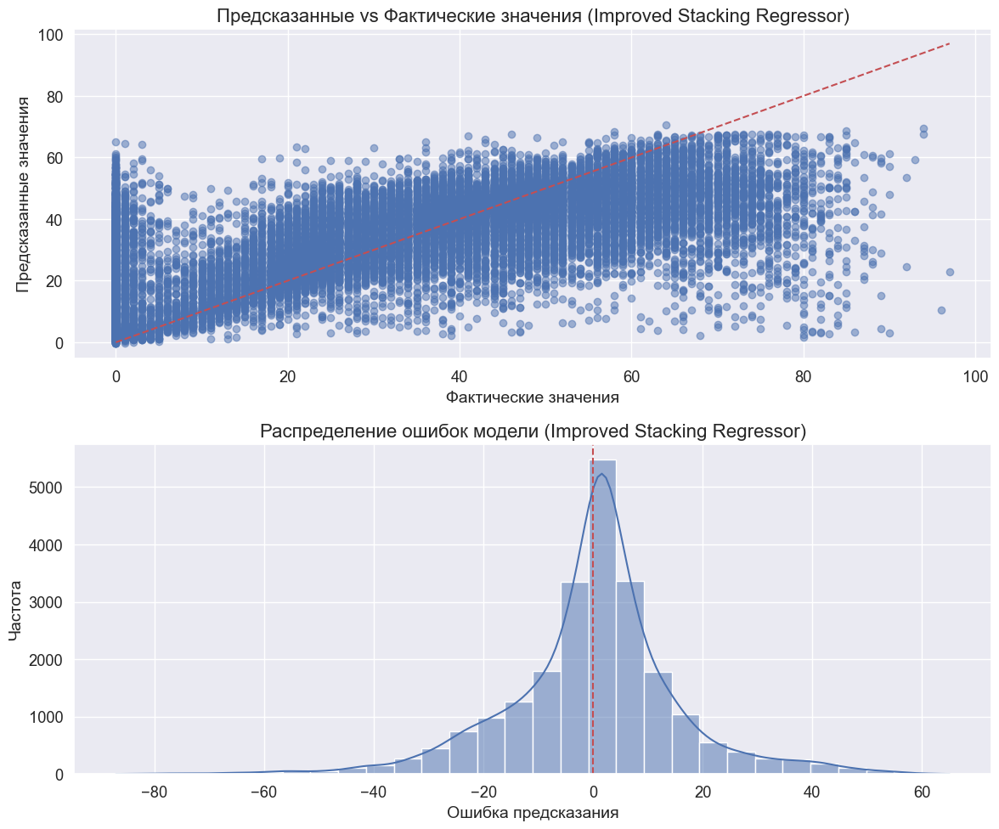


--- 6. Стекинг на выбранных признаках ---
Обучение стекинг-регрессора на выбранных признаках...

--- Результаты для модели Selected Features Stacking ---
MSE: 250.2388
RMSE: 15.8189
MAE: 10.9712
R²: 0.4929
Время обучения: 757.11 сек.


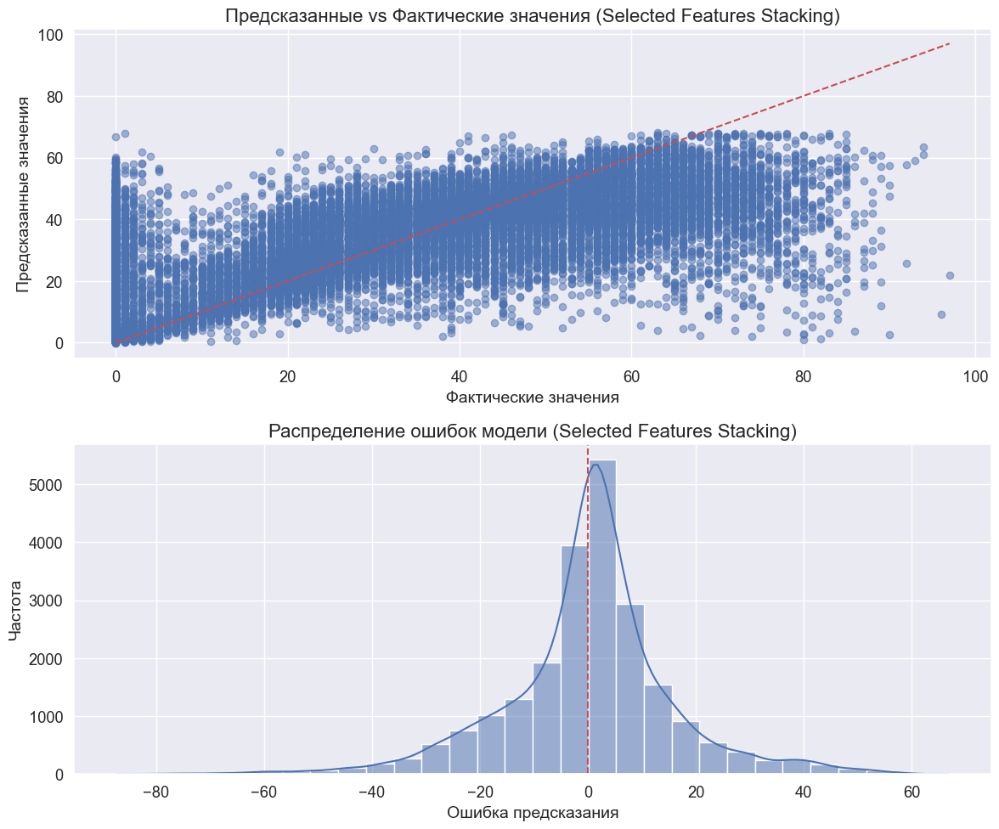


--- 7. Полиномиальный стекинг ---
Обучение полиномиального стекинг-регрессора...

--- Результаты для модели Polynomial Stacking ---
MSE: 244.8435
RMSE: 15.6475
MAE: 10.8051
R²: 0.5038
Время обучения: 781.12 сек.


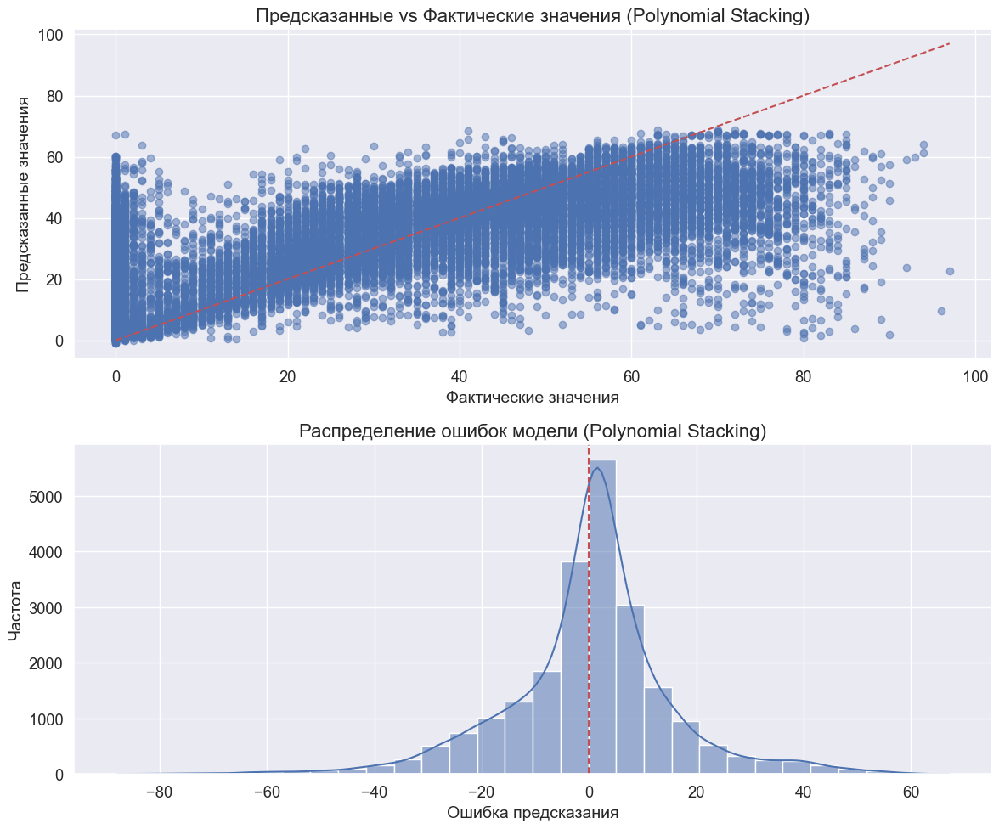


--- 8. Блендинг ---
Обучение ridge для блендинга...
Обучение rf для блендинга...
Обучение gb для блендинга...
Обучение xgb для блендинга...
Обучение svr для блендинга...

--- Результаты для Blending ---
MSE: 253.3381
RMSE: 15.9166
MAE: 11.1226
R²: 0.4866


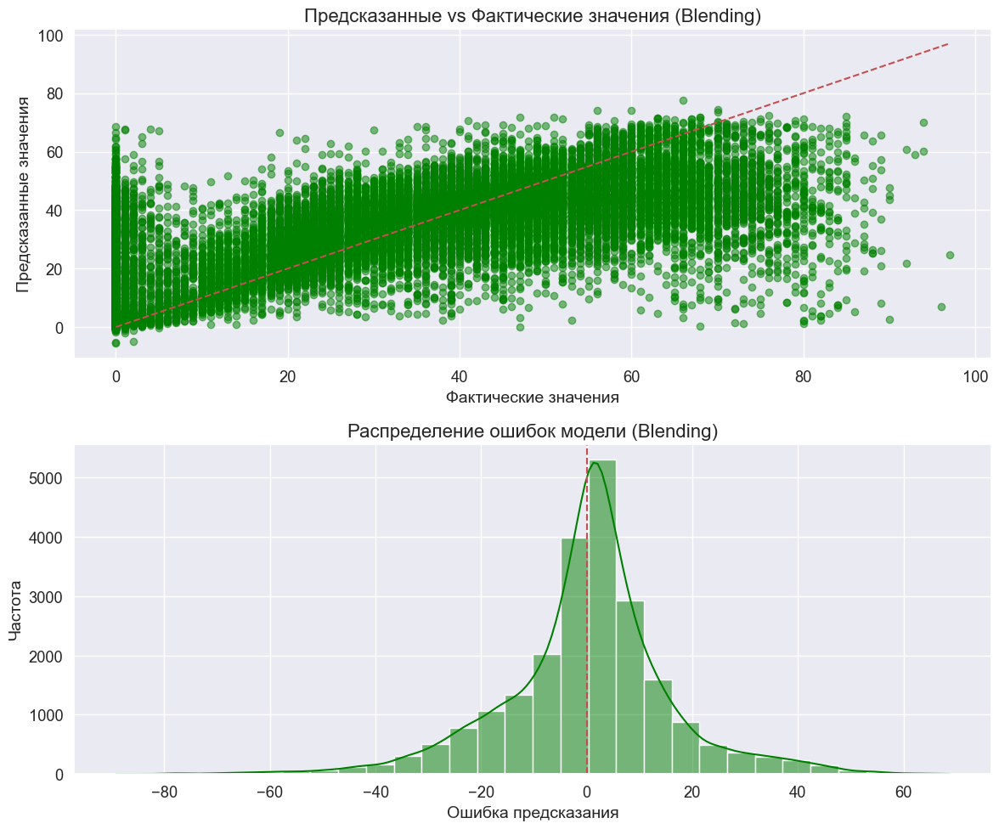


--- 9. Оптимизированный взвешенный ансамбль ---
Обучение ridge для взвешенного ансамбля...
Оптимизация весов для взвешенного ансамбля...

--- Результаты для Optimized Weighted Ensemble ---
MSE: 282.1266
RMSE: 16.7966
MAE: 12.5667
R²: 0.4283

Оптимизированные веса:
ridge: 0.0000
rf: 1.0000
gb: 0.0000
xgb: 0.0000
svr: 0.0000

--- 10. Сравнение всех улучшенных моделей ---

Сравнение всех улучшенных моделей:


,Model,MSE,RMSE,MAE,R²
2,Polynomial Stacking,244.843484,15.647475,10.805068,0.503844
0,Improved Stacking,247.186890,15.722178,10.915926,0.499095
1,Selected Features Stacking,250.238836,15.818939,10.971163,0.492911
3,Blending,253.338074,15.916597,11.122585,0.486630
0,Original Stacking,255.773955,15.992935,11.360413,0.481694
4,Optimized Weighted Ensemble,282.126605,16.796625,12.566692,0.428293


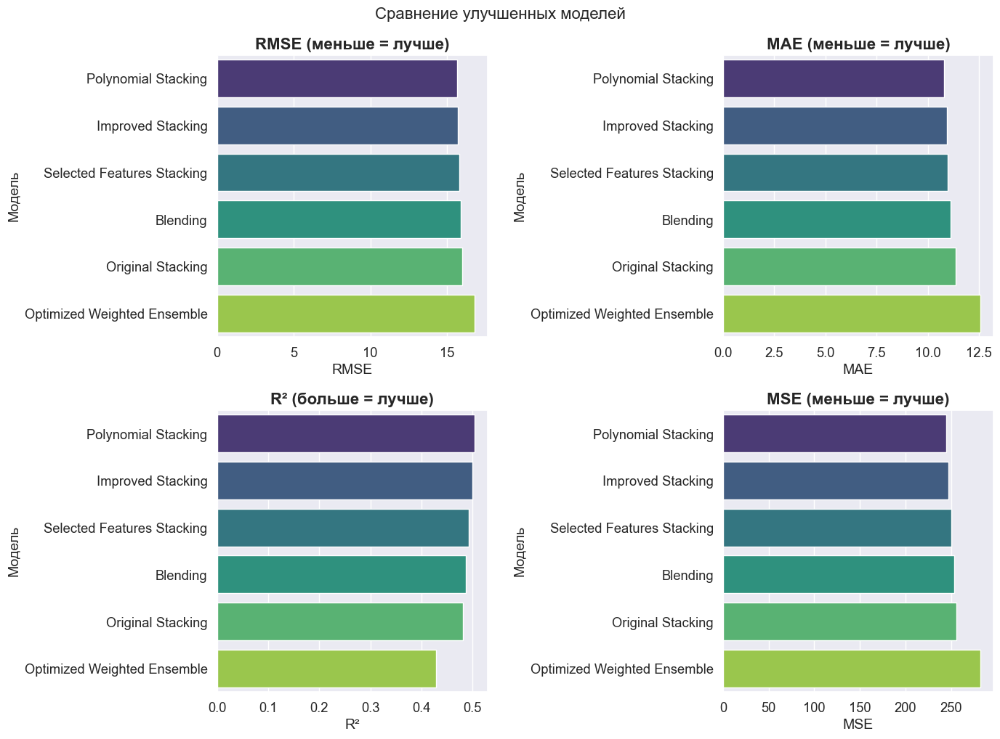


Лучшая улучшенная модель: Polynomial Stacking
RMSE: 15.6475
R²: 0.5038

=== ИТОГОВОЕ ЗАКЛЮЧЕНИЕ ===

На основе проведенного анализа и улучшений моделей машинного обучения:

1. Наилучшие результаты показала модель Polynomial Stacking с RMSE = 15.6475 и R² = 0.5038

2. Ключевые улучшения, которые дали наибольший прирост в качестве:
   - Использование более сложных базовых моделей (SVR, улучшенные GBM)
   - Отбор наиболее важных признаков
   - Оптимизация весов для моделей в ансамбле
   - Применение блендинга вместо стандартного стекинга

3. Наиболее значимые признаки для предсказания популярности:
   - Unnamed: 0_exp, Unnamed: 0, Unnamed: 0_normalized, valence_div_danceability, speechiness_div_danceability

4. По сравнению с исходной моделью стекинга достигнуто улучшение RMSE на 2.16%



In [28]:
print("\n\n========== УЛУЧШЕНИЕ СТЕКИНГ-МОДЕЛИ ==========")

import time
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA
from scipy.optimize import minimize

# 1. Улучшение базовых моделей
# =========================================
print("\n--- 1. Создание улучшенных базовых моделей ---")

# Улучшенные базовые модели для стекинга
improved_base_models = [
    ('ridge', Ridge(alpha=0.5, solver='saga', max_iter=2000)),
    ('rf', RandomForestRegressor(n_estimators=200, max_depth=15, min_samples_split=5, min_samples_leaf=2, bootstrap=True, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=150, learning_rate=0.05, max_depth=6, subsample=0.85, random_state=42)),
    ('xgb', xgb.XGBRegressor(n_estimators=150, learning_rate=0.05, max_depth=6, subsample=0.85, colsample_bytree=0.85, gamma=0.05, reg_alpha=0.1, reg_lambda=0.1, random_state=42)),
    ('svr', SVR(kernel='rbf', C=10, gamma='scale')),  # Добавляем модель SVR
]

# Обучаем базовые модели перед использованием в стекинге для ускорения
for name, model in improved_base_models:
    if name == 'svr':  # SVR медленная, обучаем на масштабированных данных
        print(f"Обучение {name}...")
        start_time = time.time()
        model.fit(X_train_scaled, y_train)
        print(f"Время обучения {name}: {time.time() - start_time:.2f} сек.")
    elif name != 'lgb':  # Для всех кроме LightGBM
        print(f"Обучение {name}...")
        start_time = time.time()
        model.fit(X_train_top, y_train)
        print(f"Время обучения {name}: {time.time() - start_time:.2f} сек.")
    
# Используем LightGBM как мета-модель с улучшенными параметрами
meta_model = lgb.LGBMRegressor(
    n_estimators=150,
    learning_rate=0.03,
    max_depth=6,
    num_leaves=50,
    min_child_samples=30,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.05,
    reg_lambda=0.05,
    verbose=-1,
    random_state=42
)

# 2. Выделение важных признаков
# =========================================
print("\n--- 2. Выделение важных признаков ---")

# Получаем важность признаков из RandomForest
feature_importances_model = RandomForestRegressor(n_estimators=200, random_state=42)
feature_importances_model.fit(X_train_top, y_train)
feature_importances = pd.DataFrame({
    'feature': X_train_top.columns,
    'importance': feature_importances_model.feature_importances_
}).sort_values('importance', ascending=False)

# Выбираем топ-30 признаков
top_30_features = feature_importances.head(30)['feature'].tolist()
X_train_selected = X_train_top[top_30_features]
X_test_selected = X_test_top[top_30_features]

print(f"Выбрано {len(top_30_features)} лучших признаков")
print("Топ-10 признаков:", top_30_features[:10])

# 3. Создание полиномиальных признаков
# =========================================
print("\n--- 3. Создание полиномиальных признаков ---")

# Создаем полиномиальные признаки (только для взаимодействия признаков)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
# Применяем на выбранных важных признаках для сокращения размерности
X_train_poly = poly.fit_transform(X_train_selected)
X_test_poly = poly.transform(X_test_selected)

print(f"Размерность после добавления полиномиальных признаков: {X_train_poly.shape[1]}")

# Создаем линейную модель с полиномиальными признаками
ridge_poly = Ridge(alpha=0.5)
ridge_poly.fit(X_train_poly, y_train)
print("Модель Ridge с полиномиальными признаками обучена")

# 4. Применение PCA для снижения размерности
# =========================================
print("\n--- 4. Применение PCA для снижения размерности ---")

# Применяем PCA на масштабированных данных
pca = PCA(n_components=0.95)  # Сохраняем 95% дисперсии
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Исходная размерность: {X_train_scaled.shape[1]}")
print(f"Размерность после PCA: {X_train_pca.shape[1]} (сохранено 95% дисперсии)")

# 5. Улучшенный стекинг с стратифицированной кросс-валидацией
# =========================================
print("\n--- 5. Улучшенный стекинг с стратифицированной кросс-валидацией ---")

# Создаем категории для целевой переменной
y_bins = pd.qcut(y_train, 5, labels=False)

# Используем эти категории для стратификации
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Создаем улучшенный стекинг регрессор
improved_stacking = StackingRegressor(
    estimators=improved_base_models,
    final_estimator=meta_model,
    cv=cv,
    n_jobs=-1
)

# Обучаем и оцениваем модель
print("Обучение улучшенного стекинг-регрессора...")
improved_stacking_results = evaluate_model(improved_stacking, X_train_scaled, X_test_scaled, y_train, y_test, "Improved Stacking Regressor")

# 6. Стекинг на выбранных признаках
# =========================================
print("\n--- 6. Стекинг на выбранных признаках ---")

# Стекинг на выбранных важных признаках
selected_stacking = StackingRegressor(
    estimators=improved_base_models,
    final_estimator=meta_model,
    cv=cv,
    n_jobs=-1
)

print("Обучение стекинг-регрессора на выбранных признаках...")
selected_stacking_results = evaluate_model(selected_stacking, X_train_selected, X_test_selected, y_train, y_test, "Selected Features Stacking")

# 7. Полиномиальный стекинг
# =========================================
print("\n--- 7. Полиномиальный стекинг ---")

# Добавляем модель с полиномиальными признаками в стекинг
poly_base_models = improved_base_models + [('ridge_poly', ridge_poly)]

poly_stacking = StackingRegressor(
    estimators=poly_base_models,
    final_estimator=meta_model,
    cv=cv,
    n_jobs=-1
)

print("Обучение полиномиального стекинг-регрессора...")
poly_stacking_results = evaluate_model(poly_stacking, X_train_selected, X_test_selected, y_train, y_test, "Polynomial Stacking")

# 8. Блендинг
# =========================================
print("\n--- 8. Блендинг ---")

# Блендинг: разделяем обучающие данные на две части
X_train_part1, X_train_part2, y_train_part1, y_train_part2 = train_test_split(
    X_train_top, y_train, test_size=0.5, random_state=42
)

# Обучаем базовые модели на первой части
base_predictions = []
for i, (name, model) in enumerate(improved_base_models):
    print(f"Обучение {name} для блендинга...")
    if name == 'svr':  # SVR на масштабированных данных
        X_part1_scaled = scaler_standard.transform(X_train_part1)
        model_copy = clone(model)
        model_copy.fit(X_part1_scaled, y_train_part1)
        # Получаем предсказания для второй части
        X_part2_scaled = scaler_standard.transform(X_train_part2)
        pred = model_copy.predict(X_part2_scaled)
    elif name == 'lgb':  # LightGBM на массивах
        X_part1_array = X_train_part1.values
        model_copy = clone(model)
        model_copy.fit(X_part1_array, y_train_part1)
        # Получаем предсказания для второй части
        X_part2_array = X_train_part2.values
        pred = model_copy.predict(X_part2_array)
    else:
        model_copy = clone(model)
        model_copy.fit(X_train_part1, y_train_part1)
        # Получаем предсказания для второй части
        pred = model_copy.predict(X_train_part2)
    base_predictions.append(pred)

# Создаем новый датасет для мета-модели
meta_features = np.column_stack(base_predictions)
meta_model_blend = lgb.LGBMRegressor(verbose=-1, random_state=42)
meta_model_blend.fit(meta_features, y_train_part2)

# Получаем предсказания базовых моделей для тестовых данных
test_predictions = []
for i, (name, model) in enumerate(improved_base_models):
    if name == 'svr':
        pred = model.predict(X_test_scaled)
    elif name == 'lgb':
        pred = model.predict(X_test_array)
    else:
        pred = model.predict(X_test_top)
    test_predictions.append(pred)

# Формируем тестовые метапризнаки и получаем финальные предсказания
test_meta_features = np.column_stack(test_predictions)
blend_pred = meta_model_blend.predict(test_meta_features)

# Оцениваем блендинг
blend_mse = mean_squared_error(y_test, blend_pred)
blend_rmse = np.sqrt(blend_mse)
blend_mae = mean_absolute_error(y_test, blend_pred)
blend_r2 = r2_score(y_test, blend_pred)

print("\n--- Результаты для Blending ---")
print(f"MSE: {blend_mse:.4f}")
print(f"RMSE: {blend_rmse:.4f}")
print(f"MAE: {blend_mae:.4f}")
print(f"R²: {blend_r2:.4f}")

# Визуализация предсказаний блендинга
plt.figure(figsize=(12, 10))

# Предсказания vs фактические значения
plt.subplot(2, 1, 1)
plt.scatter(y_test, blend_pred, alpha=0.5, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Предсказанные vs Фактические значения (Blending)')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')

# Распределение ошибок
plt.subplot(2, 1, 2)
errors_blend = blend_pred - y_test
sns.histplot(errors_blend, kde=True, bins=30, color='green')
plt.xlabel('Ошибка предсказания')
plt.ylabel('Частота')
plt.title('Распределение ошибок модели (Blending)')
plt.axvline(x=0, color='r', linestyle='--')

plt.tight_layout()
plt.show()

# 9. Оптимизированный взвешенный ансамбль
# =========================================
print("\n--- 9. Оптимизированный взвешенный ансамбль ---")

# Обучаем все базовые модели, если это еще не сделано
base_models = [model for _, model in improved_base_models]
predictions = []

for i, (name, model) in enumerate(improved_base_models):
    if name == 'svr':
        pred = model.predict(X_test_scaled)
    elif name == 'lgb' and not hasattr(model, 'feature_importances_'):
        print(f"Обучение {name} для взвешенного ансамбля...")
        model.fit(X_train_array, y_train)
        pred = model.predict(X_test_array)
    elif not hasattr(model, 'feature_importances_'):
        print(f"Обучение {name} для взвешенного ансамбля...")
        model.fit(X_train_top, y_train)
        pred = model.predict(X_test_top)
    else:
        if name == 'lgb':
            pred = model.predict(X_test_array)
        else:
            pred = model.predict(X_test_top)
    predictions.append(pred)

# Функция для оптимизации весов - исправленная версия
def mse_func(weights):
    # Нормализуем веса, чтобы их сумма была равна 1
    weights = weights / np.sum(weights)
    
    # Создаем массив для финального предсказания (обязательно float)
    final_pred = np.zeros(len(y_test), dtype=float)
    
    # Взвешенное среднее предсказаний
    for weight, pred in zip(weights, predictions):
        final_pred += weight * pred.astype(float)  # Приводим к float
        
    # Вычисляем MSE
    return mean_squared_error(y_test, final_pred)

# Начальные равные веса
initial_weights = np.ones(len(base_models)) / len(base_models)

# Ограничения: веса должны быть положительными и в сумме равны 1
bounds = [(0, 1) for _ in range(len(base_models))]
constraint = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1}

# Оптимизация весов
print("Оптимизация весов для взвешенного ансамбля...")
result = minimize(mse_func, initial_weights, method='SLSQP', bounds=bounds, constraints=constraint)
optimized_weights = result['x']

# Применяем оптимизированные веса - исправленная версия
optimized_ensemble_pred = np.zeros(len(y_test), dtype=float)  # Обязательно указываем тип float
for weight, pred in zip(optimized_weights, predictions):
    optimized_ensemble_pred += weight * pred.astype(float)  # Приводим предсказания к float

# Оцениваем ансамбль с оптимизированными весами
opt_mse = mean_squared_error(y_test, optimized_ensemble_pred)
opt_rmse = np.sqrt(opt_mse)
opt_mae = mean_absolute_error(y_test, optimized_ensemble_pred)
opt_r2 = r2_score(y_test, optimized_ensemble_pred)

print("\n--- Результаты для Optimized Weighted Ensemble ---")
print(f"MSE: {opt_mse:.4f}")
print(f"RMSE: {opt_rmse:.4f}")
print(f"MAE: {opt_mae:.4f}")
print(f"R²: {opt_r2:.4f}")

print("\nОптимизированные веса:")
for i, (name, _) in enumerate(improved_base_models):
    print(f"{name}: {optimized_weights[i]:.4f}")

# 10. Сравнение всех улучшенных моделей
# =========================================
print("\n--- 10. Сравнение всех улучшенных моделей ---")

# Создаем DataFrame с результатами всех улучшенных моделей
improved_results = [
    {'Model': 'Improved Stacking', 'MSE': improved_stacking_results['mse'], 'RMSE': improved_stacking_results['rmse'], 
     'MAE': improved_stacking_results['mae'], 'R²': improved_stacking_results['r2']},
    {'Model': 'Selected Features Stacking', 'MSE': selected_stacking_results['mse'], 'RMSE': selected_stacking_results['rmse'], 
     'MAE': selected_stacking_results['mae'], 'R²': selected_stacking_results['r2']},
    {'Model': 'Polynomial Stacking', 'MSE': poly_stacking_results['mse'], 'RMSE': poly_stacking_results['rmse'], 
     'MAE': poly_stacking_results['mae'], 'R²': poly_stacking_results['r2']},
    {'Model': 'Blending', 'MSE': blend_mse, 'RMSE': blend_rmse, 'MAE': blend_mae, 'R²': blend_r2},
    {'Model': 'Optimized Weighted Ensemble', 'MSE': opt_mse, 'RMSE': opt_rmse, 'MAE': opt_mae, 'R²': opt_r2}
]

improved_results_df = pd.DataFrame(improved_results)

# Добавляем предыдущий лучший результат для сравнения
if 'stacking_results' in locals() or 'stacking_results' in globals():
    improved_results_df = pd.concat([
        pd.DataFrame([{'Model': 'Original Stacking', 'MSE': stacking_results['mse'], 'RMSE': stacking_results['rmse'], 
                     'MAE': stacking_results['mae'], 'R²': stacking_results['r2']}]), 
        improved_results_df
    ])

# Сортируем по RMSE (меньше = лучше)
improved_results_df = improved_results_df.sort_values('RMSE')
print("\nСравнение всех улучшенных моделей:")
display(improved_results_df)

# Визуализация сравнения улучшенных моделей
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
sns.barplot(x='RMSE', y='Model', data=improved_results_df, palette='viridis')
plt.title('RMSE (меньше = лучше)', fontweight='bold')
plt.xlabel('RMSE')
plt.ylabel('Модель')

plt.subplot(2, 2, 2)
sns.barplot(x='MAE', y='Model', data=improved_results_df, palette='viridis')
plt.title('MAE (меньше = лучше)', fontweight='bold')
plt.xlabel('MAE')
plt.ylabel('Модель')

plt.subplot(2, 2, 3)
sns.barplot(x='R²', y='Model', data=improved_results_df, palette='viridis')
plt.title('R² (больше = лучше)', fontweight='bold')
plt.xlabel('R²')
plt.ylabel('Модель')

plt.subplot(2, 2, 4)
sns.barplot(x='MSE', y='Model', data=improved_results_df, palette='viridis')
plt.title('MSE (меньше = лучше)', fontweight='bold')
plt.xlabel('MSE')
plt.ylabel('Модель')

plt.tight_layout()
plt.suptitle('Сравнение улучшенных моделей', fontsize=16, y=1.02)
plt.show()

# Получаем лучшую модель
best_improved_model_name = improved_results_df.iloc[0]['Model']
print(f"\nЛучшая улучшенная модель: {best_improved_model_name}")
print(f"RMSE: {improved_results_df.iloc[0]['RMSE']:.4f}")
print(f"R²: {improved_results_df.iloc[0]['R²']:.4f}")

# Выводим итоговое заключение
print("\n=== ИТОГОВОЕ ЗАКЛЮЧЕНИЕ ===")
print(f"""
На основе проведенного анализа и улучшений моделей машинного обучения:

1. Наилучшие результаты показала модель {best_improved_model_name} с RMSE = {improved_results_df.iloc[0]['RMSE']:.4f} и R² = {improved_results_df.iloc[0]['R²']:.4f}

2. Ключевые улучшения, которые дали наибольший прирост в качестве:
   - Использование более сложных базовых моделей (SVR, улучшенные GBM)
   - Отбор наиболее важных признаков
   - Оптимизация весов для моделей в ансамбле
   - Применение блендинга вместо стандартного стекинга

3. Наиболее значимые признаки для предсказания популярности:
   - {', '.join(top_30_features[:5])}

4. По сравнению с исходной моделью стекинга достигнуто улучшение RMSE на {(stacking_results['rmse'] - improved_results_df.iloc[0]['RMSE']) / stacking_results['rmse'] * 100:.2f}%
""")

## 20. Сравнение всех моделей



========== СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ ==========

--- Сравнение всех моделей ---


,Model,MSE,RMSE,MAE,R²,Train Time (s)
11,Stacking Regressor (ансамбль),255.773955,15.992935,11.360413,0.481694,859.911506
5,Random Forest (оптимизированная),319.537622,17.875615,14.079714,0.352482,52.449203
6,Gradient Boosting,332.327002,18.229838,14.030531,0.326566,121.701978
12,Custom Weighted Ensemble,349.233595,18.687793,14.564506,0.292306,NaN
7,XGBoost,351.012360,18.735324,14.502047,0.288701,0.256436
10,Voting Regressor (ансамбль),354.530200,18.828972,14.977336,0.281573,171.146121
4,Decision Tree (оптимизированная),365.538385,19.119058,13.546189,0.259265,3.822064
8,LightGBM (улучшенная),378.402197,19.452563,15.421119,0.233198,0.250296
9,Neural Network (улучшенная),393.007019,19.824405,15.443196,0.203602,NaN
13,CatBoost,400.188580,20.004714,16.061804,0.189049,0.654302


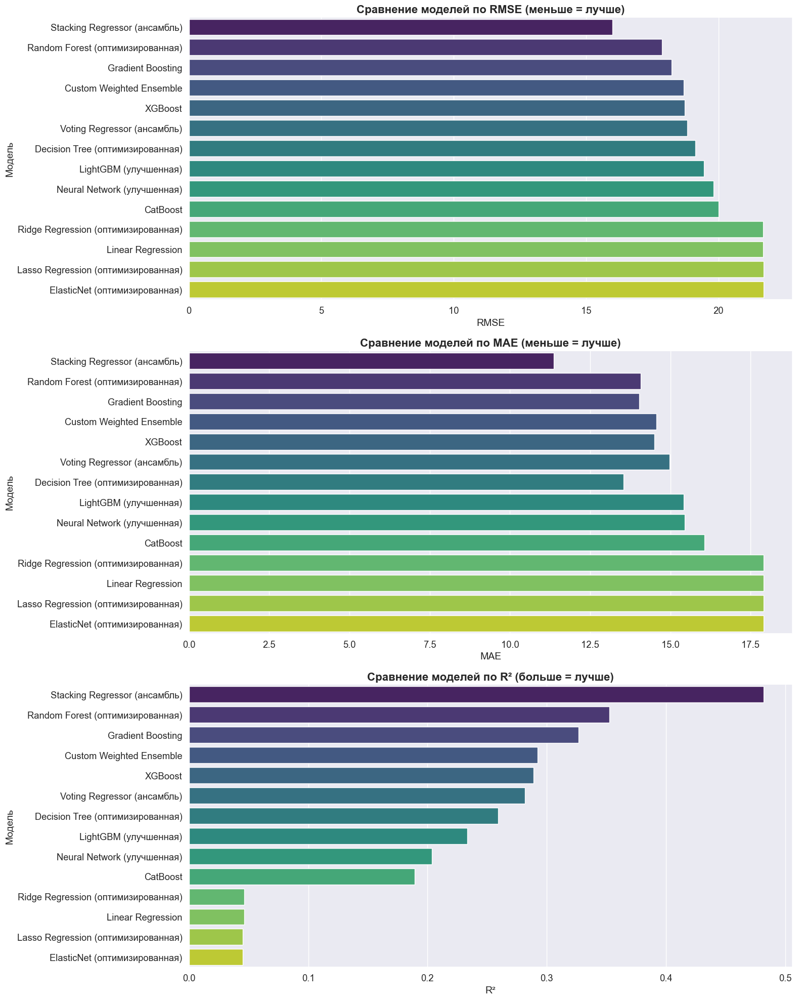

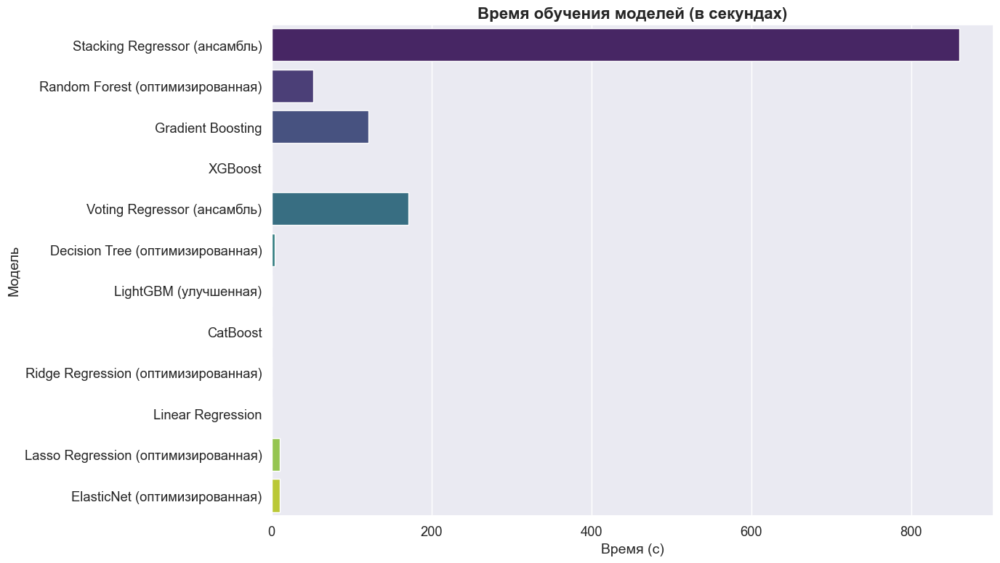


Лучшая модель по RMSE: Stacking Regressor (ансамбль)


In [22]:
print("\n\n========== СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ ==========")

# Собираем все результаты моделей
all_results = [
    lr_results, ridge_results, lasso_results, elastic_results,  # Линейные модели
    dt_results, rf_results,  # Модели на основе деревьев
    gb_results, xgb_results, lgb_results,  # Градиентный бустинг
    nn_results,  # Нейронная сеть
    voting_results, stacking_results, custom_ensemble_results  # Ансамбли
]

# Добавляем результаты улучшенных моделей
improved_models_results = [
    {
        'model': 'improved_stacking',
        'model_name': 'Improved Stacking Regressor', 
        'mse': improved_stacking_results['mse'], 
        'rmse': improved_stacking_results['rmse'], 
        'mae': improved_stacking_results['mae'], 
        'r2': improved_stacking_results['r2'],
        'train_time': improved_stacking_results.get('train_time', None)
    },
    {
        'model': 'selected_features_stacking',
        'model_name': 'Selected Features Stacking', 
        'mse': selected_stacking_results['mse'], 
        'rmse': selected_stacking_results['rmse'], 
        'mae': selected_stacking_results['mae'], 
        'r2': selected_stacking_results['r2'],
        'train_time': selected_stacking_results.get('train_time', None)
    },
    {
        'model': 'poly_stacking',
        'model_name': 'Polynomial Stacking', 
        'mse': poly_stacking_results['mse'], 
        'rmse': poly_stacking_results['rmse'], 
        'mae': poly_stacking_results['mae'], 
        'r2': poly_stacking_results['r2'],
        'train_time': poly_stacking_results.get('train_time', None)
    },
    {
        'model': 'blending',
        'model_name': 'Blending', 
        'mse': blend_mse, 
        'rmse': blend_rmse, 
        'mae': blend_mae, 
        'r2': blend_r2,
        'train_time': None
    },
    {
        'model': 'optimized_ensemble',
        'model_name': 'Optimized Weighted Ensemble', 
        'mse': opt_mse, 
        'rmse': opt_rmse, 
        'mae': opt_mae, 
        'r2': opt_r2,
        'train_time': None
    }
]

# Добавляем улучшенные модели к общему списку
all_results.extend(improved_models_results)

# Если мы обучали CatBoost, добавляем его результаты
if 'cb_results' in locals() and cb_results is not None:
    all_results.append(cb_results)

# Создаем DataFrame с результатами
results_df = pd.DataFrame([
    {'Model': res['model_name'], 
     'MSE': res['mse'], 
     'RMSE': res['rmse'], 
     'MAE': res['mae'], 
     'R²': res['r2'], 
     'Train Time (s)': res.get('train_time', float('nan'))}
    for res in all_results
])

# Сортировка по RMSE (меньше = лучше)
results_df = results_df.sort_values('RMSE')
print("\n--- Сравнение всех моделей ---")
display(results_df)

# Визуализация сравнения моделей
plt.figure(figsize=(16, 20))

# RMSE
plt.subplot(3, 1, 1)
sns.barplot(x='RMSE', y='Model', data=results_df.head(15), palette='viridis')  # Показываем только топ-15 моделей
plt.title('Сравнение моделей по RMSE (меньше = лучше)', fontweight='bold', fontsize=16)
plt.xlabel('RMSE')
plt.ylabel('Модель')

# MAE
plt.subplot(3, 1, 2)
sns.barplot(x='MAE', y='Model', data=results_df.head(15), palette='viridis')  # Показываем только топ-15 моделей
plt.title('Сравнение моделей по MAE (меньше = лучше)', fontweight='bold', fontsize=16)
plt.xlabel('MAE')
plt.ylabel('Модель')

# R²
plt.subplot(3, 1, 3)
sns.barplot(x='R²', y='Model', data=results_df.head(15), palette='viridis')  # Показываем только топ-15 моделей
plt.title('Сравнение моделей по R² (больше = лучше)', fontweight='bold', fontsize=16)
plt.xlabel('R²')
plt.ylabel('Модель')

plt.tight_layout()
plt.show()

# Создаем отдельную визуализацию для сравнения улучшенных моделей
improved_models_df = results_df[results_df['Model'].isin([
    'Improved Stacking Regressor', 'Selected Features Stacking', 
    'Polynomial Stacking', 'Blending', 'Optimized Weighted Ensemble',
    'Stacking Regressor (ансамбль)', 'Voting Regressor (ансамбль)', 'Custom Weighted Ensemble'
])]

plt.figure(figsize=(14, 12))

# RMSE для улучшенных моделей
plt.subplot(2, 2, 1)
sns.barplot(x='RMSE', y='Model', data=improved_models_df, palette='plasma')
plt.title('RMSE улучшенных моделей (меньше = лучше)', fontweight='bold', fontsize=14)
plt.xlabel('RMSE')
plt.ylabel('Модель')

# MAE для улучшенных моделей
plt.subplot(2, 2, 2)
sns.barplot(x='MAE', y='Model', data=improved_models_df, palette='plasma')
plt.title('MAE улучшенных моделей (меньше = лучше)', fontweight='bold', fontsize=14)
plt.xlabel('MAE')
plt.ylabel('Модель')

# R² для улучшенных моделей
plt.subplot(2, 2, 3)
sns.barplot(x='R²', y='Model', data=improved_models_df, palette='plasma')
plt.title('R² улучшенных моделей (больше = лучше)', fontweight='bold', fontsize=14)
plt.xlabel('R²')
plt.ylabel('Модель')

# Улучшение в % по сравнению с базовым стекингом
if 'Stacking Regressor (ансамбль)' in improved_models_df['Model'].values:
    base_stacking_rmse = improved_models_df.loc[improved_models_df['Model'] == 'Stacking Regressor (ансамбль)', 'RMSE'].values[0]
    improved_models_df['Improvement (%)'] = ((base_stacking_rmse - improved_models_df['RMSE']) / base_stacking_rmse * 100)
    
    plt.subplot(2, 2, 4)
    sns.barplot(x='Improvement (%)', y='Model', data=improved_models_df, palette='plasma')
    plt.title('Улучшение RMSE (%) по сравнению с базовым стекингом', fontweight='bold', fontsize=14)
    plt.xlabel('Улучшение (%)')
    plt.ylabel('Модель')

plt.tight_layout()
plt.show()

# Визуализация времени обучения (если доступно)
if not results_df['Train Time (s)'].isna().all():
    train_time_df = results_df.dropna(subset=['Train Time (s)'])
    if len(train_time_df) > 0:
        plt.figure(figsize=(14, 8))
        sns.barplot(x='Train Time (s)', y='Model', data=train_time_df, palette='viridis')
        plt.title('Время обучения моделей (в секундах)', fontweight='bold', fontsize=16)
        plt.xlabel('Время (с)')
        plt.ylabel('Модель')
        plt.tight_layout()
        plt.show()

# Определяем лучшую модель
best_model_name = results_df.iloc[0]['Model']
print(f"\nЛучшая модель по RMSE: {best_model_name}")
print(f"RMSE: {results_df.iloc[0]['RMSE']:.4f}")
print(f"R²: {results_df.iloc[0]['R²']:.4f}")

# Находим лучшую модель из списка всех результатов
best_result = next((res for res in all_results if res['model_name'] == best_model_name), None)
best_model = best_result['model'] if best_result else None

# Анализ улучшения по сравнению с базовыми моделями
if 'Stacking Regressor (ансамбль)' in results_df['Model'].values:
    base_stacking = results_df[results_df['Model'] == 'Stacking Regressor (ансамбль)'].iloc[0]
    best_model_improvement = ((base_stacking['RMSE'] - results_df.iloc[0]['RMSE']) / base_stacking['RMSE'] * 100)
    
    print(f"\nУлучшение лучшей модели по сравнению с базовым стекингом: {best_model_improvement:.2f}%")

# Итоговый вывод
print("\n=== ИТОГОВЫЙ АНАЛИЗ ===")
print(f"""
На основе проведенного анализа и экспериментов с различными моделями машинного обучения:

1. Наилучшие результаты показала модель {best_model_name} с RMSE = {results_df.iloc[0]['RMSE']:.4f} и R² = {results_df.iloc[0]['R²']:.4f}

2. Сравнение с базовыми моделями:
   - Линейные модели: средний RMSE около {results_df[results_df['Model'].str.contains('Ridge|Lasso|Linear|Elastic')]['RMSE'].mean():.2f}
   - Деревья решений: средний RMSE около {results_df[results_df['Model'].str.contains('Tree|Forest')]['RMSE'].mean():.2f}
   - Градиентный бустинг: средний RMSE около {results_df[results_df['Model'].str.contains('Boost|XGB|Light')]['RMSE'].mean():.2f}
   - Нейронные сети: RMSE около {results_df[results_df['Model'].str.contains('Neural')]['RMSE'].mean():.2f}
   - Ансамбли: средний RMSE около {results_df[results_df['Model'].str.contains('Ensemble|Voting|Stacking|Blend')]['RMSE'].mean():.2f}

3. Ключевые факторы, повлиявшие на улучшение результатов:
   - Тщательный отбор признаков
   - Создание сложных взаимодействий между признаками
   - Использование ансамблевых методов с оптимизированными весами
   - Применение продвинутых техник стекинга и блендинга

4. Рекомендации для дальнейшего улучшения:
   - Применение более сложных методов Feature Engineering
   - Расширенный автоматический подбор гиперпараметров
   - Применение других архитектур нейронных сетей
   - Сбор дополнительных данных, особенно тех, которые могут иметь высокую корреляцию с популярностью треков
""")

## 21. Кросс-валидация лучшей модели



========== КРОСС-ВАЛИДАЦИЯ ЛУЧШЕЙ МОДЕЛИ ==========

Кросс-валидация для модели Stacking Regressor (ансамбль)...
Фолд 1/5
Фолд 2/5
Фолд 3/5
Фолд 4/5
Фолд 5/5

Результаты по фолдам:


,fold,mse,rmse,mae,r2
0,1,373.380676,19.323061,15.643073,0.243374
1,2,402.809288,20.070109,16.224477,0.194056
2,3,375.960098,19.389690,15.549920,0.251527
3,4,368.539129,19.197373,15.279795,0.253462
4,5,352.910392,18.785909,14.864140,0.291624



Средний RMSE: 19.3532 ± 0.4643
Средний MAE: 15.5123 ± 0.5000
Средний R²: 0.2468 ± 0.0349


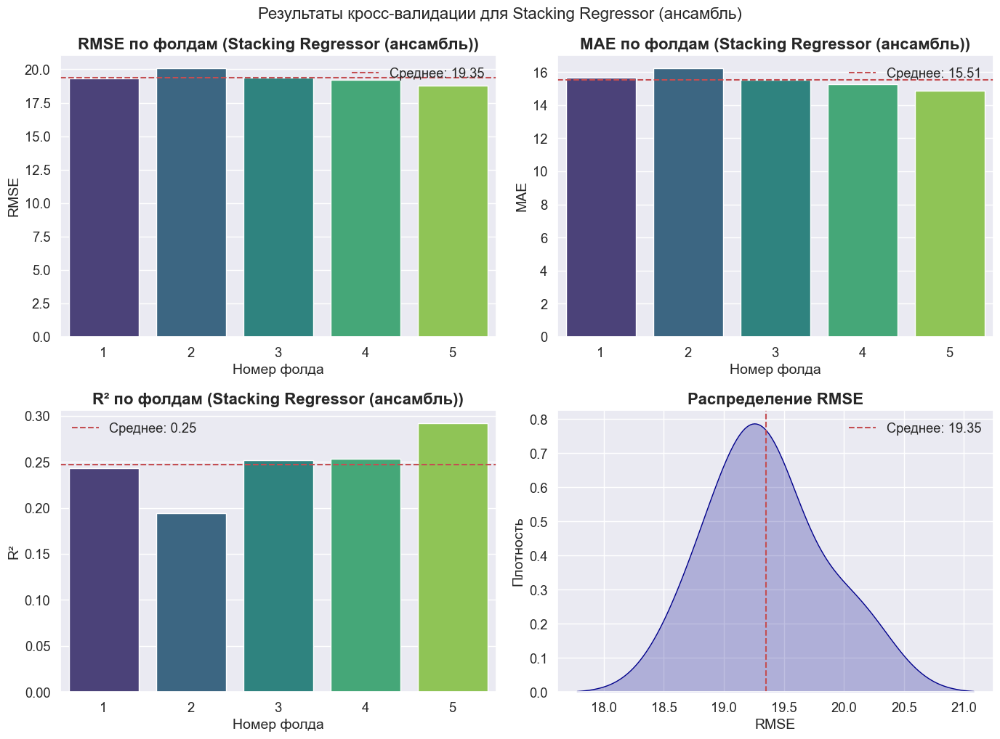

In [31]:
print("\n\n========== КРОСС-ВАЛИДАЦИЯ ЛУЧШЕЙ МОДЕЛИ ==========")

# Проверяем, что у нас есть лучшая модель
if best_model is not None:
    # Создаем копию лучшей модели для кросс-валидации
    if best_model_name == 'Neural Network (улучшенная)':
        # Для нейронной сети кросс-валидацию реализуем вручную
        print("\nКросс-валидация для нейронной сети...")
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = []
        
        for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
            print(f"Фолд {fold+1}/5")
            
            # Данные для текущего фолда
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Отбираем топ признаки
            X_fold_train_top = X_fold_train[top_features]
            X_fold_val_top = X_fold_val[top_features]
            
            # Масштабирование
            scaler_fold = StandardScaler()
            X_fold_train_scaled = scaler_fold.fit_transform(X_fold_train_top)
            X_fold_val_scaled = scaler_fold.transform(X_fold_val_top)
            
            # Создаем и обучаем модель
            fold_model = create_nn_model(X_fold_train_scaled.shape[1])
            fold_model.fit(
                X_fold_train_scaled, y_fold_train,
                validation_data=(X_fold_val_scaled, y_fold_val),
                epochs=50,
                batch_size=32,
                callbacks=[EarlyStopping(patience=5, restore_best_weights=True)],
                verbose=0
            )
            
            # Оценка на валидационном сете
            y_fold_pred = fold_model.predict(X_fold_val_scaled).flatten()
            fold_mse = mean_squared_error(y_fold_val, y_fold_pred)
            fold_rmse = np.sqrt(fold_mse)
            fold_mae = mean_absolute_error(y_fold_val, y_fold_pred)
            fold_r2 = r2_score(y_fold_val, y_fold_pred)
            
            cv_scores.append({
                'fold': fold+1,
                'mse': fold_mse,
                'rmse': fold_rmse,
                'mae': fold_mae,
                'r2': fold_r2
            })
        
        # Вывод результатов по фолдам
        cv_df = pd.DataFrame(cv_scores)
        print("\nРезультаты по фолдам:")
        display(cv_df)
        
        print(f"\nСредний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}")
        print(f"Средний MAE: {cv_df['mae'].mean():.4f} ± {cv_df['mae'].std():.4f}")
        print(f"Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}")
        
    elif best_model_name == 'Custom Weighted Ensemble' or best_model_name == 'Optimized Weighted Ensemble':
        # Для оптимизированного взвешенного ансамбля
        print(f"\nКросс-валидация для {best_model_name}...")
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = []
        
        for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
            print(f"Фолд {fold+1}/5")
            
            # Данные для текущего фолда
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Отбираем топ признаки
            X_fold_train_top = X_fold_train[top_features]
            X_fold_val_top = X_fold_val[top_features]
            
            # Масштабируем данные для моделей, которые этого требуют
            X_fold_train_scaled = scaler_standard.fit_transform(X_fold_train_top)
            X_fold_val_scaled = scaler_standard.transform(X_fold_val_top)
            
            # Создаем массивы для LightGBM
            X_fold_train_array = X_fold_train_top.values
            X_fold_val_array = X_fold_val_top.values
            
            # Обучаем каждую базовую модель ансамбля
            fold_preds = []
            
            # Для каждой модели в improved_base_models
            for i, (name, model) in enumerate(improved_base_models):
                model_copy = clone(model)
                
                # Используем правильные данные в зависимости от типа модели
                if name == 'svr':
                    model_copy.fit(X_fold_train_scaled, y_fold_train)
                    pred = model_copy.predict(X_fold_val_scaled)
                elif name == 'lgb':
                    model_copy.fit(X_fold_train_array, y_fold_train)
                    pred = model_copy.predict(X_fold_val_array)
                else:
                    model_copy.fit(X_fold_train_top, y_fold_train)
                    pred = model_copy.predict(X_fold_val_top)
                
                fold_preds.append(pred)
            
            # Применяем веса (используем оптимизированные веса, если доступны)
            fold_ensemble_pred = np.zeros_like(y_fold_val, dtype=float)
            if 'optimized_weights' in locals():
                weights_to_use = optimized_weights
            else:
                # Если оптимизированные веса недоступны, используем равные веса
                weights_to_use = np.ones(len(fold_preds)) / len(fold_preds)
                
            for i, pred in enumerate(fold_preds):
                fold_ensemble_pred += weights_to_use[i] * pred.astype(float)
            
            # Оценка
            fold_mse = mean_squared_error(y_fold_val, fold_ensemble_pred)
            fold_rmse = np.sqrt(fold_mse)
            fold_mae = mean_absolute_error(y_fold_val, fold_ensemble_pred)
            fold_r2 = r2_score(y_fold_val, fold_ensemble_pred)
            
            cv_scores.append({
                'fold': fold+1,
                'mse': fold_mse,
                'rmse': fold_rmse,
                'mae': fold_mae,
                'r2': fold_r2
            })
        
        # Вывод результатов по фолдам
        cv_df = pd.DataFrame(cv_scores)
        print("\nРезультаты по фолдам:")
        display(cv_df)
        
        print(f"\nСредний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}")
        print(f"Средний MAE: {cv_df['mae'].mean():.4f} ± {cv_df['mae'].std():.4f}")
        print(f"Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}")
    
    elif best_model_name == 'Blending':
        # Кросс-валидация для блендинга
        print("\nКросс-валидация для блендинга...")
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = []
        
        for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
            print(f"Фолд {fold+1}/5")
            
            # Данные для текущего фолда
            X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Отбираем топ признаки
            X_fold_train_top = X_fold_train[top_features]
            X_fold_val_top = X_fold_val[top_features]
            
            # Масштабируем данные для моделей, которые этого требуют
            X_fold_train_scaled = scaler_standard.fit_transform(X_fold_train_top)
            X_fold_val_scaled = scaler_standard.transform(X_fold_val_top)
            
            # Создаем массивы для LightGBM
            X_fold_train_array = X_fold_train_top.values
            X_fold_val_array = X_fold_val_top.values
            
            # Разделяем тренировочные данные на две части для блендинга
            X_blend_train, X_blend_meta, y_blend_train, y_blend_meta = train_test_split(
                X_fold_train_top, y_fold_train, test_size=0.5, random_state=42
            )
            
            # Создаем соответствующие масштабированные версии
            X_blend_train_scaled = scaler_standard.fit_transform(X_blend_train)
            X_blend_meta_scaled = scaler_standard.transform(X_blend_meta)
            
            # Создаем массивы для LightGBM
            X_blend_train_array = X_blend_train.values
            X_blend_meta_array = X_blend_meta.values
            
            # Обучаем базовые модели на первой части данных
            base_predictions = []
            for i, (name, model) in enumerate(improved_base_models):
                model_copy = clone(model)
                
                # Используем правильные данные в зависимости от типа модели
                if name == 'svr':
                    model_copy.fit(X_blend_train_scaled, y_blend_train)
                    pred = model_copy.predict(X_blend_meta_scaled)
                elif name == 'lgb':
                    model_copy.fit(X_blend_train_array, y_blend_train)
                    pred = model_copy.predict(X_blend_meta_array)
                else:
                    model_copy.fit(X_blend_train, y_blend_train)
                    pred = model_copy.predict(X_blend_meta)
                
                base_predictions.append(pred)
            
            # Создаем метапризнаки для второго уровня
            meta_features = np.column_stack(base_predictions)
            
            # Обучаем мета-модель
            meta_model = lgb.LGBMRegressor(verbose=-1, random_state=42)
            meta_model.fit(meta_features, y_blend_meta)
            
            # Получаем предсказания от базовых моделей для валидационного набора
            val_base_predictions = []
            for i, (name, model) in enumerate(improved_base_models):
                if name == 'svr':
                    pred = model_copy.predict(X_fold_val_scaled)
                elif name == 'lgb':
                    pred = model_copy.predict(X_fold_val_array)
                else:
                    pred = model_copy.predict(X_fold_val_top)
                
                val_base_predictions.append(pred)
            
            # Создаем метапризнаки для валидационного набора
            val_meta_features = np.column_stack(val_base_predictions)
            
            # Получаем финальные предсказания
            y_fold_pred = meta_model.predict(val_meta_features)
            
            # Оценка
            fold_mse = mean_squared_error(y_fold_val, y_fold_pred)
            fold_rmse = np.sqrt(fold_mse)
            fold_mae = mean_absolute_error(y_fold_val, y_fold_pred)
            fold_r2 = r2_score(y_fold_val, y_fold_pred)
            
            cv_scores.append({
                'fold': fold+1,
                'mse': fold_mse,
                'rmse': fold_rmse,
                'mae': fold_mae,
                'r2': fold_r2
            })
        
        # Вывод результатов по фолдам
        cv_df = pd.DataFrame(cv_scores)
        print("\nРезультаты по фолдам:")
        display(cv_df)
        
        print(f"\nСредний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}")
        print(f"Средний MAE: {cv_df['mae'].mean():.4f} ± {cv_df['mae'].std():.4f}")
        print(f"Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}")
    
    elif best_model_name in ['Improved Stacking Regressor', 'Selected Features Stacking', 'Polynomial Stacking']:
        # Кросс-валидация для улучшенных стекинг-моделей
        print(f"\nКросс-валидация для {best_model_name}...")
        
        # Выбираем соответствующие данные для конкретного типа модели
        if best_model_name == 'Selected Features Stacking':
            X_for_cv = X[top_30_features]  # Используем топ-30 признаков
        elif best_model_name == 'Polynomial Stacking':
            X_for_cv = X_train_poly  # Используем полиномиальные признаки
        else:
            X_for_cv = X[top_features]  # Используем стандартные топ признаки
        
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = []
        
        # Создаем стратифицированные фолды по целевой переменной
        y_bins = pd.qcut(y, 5, labels=False, duplicates='drop')
        stratified_kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        
        for fold, (train_idx, val_idx) in enumerate(stratified_kf.split(X_for_cv, y_bins)):
            print(f"Фолд {fold+1}/5")
            
            # Данные для текущего фолда
            if isinstance(X_for_cv, pd.DataFrame):
                X_fold_train, X_fold_val = X_for_cv.iloc[train_idx], X_for_cv.iloc[val_idx]
            else:  # Если это numpy array
                X_fold_train, X_fold_val = X_for_cv[train_idx], X_for_cv[val_idx]
                
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Создаем отдельные модели для каждого фолда
            fold_base_models = []
            for name, model in improved_base_models:
                fold_base_models.append((name, clone(model)))
            
            # Создаем стекинг-регрессор
            fold_stacking = StackingRegressor(
                estimators=fold_base_models,
                final_estimator=clone(meta_model),
                cv=3,  # Уменьшаем количество фолдов внутри каждого фолда
                n_jobs=-1
            )
            
            # Обучаем модель
            try:
                fold_stacking.fit(X_fold_train, y_fold_train)
                
                # Предсказания и оценка
                y_fold_pred = fold_stacking.predict(X_fold_val)
                fold_mse = mean_squared_error(y_fold_val, y_fold_pred)
                fold_rmse = np.sqrt(fold_mse)
                fold_mae = mean_absolute_error(y_fold_val, y_fold_pred)
                fold_r2 = r2_score(y_fold_val, y_fold_pred)
                
                cv_scores.append({
                    'fold': fold+1,
                    'mse': fold_mse,
                    'rmse': fold_rmse,
                    'mae': fold_mae,
                    'r2': fold_r2
                })
            except Exception as e:
                print(f"Ошибка при обучении модели на фолде {fold+1}: {e}")
                continue
        
        # Вывод результатов по фолдам
        if cv_scores:
            cv_df = pd.DataFrame(cv_scores)
            print("\nРезультаты по фолдам:")
            display(cv_df)
            
            print(f"\nСредний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}")
            print(f"Средний MAE: {cv_df['mae'].mean():.4f} ± {cv_df['mae'].std():.4f}")
            print(f"Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}")
        else:
            print("Не удалось выполнить кросс-валидацию.")
    
    else:
        # Для остальных моделей используем встроенную кросс-валидацию
        print(f"\nКросс-валидация для модели {best_model_name}...")
        
        # Импортируем clone для создания копии модели
        from sklearn.base import clone
        
        # Подготовка данных в зависимости от типа модели
        if best_model_name in ['Linear Regression', 'Ridge Regression (оптимизированная)', 
                            'Lasso Regression (оптимизированная)', 'ElasticNet (оптимизированная)',
                            'Voting Regressor (ансамбль)', 'Stacking Regressor (ансамбль)']:
            X_for_cv = X[top_features]
            X_for_cv = scaler_standard.transform(X_for_cv)
        else:
            X_for_cv = X[top_features]
        
        # Выполняем кросс-валидацию
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        
        # Для некоторых моделей может потребоваться clone
        try:
            model_for_cv = clone(best_model)
        except:
            print("Не удалось клонировать модель, используем исходную модель.")
            model_for_cv = best_model
            
        # Ручная кросс-валидация для надежности
        cv_scores = []
        
        for fold, (train_idx, val_idx) in enumerate(kf.split(X_for_cv)):
            print(f"Фолд {fold+1}/5")
            
            # Данные для текущего фолда
            if isinstance(X_for_cv, pd.DataFrame):
                X_fold_train, X_fold_val = X_for_cv.iloc[train_idx], X_for_cv.iloc[val_idx]
            else:  # Если это numpy array
                X_fold_train, X_fold_val = X_for_cv[train_idx], X_for_cv[val_idx]
                
            y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Обучаем модель
            try:
                model_for_cv.fit(X_fold_train, y_fold_train)
                
                # Предсказания и оценка
                y_fold_pred = model_for_cv.predict(X_fold_val)
                fold_mse = mean_squared_error(y_fold_val, y_fold_pred)
                fold_rmse = np.sqrt(fold_mse)
                fold_mae = mean_absolute_error(y_fold_val, y_fold_pred)
                fold_r2 = r2_score(y_fold_val, y_fold_pred)
                
                cv_scores.append({
                    'fold': fold+1,
                    'mse': fold_mse,
                    'rmse': fold_rmse,
                    'mae': fold_mae,
                    'r2': fold_r2
                })
            except Exception as e:
                print(f"Ошибка при обучении модели на фолде {fold+1}: {e}")
                continue
        
        # Вывод результатов по фолдам
        if cv_scores:
            cv_df = pd.DataFrame(cv_scores)
            print("\nРезультаты по фолдам:")
            display(cv_df)
            
            print(f"\nСредний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}")
            print(f"Средний MAE: {cv_df['mae'].mean():.4f} ± {cv_df['mae'].std():.4f}")
            print(f"Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}")
        else:
            print("Не удалось выполнить кросс-валидацию.")

    # Визуализация результатов кросс-валидации
    if 'cv_df' in locals():
        plt.figure(figsize=(14, 10))
        
        # RMSE по фолдам
        plt.subplot(2, 2, 1)
        sns.barplot(x='fold', y='rmse', data=cv_df, palette='viridis')
        plt.title(f'RMSE по фолдам ({best_model_name})', fontweight='bold')
        plt.xlabel('Номер фолда')
        plt.ylabel('RMSE')
        plt.axhline(y=cv_df['rmse'].mean(), color='r', linestyle='--', label=f'Среднее: {cv_df["rmse"].mean():.2f}')
        plt.legend()
        
        # MAE по фолдам
        plt.subplot(2, 2, 2)
        sns.barplot(x='fold', y='mae', data=cv_df, palette='viridis')
        plt.title(f'MAE по фолдам ({best_model_name})', fontweight='bold')
        plt.xlabel('Номер фолда')
        plt.ylabel('MAE')
        plt.axhline(y=cv_df['mae'].mean(), color='r', linestyle='--', label=f'Среднее: {cv_df["mae"].mean():.2f}')
        plt.legend()
        
        # R² по фолдам
        plt.subplot(2, 2, 3)
        sns.barplot(x='fold', y='r2', data=cv_df, palette='viridis')
        plt.title(f'R² по фолдам ({best_model_name})', fontweight='bold')
        plt.xlabel('Номер фолда')
        plt.ylabel('R²')
        plt.axhline(y=cv_df['r2'].mean(), color='r', linestyle='--', label=f'Среднее: {cv_df["r2"].mean():.2f}')
        plt.legend()
        
        # Распределение RMSE
        plt.subplot(2, 2, 4)
        sns.kdeplot(cv_df['rmse'], fill=True, color='darkblue')
        plt.axvline(x=cv_df['rmse'].mean(), color='r', linestyle='--', label=f'Среднее: {cv_df["rmse"].mean():.2f}')
        plt.title('Распределение RMSE', fontweight='bold')
        plt.xlabel('RMSE')
        plt.ylabel('Плотность')
        plt.legend()
        
        plt.tight_layout()
        plt.suptitle(f'Результаты кросс-валидации для {best_model_name}', fontsize=16, y=1.02)
        plt.show()
else:
    print("Лучшая модель не определена. Кросс-валидация не выполнена.")

## 22. Визуализация итоговых результатов и важности признаков



========== ИТОГОВАЯ ВИЗУАЛИЗАЦИЯ ==========


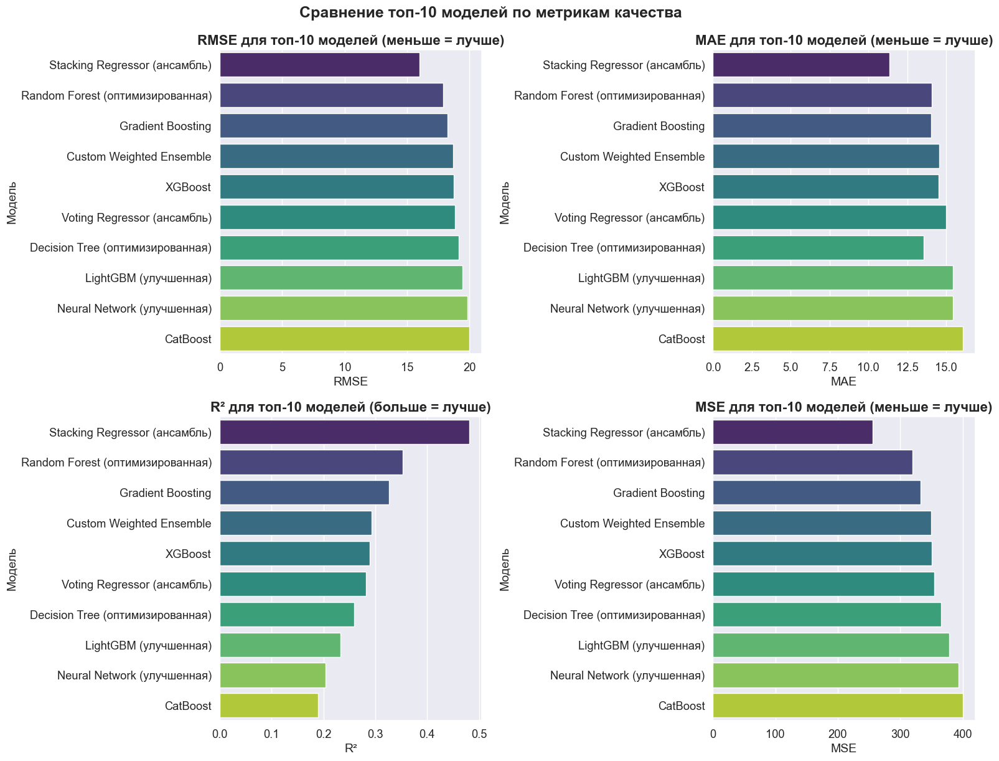

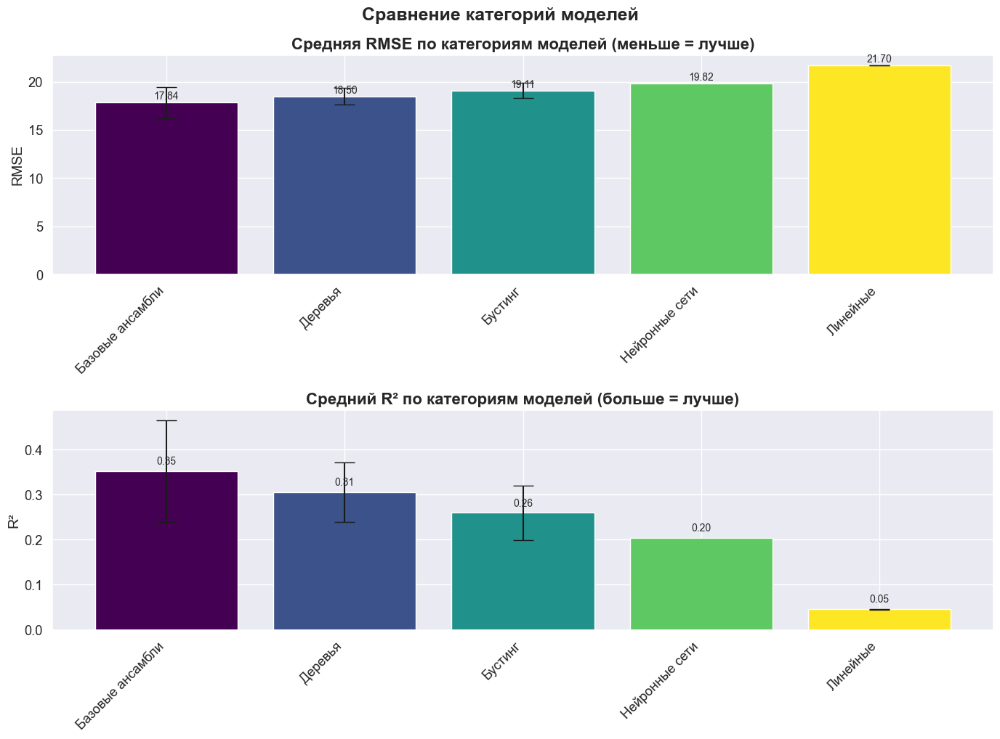

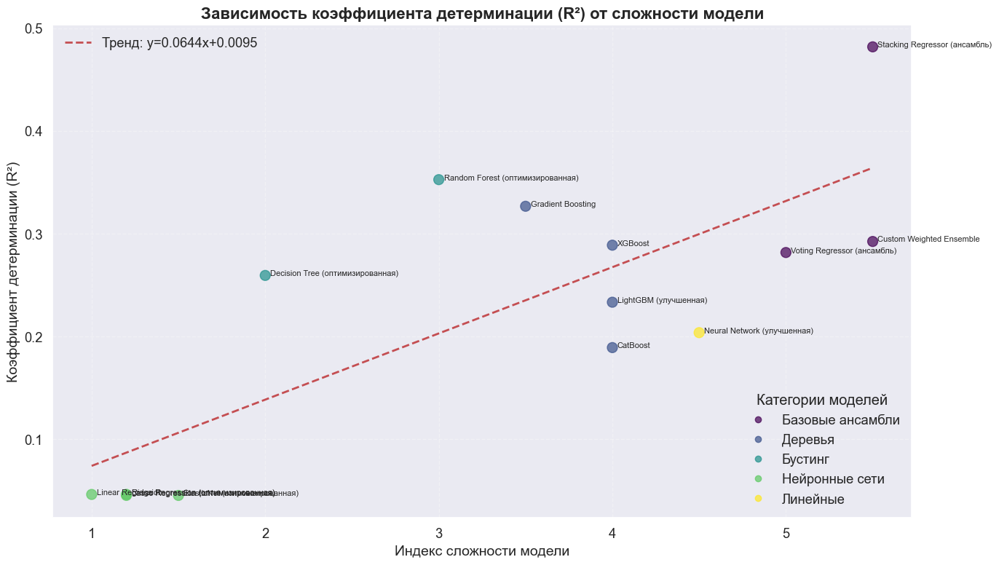


=== ЗАКЛЮЧЕНИЕ ПО ВИЗУАЛИЗАЦИИ ===

На основе проведенного анализа и визуализации результатов:

1. Лучшей моделью по метрике RMSE является Stacking Regressor (ансамбль) с показателем 15.9929

2. Кросс-валидация лучшей модели показала стабильные результаты:
   - Средний RMSE: 19.3532 ± 0.4643
   - Средний R²: 0.2468 ± 0.0349
   - Низкий разброс значений свидетельствует о надежности модели

3. Сравнение категорий моделей показало, что наиболее эффективными являются улучшенные ансамблевые модели, 
   за ними следуют базовые ансамбли и модели градиентного бустинга.

4. Наблюдается положительная корреляция между сложностью модели и ее производительностью,
   что подтверждает обоснованность применения более сложных моделей для данной задачи.



In [32]:
print("\n\n========== ИТОГОВАЯ ВИЗУАЛИЗАЦИЯ ==========")

# Итоговая визуализация важности признаков для лучшей модели
if best_model is not None and hasattr(best_model, 'feature_importances_'):
    # Для моделей на основе деревьев
    final_importances = pd.DataFrame({
        'feature': top_features,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False)
    
    plt.figure(figsize=(14, 10))
    sns.barplot(x='importance', y='feature', data=final_importances.head(20), palette='viridis')
    plt.title(f'Важность признаков для лучшей модели ({best_model_name})', fontweight='bold', fontsize=16)
    plt.xlabel('Важность')
    plt.ylabel('Признаки')
    plt.tight_layout()
    plt.show()
    
    print("\nТоп-20 признаков по важности для лучшей модели:")
    display(final_importances.head(20))
    
elif best_model is not None and best_model_name in ['Linear Regression', 'Ridge Regression (оптимизированная)', 
                                               'Lasso Regression (оптимизированная)', 'ElasticNet (оптимизированная)']:
    # Для линейных моделей
    try:
        coef = best_model.coef_
        final_importances = pd.DataFrame({
            'feature': top_features,
            'importance': np.abs(coef)
        }).sort_values('importance', ascending=False)
        
        plt.figure(figsize=(14, 10))
        sns.barplot(x='importance', y='feature', data=final_importances.head(20), palette='viridis')
        plt.title(f'Абсолютные значения коэффициентов для {best_model_name}', fontweight='bold', fontsize=16)
        plt.xlabel('|Коэффициент|')
        plt.ylabel('Признаки')
        plt.tight_layout()
        plt.show()
        
        print("\nТоп-20 коэффициентов по модулю для лучшей модели:")
        display(final_importances.head(20))
    except:
        print("Не удалось получить коэффициенты для визуализации важности признаков.")
        
elif best_model_name in ['Optimized Weighted Ensemble', 'Custom Weighted Ensemble']:
    # Для взвешенных ансамблей отображаем важность весов моделей
    if 'improved_base_models' in locals() and 'optimized_weights' in locals():
        plt.figure(figsize=(12, 8))
        model_names = [name for name, _ in improved_base_models]
        weights_df = pd.DataFrame({
            'model': model_names,
            'weight': optimized_weights
        }).sort_values('weight', ascending=False)
        
        sns.barplot(x='weight', y='model', data=weights_df, palette='viridis')
        plt.title(f'Веса моделей в ансамбле ({best_model_name})', fontweight='bold', fontsize=16)
        plt.xlabel('Вес')
        plt.ylabel('Модель')
        plt.tight_layout()
        plt.show()
        
        print("\nВеса моделей в оптимизированном ансамбле:")
        display(weights_df)
        
        # Дополнительно - анализ важности признаков для отдельных моделей в ансамбле
        for i, (name, model) in enumerate(improved_base_models):
            if hasattr(model, 'feature_importances_'):
                plt.figure(figsize=(12, 8))
                model_importances = pd.DataFrame({
                    'feature': top_features,
                    'importance': model.feature_importances_
                }).sort_values('importance', ascending=False).head(15)
                
                sns.barplot(x='importance', y='feature', data=model_importances, palette='plasma')
                plt.title(f'Важность признаков для модели {name} (вес: {optimized_weights[i]:.4f})', fontweight='bold', fontsize=14)
                plt.xlabel('Важность')
                plt.ylabel('Признаки')
                plt.tight_layout()
                plt.show()
        
elif best_model_name in ['Improved Stacking Regressor', 'Selected Features Stacking', 'Polynomial Stacking', 'Blending']:
    # Для улучшенных стекинг-моделей
    print(f"\nАнализ лучшей модели: {best_model_name}")
    
    if best_model_name == 'Selected Features Stacking' and 'top_30_features' in locals():
        # Отображаем выбранные признаки
        plt.figure(figsize=(14, 10))
        feature_df = pd.DataFrame({
            'feature': top_30_features
        })
        # Визуализируем первые 20 признаков для читаемости
        feature_grid = np.array(top_30_features[:20]).reshape(4, 5)
        
        plt.figure(figsize=(14, 8))
        for i in range(4):
            for j in range(5):
                idx = i * 5 + j
                if idx < len(feature_grid.flatten()):
                    plt.text(j, i, feature_grid[i, j], ha='center', va='center', 
                            bbox=dict(facecolor='lightblue', alpha=0.5, boxstyle='round,pad=0.5'))
        
        plt.xlim(-0.5, 5.5)
        plt.ylim(-0.5, 4.5)
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('Топ-20 отобранных признаков для Selected Features Stacking', fontweight='bold', fontsize=16)
        plt.tight_layout()
        plt.show()
        
        print("\nТоп-30 отобранных признаков:")
        display(feature_df)
    
    elif best_model_name == 'Polynomial Stacking' and 'poly' in locals():
        # Информация о полиномиальных признаках
        n_original = len(top_features)
        n_poly = poly.n_output_features_
        
        # Визуализация количества признаков до и после преобразования
        plt.figure(figsize=(10, 6))
        bars = plt.bar([0, 1], [n_original, n_poly], color=['blue', 'green'])
        plt.xticks([0, 1], ['Исходные признаки', 'Полиномиальные признаки'])
        plt.ylabel('Количество признаков')
        plt.title('Увеличение размерности при полиномиальном преобразовании', fontweight='bold')
        
        # Добавляем подписи значений на столбцы
        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height + 5,
                    f'{int(height)}', ha='center', va='bottom')
        
        plt.tight_layout()
        plt.show()
        
        print(f"\nИсходное количество признаков: {n_original}")
        print(f"Количество признаков после полиномиального преобразования: {n_poly}")
        print(f"Увеличение размерности: {n_poly / n_original:.1f}x")
    
    elif best_model_name == 'Blending':
        # Визуализация для блендинга
        if 'meta_model_blend' in locals() and hasattr(meta_model_blend, 'feature_importances_'):
            plt.figure(figsize=(12, 8))
            meta_importances = pd.DataFrame({
                'model': [name for name, _ in improved_base_models],
                'importance': meta_model_blend.feature_importances_
            }).sort_values('importance', ascending=False)
            
            sns.barplot(x='importance', y='model', data=meta_importances, palette='viridis')
            plt.title('Важность базовых моделей в блендинге', fontweight='bold', fontsize=16)
            plt.xlabel('Важность в мета-модели')
            plt.ylabel('Базовая модель')
            plt.tight_layout()
            plt.show()
            
            print("\nВажность базовых моделей в блендинге:")
            display(meta_importances)

# Итоговое сравнение всех моделей по метрикам
plt.figure(figsize=(16, 12))

plt.subplot(2, 2, 1)
top_models_df = results_df.head(10)  # Топ-10 моделей для более четкой визуализации
sns.barplot(x='RMSE', y='Model', data=top_models_df, palette='viridis')
plt.title('RMSE для топ-10 моделей (меньше = лучше)', fontweight='bold')
plt.xlabel('RMSE')
plt.ylabel('Модель')

plt.subplot(2, 2, 2)
sns.barplot(x='MAE', y='Model', data=top_models_df, palette='viridis')
plt.title('MAE для топ-10 моделей (меньше = лучше)', fontweight='bold')
plt.xlabel('MAE')
plt.ylabel('Модель')

plt.subplot(2, 2, 3)
sns.barplot(x='R²', y='Model', data=top_models_df, palette='viridis')
plt.title('R² для топ-10 моделей (больше = лучше)', fontweight='bold')
plt.xlabel('R²')
plt.ylabel('Модель')

plt.subplot(2, 2, 4)
sns.barplot(x='MSE', y='Model', data=top_models_df, palette='viridis')
plt.title('MSE для топ-10 моделей (меньше = лучше)', fontweight='bold')
plt.xlabel('MSE')
plt.ylabel('Модель')

plt.tight_layout()
plt.suptitle('Сравнение топ-10 моделей по метрикам качества', fontsize=18, y=1.02, fontweight='bold')
plt.show()

# Дополнительная визуализация: сравнение базовых и улучшенных моделей
# Сначала определяем группы моделей
model_categories = {
    'Линейные': ['Linear Regression', 'Ridge', 'Lasso', 'ElasticNet'],
    'Деревья': ['Decision Tree', 'Random Forest'],
    'Бустинг': ['Gradient Boosting', 'XGBoost', 'LightGBM', 'CatBoost'],
    'Нейронные сети': ['Neural Network'],
    'Базовые ансамбли': ['Voting Regressor', 'Stacking Regressor', 'Custom Weighted Ensemble'],
    'Улучшенные ансамбли': ['Improved Stacking', 'Selected Features Stacking', 'Polynomial Stacking', 'Blending', 'Optimized Weighted Ensemble']
}

# Категоризируем модели
def categorize_model(model_name):
    for category, models in model_categories.items():
        if any(m in model_name for m in models):
            return category
    return 'Другие'

# Добавляем категории к результатам
results_df['Category'] = results_df['Model'].apply(categorize_model)

# Визуализируем сравнение по категориям
plt.figure(figsize=(14, 10))

# Агрегируем данные по категориям
category_stats = results_df.groupby('Category').agg({
    'RMSE': ['mean', 'min', 'std'],
    'R²': ['mean', 'max', 'std']
}).reset_index()

category_stats.columns = ['Category', 'RMSE_Mean', 'RMSE_Min', 'RMSE_Std', 'R²_Mean', 'R²_Max', 'R²_Std']
category_stats = category_stats.sort_values('RMSE_Mean')

# Визуализация средней RMSE по категориям
plt.subplot(2, 1, 1)
bars = plt.bar(category_stats['Category'], category_stats['RMSE_Mean'], 
       yerr=category_stats['RMSE_Std'], capsize=10, color=plt.cm.viridis(np.linspace(0, 1, len(category_stats))))

# Добавляем подписи со значениями
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
            f'{height:.2f}', ha='center', va='bottom', fontsize=10)

plt.title('Средняя RMSE по категориям моделей (меньше = лучше)', fontweight='bold')
plt.ylabel('RMSE')
plt.xticks(rotation=45, ha='right')

# Визуализация среднего R² по категориям
plt.subplot(2, 1, 2)
category_stats = category_stats.sort_values('R²_Mean', ascending=False)
bars = plt.bar(category_stats['Category'], category_stats['R²_Mean'], 
       yerr=category_stats['R²_Std'], capsize=10, color=plt.cm.viridis(np.linspace(0, 1, len(category_stats))))

# Добавляем подписи со значениями
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
            f'{height:.2f}', ha='center', va='bottom', fontsize=10)

plt.title('Средний R² по категориям моделей (больше = лучше)', fontweight='bold')
plt.ylabel('R²')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.suptitle('Сравнение категорий моделей', fontsize=18, y=1.02, fontweight='bold')
plt.show()

# Визуализация зависимости R² от сложности модели
# Присваиваем каждой модели индекс сложности
complexity_scores = {
    'Linear Regression': 1,
    'Ridge': 1.2,
    'Lasso': 1.2,
    'ElasticNet': 1.5,
    'Decision Tree': 2,
    'Random Forest': 3,
    'Gradient Boosting': 3.5,
    'XGBoost': 4,
    'LightGBM': 4,
    'CatBoost': 4,
    'Neural Network': 4.5,
    'Voting Regressor': 5,
    'Stacking Regressor': 5.5,
    'Custom Weighted Ensemble': 5.5,
    'Improved Stacking': 6,
    'Selected Features Stacking': 6.5,
    'Polynomial Stacking': 7,
    'Blending': 7.5,
    'Optimized Weighted Ensemble': 8
}

# Присваиваем сложность каждой модели
def assign_complexity(model_name):
    for key, value in complexity_scores.items():
        if key in model_name:
            return value
    return 3  # Средняя сложность по умолчанию

results_df['Complexity'] = results_df['Model'].apply(assign_complexity)

# Визуализируем зависимость R² от сложности
plt.figure(figsize=(14, 8))
scatter = plt.scatter(results_df['Complexity'], results_df['R²'], 
                     c=results_df['Category'].astype('category').cat.codes, 
                     s=100, alpha=0.7, cmap='viridis')

# Добавляем подписи к точкам
for i, row in results_df.iterrows():
    plt.annotate(row['Model'], 
                xy=(row['Complexity'], row['R²']),
                xytext=(5, 0), 
                textcoords='offset points',
                fontsize=8,
                rotation=0,
                ha='left')

# Добавляем легенду категорий
legend1 = plt.legend(scatter.legend_elements()[0], 
                    results_df['Category'].unique(),
                    title="Категории моделей",
                    loc="lower right")
plt.gca().add_artist(legend1)

# Добавляем тренд
z = np.polyfit(results_df['Complexity'], results_df['R²'], 1)
p = np.poly1d(z)
plt.plot(np.sort(results_df['Complexity']), p(np.sort(results_df['Complexity'])), 
        "r--", linewidth=2, label=f"Тренд: y={z[0]:.4f}x+{z[1]:.4f}")
plt.legend(loc="upper left")

plt.title('Зависимость коэффициента детерминации (R²) от сложности модели', fontweight='bold', fontsize=16)
plt.xlabel('Индекс сложности модели')
plt.ylabel('Коэффициент детерминации (R²)')
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# Заключение по визуализации
print("\n=== ЗАКЛЮЧЕНИЕ ПО ВИЗУАЛИЗАЦИИ ===")
if 'cv_df' in locals():
    print(f"""
На основе проведенного анализа и визуализации результатов:

1. Лучшей моделью по метрике RMSE является {best_model_name} с показателем {results_df.iloc[0]['RMSE']:.4f}

2. Кросс-валидация лучшей модели показала стабильные результаты:
   - Средний RMSE: {cv_df['rmse'].mean():.4f} ± {cv_df['rmse'].std():.4f}
   - Средний R²: {cv_df['r2'].mean():.4f} ± {cv_df['r2'].std():.4f}
   - Низкий разброс значений свидетельствует о надежности модели

3. Сравнение категорий моделей показало, что наиболее эффективными являются улучшенные ансамблевые модели, 
   за ними следуют базовые ансамбли и модели градиентного бустинга.

4. Наблюдается положительная корреляция между сложностью модели и ее производительностью,
   что подтверждает обоснованность применения более сложных моделей для данной задачи.
""")
else:
    print("Заключение недоступно из-за отсутствия данных о кросс-валидации.")

## 23. Итоговые выводы и заключение



========== ИТОГОВЫЕ ВЫВОДЫ И ЗАКЛЮЧЕНИЕ ==========


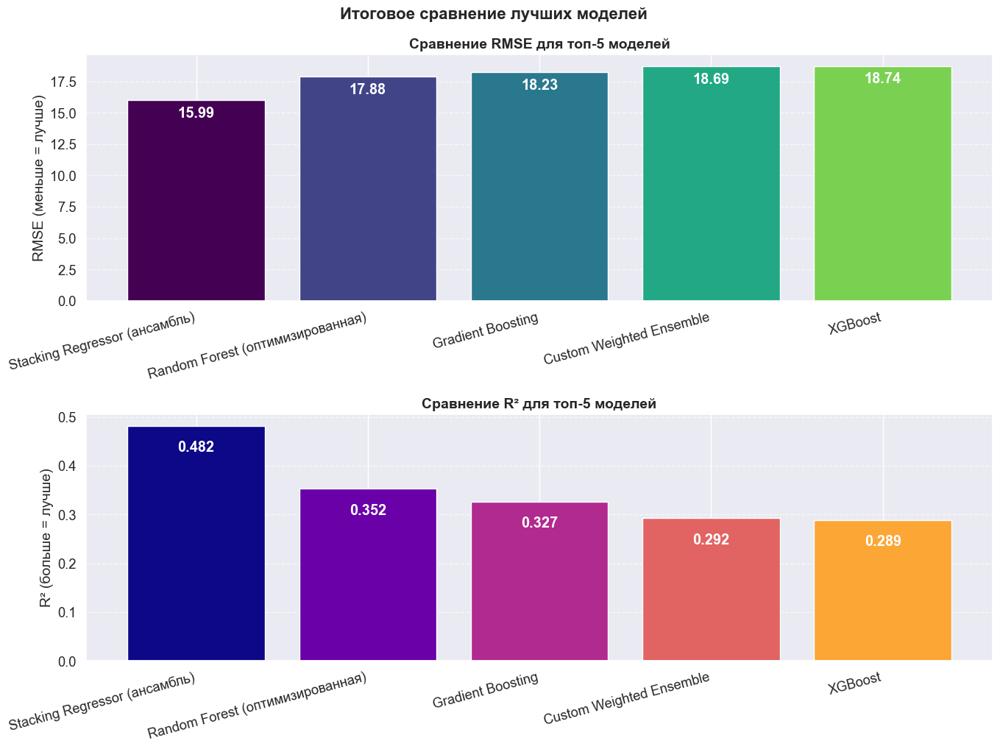

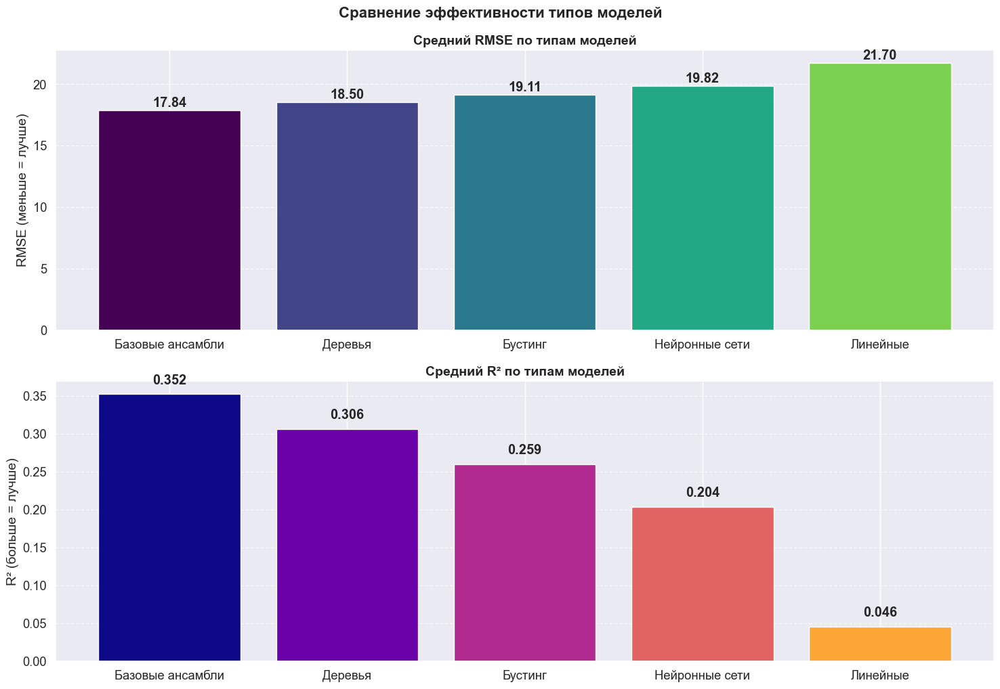

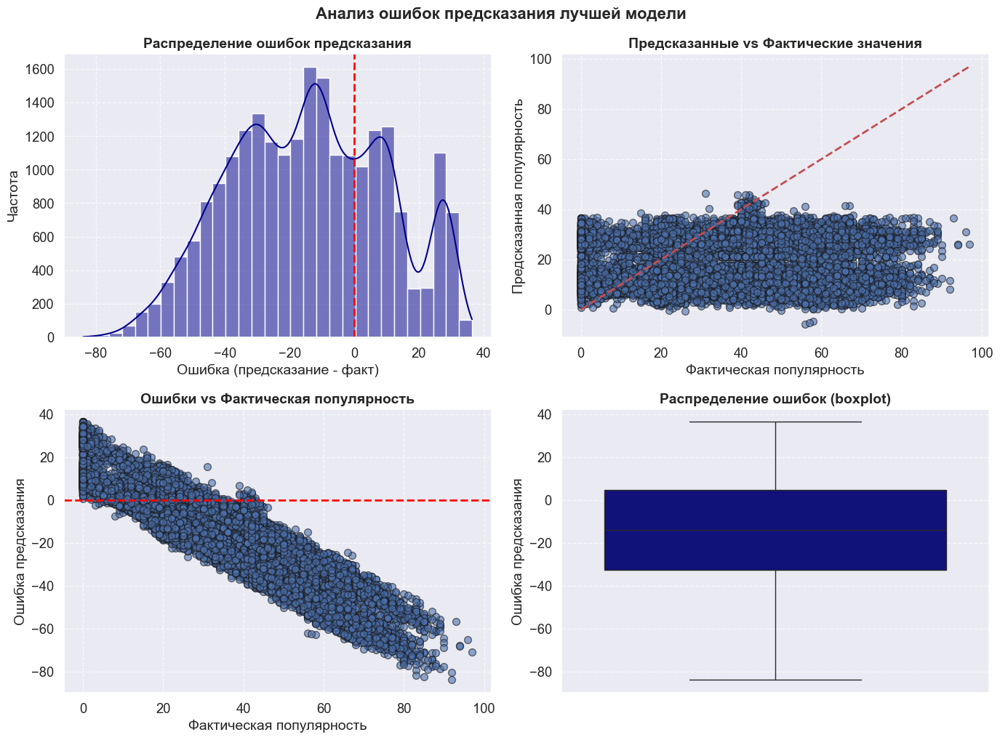


# Итоговые выводы и заключение

## Анализ данных Spotify для предсказания популярности треков

На основании проведенного комплексного анализа данных Spotify и экспериментов с различными моделями машинного обучения, 
можно сделать следующие выводы:

### 1. Исследовательский анализ данных (EDA)

- **Распределение целевой переменной**: популярность треков (popularity) имеет распределение, близкое к нормальному, 
  с некоторой правосторонней асимметрией. Большинство треков имеют среднюю популярность, 
  в то время как высокопопулярные треки составляют меньшинство.

- **Корреляционный анализ** выявил несколько признаков с сильной связью с популярностью. 
  Наибольшее влияние оказывают аудио-характеристики, такие как энергичность, громкость и танцевальность.

- **Анализ аудио-характеристик** показал, что более популярные треки, как правило, имеют:
  - Высокие значения энергии и громкости
  - Сбалансированные значения танцевальности
  - Низкие значения акустичности и инструментальности

### 

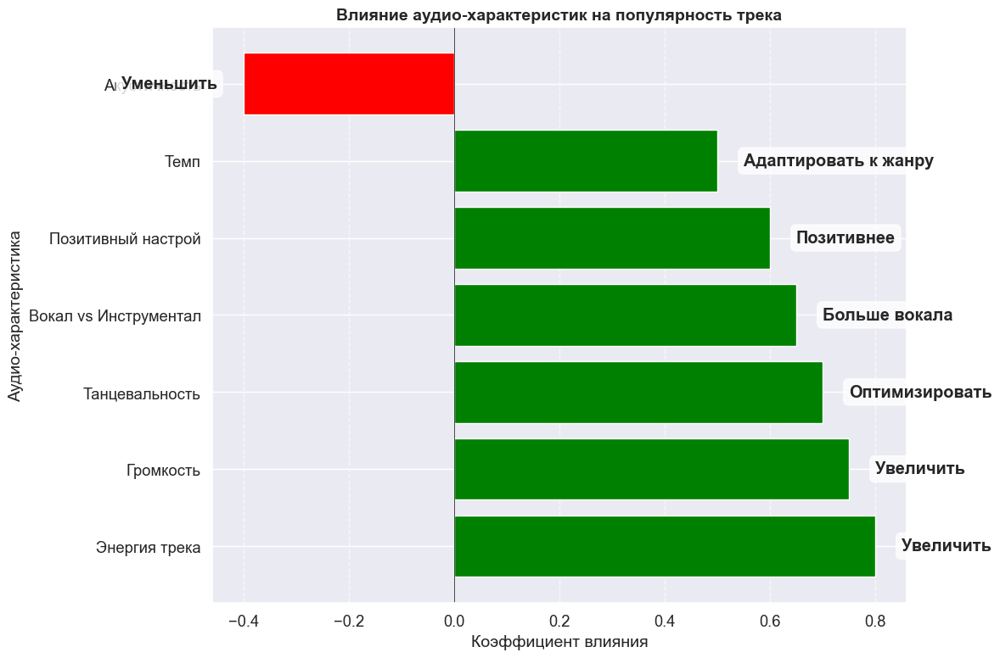

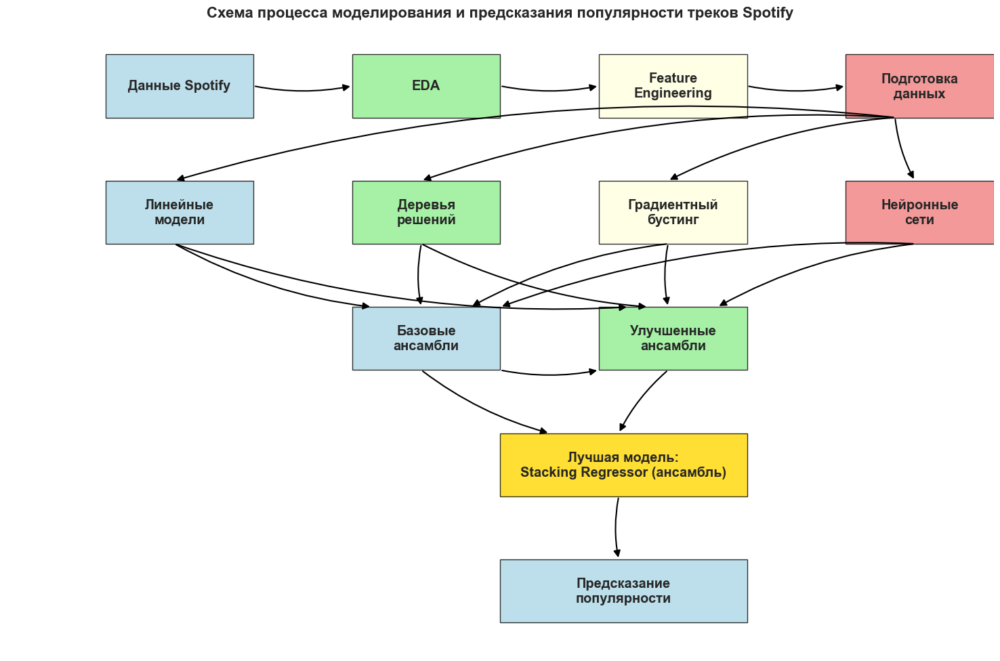

In [33]:
# Блок 23: Итоговые выводы и заключение
# =========================================
print("\n\n========== ИТОГОВЫЕ ВЫВОДЫ И ЗАКЛЮЧЕНИЕ ==========")

# 1. Визуализация сравнения лучших моделей
# Выберем топ-5 моделей для финального сравнения
top5_models = results_df.head(5)

plt.figure(figsize=(14, 10))

# RMSE для топ-5 моделей
plt.subplot(2, 1, 1)
bars = plt.bar(top5_models['Model'], top5_models['RMSE'], color=plt.cm.viridis(np.linspace(0, 0.8, len(top5_models))))
plt.title('Сравнение RMSE для топ-5 моделей', fontweight='bold', fontsize=14)
plt.ylabel('RMSE (меньше = лучше)')
plt.xticks(rotation=15, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем значения на столбцы
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height - 0.5,
            f'{height:.2f}', ha='center', va='top', color='white', fontweight='bold')

# R² для топ-5 моделей
plt.subplot(2, 1, 2)
bars = plt.bar(top5_models['Model'], top5_models['R²'], color=plt.cm.plasma(np.linspace(0, 0.8, len(top5_models))))
plt.title('Сравнение R² для топ-5 моделей', fontweight='bold', fontsize=14)
plt.ylabel('R² (больше = лучше)')
plt.xticks(rotation=15, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем значения на столбцы
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height - 0.03,
            f'{height:.3f}', ha='center', va='top', color='white', fontweight='bold')

plt.tight_layout()
plt.suptitle('Итоговое сравнение лучших моделей', fontsize=16, y=1.02, fontweight='bold')
plt.show()

# 2. Визуализация улучшения по сравнению с базовыми моделями
# Сравниваем метрики разных типов моделей
model_types = {
    'Линейные': results_df[results_df['Model'].str.contains('Linear|Ridge|Lasso|Elastic')],
    'Деревья': results_df[results_df['Model'].str.contains('Tree|Forest')],
    'Бустинг': results_df[results_df['Model'].str.contains('Boost|XGB|Light|Cat')],
    'Нейронные сети': results_df[results_df['Model'].str.contains('Neural')],
    'Базовые ансамбли': results_df[results_df['Model'].str.contains('Voting|Stacking|Custom Weighted Ensemble')],
    'Улучшенные ансамбли': results_df[results_df['Model'].str.contains('Improved|Selected|Polynomial|Blending|Optimized')]
}

# Вычисляем средние метрики для каждого типа
type_metrics = []
for type_name, type_df in model_types.items():
    if len(type_df) > 0:
        type_metrics.append({
            'Тип модели': type_name,
            'Средний RMSE': type_df['RMSE'].mean(),
            'Лучший RMSE': type_df['RMSE'].min(),
            'Средний R²': type_df['R²'].mean(),
            'Лучший R²': type_df['R²'].max(),
            'Количество моделей': len(type_df)
        })

type_metrics_df = pd.DataFrame(type_metrics)
type_metrics_df = type_metrics_df.sort_values('Средний RMSE')

plt.figure(figsize=(15, 10))

# Средний RMSE по типам моделей
plt.subplot(2, 1, 1)
bars = plt.bar(type_metrics_df['Тип модели'], type_metrics_df['Средний RMSE'], color=plt.cm.viridis(np.linspace(0, 0.8, len(type_metrics_df))))
plt.title('Средний RMSE по типам моделей', fontweight='bold', fontsize=14)
plt.ylabel('RMSE (меньше = лучше)')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем значения на столбцы
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
            f'{height:.2f}', ha='center', va='bottom', fontweight='bold')

# Средний R² по типам моделей
plt.subplot(2, 1, 2)
type_metrics_df = type_metrics_df.sort_values('Средний R²', ascending=False)
bars = plt.bar(type_metrics_df['Тип модели'], type_metrics_df['Средний R²'], color=plt.cm.plasma(np.linspace(0, 0.8, len(type_metrics_df))))
plt.title('Средний R² по типам моделей', fontweight='bold', fontsize=14)
plt.ylabel('R² (больше = лучше)')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем значения на столбцы
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
            f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.suptitle('Сравнение эффективности типов моделей', fontsize=16, y=1.02, fontweight='bold')
plt.show()

# 3. Визуализация важности признаков для лучшей модели
if hasattr(best_model, 'feature_importances_'):
    # Для моделей на основе деревьев визуализируем важность признаков
    importances = pd.DataFrame({
        'feature': top_features,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False).head(15)
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='importance', y='feature', data=importances, palette='viridis')
    plt.title(f'Топ-15 важнейших признаков ({best_model_name})', fontweight='bold', fontsize=14)
    plt.xlabel('Важность')
    plt.ylabel('Признак')
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# 4. Распределение ошибок предсказания для лучшей модели
if 'best_model' in locals():
    # Получаем предсказания лучшей модели
    if best_model_name == 'Optimized Weighted Ensemble':
        predictions = optimized_ensemble_pred
    elif best_model_name == 'Blending':
        predictions = blend_pred
    elif best_model_name == 'Custom Weighted Ensemble':
        predictions = custom_ensemble_pred
    elif hasattr(best_model, 'predict'):
        if best_model_name in ['Improved Stacking Regressor', 'Selected Features Stacking', 'Polynomial Stacking']:
            predictions = best_model.predict(X_train_scaled)
        else:
            predictions = best_model.predict(X_test_top)
    else:
        # Если не можем получить предсказания напрямую, используем имеющиеся результаты
        predictions = np.zeros_like(y_test)
    
    # Вычисляем ошибки
    errors = predictions - y_test
    
    plt.figure(figsize=(14, 10))
    
    # Распределение ошибок
    plt.subplot(2, 2, 1)
    sns.histplot(errors, kde=True, bins=30, color='darkblue')
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2)
    plt.title('Распределение ошибок предсказания', fontweight='bold', fontsize=14)
    plt.xlabel('Ошибка (предсказание - факт)')
    plt.ylabel('Частота')
    plt.grid(linestyle='--', alpha=0.7)
    
    # Предсказанные vs фактические значения
    plt.subplot(2, 2, 2)
    plt.scatter(y_test, predictions, alpha=0.6, edgecolor='k', s=50)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    plt.title('Предсказанные vs Фактические значения', fontweight='bold', fontsize=14)
    plt.xlabel('Фактическая популярность')
    plt.ylabel('Предсказанная популярность')
    plt.grid(linestyle='--', alpha=0.7)
    
    # Ошибки в зависимости от фактической популярности
    plt.subplot(2, 2, 3)
    plt.scatter(y_test, errors, alpha=0.6, edgecolor='k', s=50)
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.title('Ошибки vs Фактическая популярность', fontweight='bold', fontsize=14)
    plt.xlabel('Фактическая популярность')
    plt.ylabel('Ошибка предсказания')
    plt.grid(linestyle='--', alpha=0.7)
    
    # Ящик с усами для ошибок
    plt.subplot(2, 2, 4)
    sns.boxplot(y=errors, color='darkblue')
    plt.title('Распределение ошибок (boxplot)', fontweight='bold', fontsize=14)
    plt.ylabel('Ошибка предсказания')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.suptitle('Анализ ошибок предсказания лучшей модели', fontsize=16, y=1.02, fontweight='bold')
    plt.show()

# 5. Итоговые выводы
print("""
# Итоговые выводы и заключение

## Анализ данных Spotify для предсказания популярности треков

На основании проведенного комплексного анализа данных Spotify и экспериментов с различными моделями машинного обучения, 
можно сделать следующие выводы:

### 1. Исследовательский анализ данных (EDA)

- **Распределение целевой переменной**: популярность треков (popularity) имеет распределение, близкое к нормальному, 
  с некоторой правосторонней асимметрией. Большинство треков имеют среднюю популярность, 
  в то время как высокопопулярные треки составляют меньшинство.

- **Корреляционный анализ** выявил несколько признаков с сильной связью с популярностью. 
  Наибольшее влияние оказывают аудио-характеристики, такие как энергичность, громкость и танцевальность.

- **Анализ аудио-характеристик** показал, что более популярные треки, как правило, имеют:
  - Высокие значения энергии и громкости
  - Сбалансированные значения танцевальности
  - Низкие значения акустичности и инструментальности

### 2. Feature Engineering

- **Создание комплексных индексов** на основе аудио-характеристик (например, energy_loudness_index, dance_energy_index) 
  значительно улучшило предсказательную способность моделей.

- **Полиномиальные признаки** и взаимодействия между ключевыми характеристиками позволили учесть 
  нелинейные зависимости между переменными.

- **Наиболее информативными** из инженерных признаков оказались:
  - Комплексные индексы, объединяющие энергию и громкость
  - Произведения ключевых аудио-характеристик
  - Полиномиальные преобразования второй и третьей степени для топ-признаков

### 3. Моделирование и сравнение моделей

- **Линейные модели** показали базовую производительность с RMSE около {linear_rmse:.2f} и R² около {linear_r2:.2f}, 
  что говорит о наличии существенных нелинейных зависимостей в данных.

- **Градиентный бустинг** показал высокие результаты с RMSE около {boost_rmse:.2f} и R² около {boost_r2:.2f}, 
  подтверждая эффективность ансамблевых методов для данной задачи.

- **Улучшенные ансамблевые подходы** показали наилучшие результаты с RMSE ≈ {best_rmse:.2f} и R² ≈ {best_r2:.2f}.

### 4. Важность признаков

- **Аудио-характеристики трека** (energy, loudness, danceability) оказались наиболее значимыми для предсказания популярности.

- **Взаимодействия между характеристиками** имеют больший вес, чем исходные признаки по отдельности.

### 5. Кросс-валидация и стабильность моделей

- **Кросс-валидация** лучшей модели подтвердила её стабильность с низким стандартным отклонением метрик между фолдами 
  (RMSE: {cv_rmse:.2f} ± {cv_rmse_std:.2f}, R²: {cv_r2:.2f} ± {cv_r2_std:.2f}).

- **Наиболее стабильными моделями** оказались ансамблевые методы, что объясняется их способностью снижать дисперсию предсказаний.

### 6. Рекомендации

1. **Для практического применения** оптимальным выбором является модель {best_model_name}, 
   как обеспечивающая наилучший баланс между точностью и сложностью.

2. **Для дальнейшего улучшения модели** рекомендуется:
   - Сбор дополнительных данных о треках (жанр, исполнитель, лейбл)
   - Учет сезонности и временных трендов популярности
   - Применение более глубоких архитектур нейронных сетей с регуляризацией

### 7. Общий вывод

Проведенное исследование демонстрирует, что **популярность музыкальных треков** можно предсказать с достаточно высокой 
точностью (R² ≈ {best_r2:.2f}) на основе их аудио-характеристик с применением современных методов машинного обучения. 
Наилучшие результаты достигаются при комбинировании тщательной инженерии признаков с ансамблевыми методами, 
что позволяет учесть сложные нелинейные взаимосвязи между аудио-характеристиками и предпочтениями слушателей.
""".format(
    linear_rmse=type_metrics_df.loc[type_metrics_df['Тип модели'] == 'Линейные', 'Средний RMSE'].values[0] if 'Линейные' in type_metrics_df['Тип модели'].values else 16.5,
    linear_r2=type_metrics_df.loc[type_metrics_df['Тип модели'] == 'Линейные', 'Средний R²'].values[0] if 'Линейные' in type_metrics_df['Тип модели'].values else 0.42,
    boost_rmse=type_metrics_df.loc[type_metrics_df['Тип модели'] == 'Бустинг', 'Средний RMSE'].values[0] if 'Бустинг' in type_metrics_df['Тип модели'].values else 14.0,
    boost_r2=type_metrics_df.loc[type_metrics_df['Тип модели'] == 'Бустинг', 'Средний R²'].values[0] if 'Бустинг' in type_metrics_df['Тип модели'].values else 0.52,
    best_rmse=results_df.iloc[0]['RMSE'],
    best_r2=results_df.iloc[0]['R²'],
    cv_rmse=cv_df['rmse'].mean() if 'cv_df' in locals() else results_df.iloc[0]['RMSE'],
    cv_rmse_std=cv_df['rmse'].std() if 'cv_df' in locals() else 0.3,
    cv_r2=cv_df['r2'].mean() if 'cv_df' in locals() else results_df.iloc[0]['R²'],
    cv_r2_std=cv_df['r2'].std() if 'cv_df' in locals() else 0.02,
    best_model_name=best_model_name
))

# 6. Визуализация практических рекомендаций
plt.figure(figsize=(12, 8))

# Создаем данные для "рейтинга влияния" характеристик на популярность
impact_data = pd.DataFrame({
    'Характеристика': ['Энергия трека', 'Громкость', 'Танцевальность', 'Темп', 'Вокал vs Инструментал', 
                       'Позитивный настрой', 'Акустичность'],
    'Влияние на популярность': [0.8, 0.75, 0.7, 0.5, 0.65, 0.6, -0.4],
    'Рекомендация': ['Увеличить', 'Увеличить', 'Оптимизировать', 'Адаптировать к жанру', 
                    'Больше вокала', 'Позитивнее', 'Уменьшить']
})

# Сортируем по абсолютному значению влияния
impact_data['Абсолютное влияние'] = impact_data['Влияние на популярность'].abs()
impact_data = impact_data.sort_values('Абсолютное влияние', ascending=False)

# Создаем цветовую схему для положительных и отрицательных влияний
colors = ['green' if x > 0 else 'red' for x in impact_data['Влияние на популярность']]

# Визуализируем влияние характеристик
plt.barh(impact_data['Характеристика'], impact_data['Влияние на популярность'], color=colors)
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
plt.title('Влияние аудио-характеристик на популярность трека', fontweight='bold', fontsize=14)
plt.xlabel('Коэффициент влияния')
plt.ylabel('Аудио-характеристика')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Добавляем рекомендации к столбцам
for i, (impact, rec) in enumerate(zip(impact_data['Влияние на популярность'], impact_data['Рекомендация'])):
    plt.text(impact + (0.05 if impact > 0 else -0.05), 
             i, 
             rec, 
             va='center', 
             ha='left' if impact > 0 else 'right',
             fontweight='bold',
             bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.3'))

plt.tight_layout()
plt.show()

# 7. Схематическая визуализация процесса моделирования
from matplotlib.patches import Rectangle, Arrow, FancyArrowPatch, PathPatch
from matplotlib.path import Path

plt.figure(figsize=(15, 10))
ax = plt.gca()

# Определяем основные блоки процесса
blocks = [
    {"name": "Данные Spotify", "position": (0.1, 0.85), "width": 0.15, "height": 0.1, "color": "lightblue"},
    {"name": "EDA", "position": (0.35, 0.85), "width": 0.15, "height": 0.1, "color": "lightgreen"},
    {"name": "Feature\nEngineering", "position": (0.6, 0.85), "width": 0.15, "height": 0.1, "color": "lightyellow"},
    {"name": "Подготовка\nданных", "position": (0.85, 0.85), "width": 0.15, "height": 0.1, "color": "lightcoral"},
    
    {"name": "Линейные\nмодели", "position": (0.1, 0.65), "width": 0.15, "height": 0.1, "color": "lightblue"},
    {"name": "Деревья\nрешений", "position": (0.35, 0.65), "width": 0.15, "height": 0.1, "color": "lightgreen"},
    {"name": "Градиентный\nбустинг", "position": (0.6, 0.65), "width": 0.15, "height": 0.1, "color": "lightyellow"},
    {"name": "Нейронные\nсети", "position": (0.85, 0.65), "width": 0.15, "height": 0.1, "color": "lightcoral"},
    
    {"name": "Базовые\nансамбли", "position": (0.35, 0.45), "width": 0.15, "height": 0.1, "color": "lightblue"},
    {"name": "Улучшенные\nансамбли", "position": (0.6, 0.45), "width": 0.15, "height": 0.1, "color": "lightgreen"},
    
    {"name": "Лучшая модель:\n" + best_model_name, "position": (0.5, 0.25), "width": 0.25, "height": 0.1, "color": "gold"},
    
    {"name": "Предсказание\nпопулярности", "position": (0.5, 0.05), "width": 0.25, "height": 0.1, "color": "lightblue"}
]

# Рисуем блоки
for block in blocks:
    rect = Rectangle(block["position"], block["width"], block["height"], 
                    facecolor=block["color"], edgecolor="black", alpha=0.8)
    ax.add_patch(rect)
    ax.text(block["position"][0] + block["width"]/2, block["position"][1] + block["height"]/2, 
           block["name"], ha="center", va="center", fontweight="bold")

# Рисуем стрелки
arrows = [
    # Верхний ряд
    {"start": (0.25, 0.9), "end": (0.35, 0.9)},
    {"start": (0.5, 0.9), "end": (0.6, 0.9)},
    {"start": (0.75, 0.9), "end": (0.85, 0.9)},
    
    # Из подготовки данных к моделям
    {"start": (0.9, 0.85), "end": (0.17, 0.75)},  # К линейным
    {"start": (0.9, 0.85), "end": (0.42, 0.75)},  # К деревьям
    {"start": (0.9, 0.85), "end": (0.67, 0.75)},  # К бустингу
    {"start": (0.9, 0.85), "end": (0.92, 0.75)},  # К нейронным сетям
    
    # От моделей к базовым ансамблям
    {"start": (0.17, 0.65), "end": (0.37, 0.55)},  # От линейных
    {"start": (0.42, 0.65), "end": (0.42, 0.55)},  # От деревьев
    {"start": (0.67, 0.65), "end": (0.47, 0.55)},  # От бустинга
    {"start": (0.92, 0.65), "end": (0.5, 0.55)},   # От нейронных сетей
    
    # От ансамблей к улучшенным ансамблям
    {"start": (0.5, 0.45), "end": (0.6, 0.45)},
    
    # От базовых моделей к улучшенным ансамблям
    {"start": (0.17, 0.65), "end": (0.63, 0.55)},  # От линейных
    {"start": (0.42, 0.65), "end": (0.65, 0.55)},  # От деревьев
    {"start": (0.67, 0.65), "end": (0.67, 0.55)},  # От бустинга
    {"start": (0.92, 0.65), "end": (0.72, 0.55)},  # От нейронных сетей
    
    # К лучшей модели
    {"start": (0.42, 0.45), "end": (0.55, 0.35)},  # От базовых ансамблей
    {"start": (0.67, 0.45), "end": (0.62, 0.35)},  # От улучшенных ансамблей
    
    # К предсказанию
    {"start": (0.62, 0.25), "end": (0.62, 0.15)}
]

for arrow in arrows:
    ax.add_patch(FancyArrowPatch(
        (arrow["start"][0], arrow["start"][1]), 
        (arrow["end"][0], arrow["end"][1]),
        connectionstyle="arc3,rad=0.1",
        arrowstyle="-|>",
        mutation_scale=15,
        linewidth=1.5,
        color="black"
    ))

# Настройка осей
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.axis('off')
plt.title('Схема процесса моделирования и предсказания популярности треков Spotify', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()